<a href="https://colab.research.google.com/github/jidemaestri/deeplearning/blob/main/MNIST_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Basic GAN

### Importing Libraries


In [99]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm #gives a progress bar of the process
import matplotlib.pyplot as plt


In [100]:
#channels = r,g,b or grayscale
#size = image_size
#tensor = multidimensional array

def show(tensor, channels=1, size=(28,28), num=16):
  data = tensor.detach().cpu().view(-1, channels, *size)
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)       #compatibility between pytorch & plt --- the order of the dimensions of pytorch and matplotlib are different
  plt.imshow(grid)
  plt.show()

### Hyperameters

In [101]:
  # setup of parameters

  epochs = 500
  current_step = 0
  info_step = 300   #how many steps are we going to show information on the screen
  mean_gen_loss = 0
  mean_disc_loss = 0

  z_dim = 64        #noise vector
  learning_rate = 0.00001
  loss_function = nn.BCEWithLogitsLoss()
  batch_size = 128         #how much images are we going to process at once
  device = 'cuda'

  dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=batch_size)

## Models

In [102]:
# Generator

def genBlock(input, output):              #innput - output sizes
  return nn.Sequential(
      nn.Linear(input, output),
                nn.BatchNorm1d(output),
                nn.ReLU(inplace=True)                 #helps the neural network to learn more complex forms
)

  # In order to learn complex functions, we introduce non linear functions


In [103]:
class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim),        #receiving a noise vector of dimensionality 64
        genBlock(z_dim*2, h_dim*2),
        genBlock(z_dim*4, h_dim*4),
        genBlock(z_dim*8, h_dim*8),
        genBlock(z_dim*16, i_dim),            #producing an image with dimensionality (28x28) > i_dim = 784
        nn.Sigmoid(),        #to obtain a value between 0 and 1
  )

  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

In [104]:
def discBlock(input, output):       #sizes
  return nn.Sequential(
      nn.Linear(input, output),
      nn.LeakyReLU(0.2),

  )


In [105]:
class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4),          #input is a image with dim (28x28)
        discBlock(h_dim*4, h_dim*2),
        discBlock(h_dim*2, h_dim),
        nn.Linear(h_dim, 1)
    )

  def forward(self, image):
    return self.disc(image)

#the discriminator only has an output which says if the images is real or not

In [106]:
gen = Generator(z_dim).to(device)
gen_optimizer = torch.optim.Adam(gen.parameters(),lr=learning_rate)
disc = Discriminator().to(device)
disc_optimizer = torch.optim.Adam(disc.parameters(),lr=learning_rate)



## Summary

In [107]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Sequential(
      (0): Linear(in_features=1024, out_features=784, bias=True)
      (1): BatchNorm1d(784, e

In [108]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [109]:
x, y = next(iter(dataloader))

In [110]:
print(x.shape, y.shape)

torch.Size([128, 1, 28, 28]) torch.Size([128])


In [111]:
noise = gen_noise(batch_size, z_dim)
#fake = gen(noise)
#show(fake)

In [112]:
noise.shape

torch.Size([128, 64])

In [113]:
fake=gen(noise)

## Calculating the Loss

In [114]:
def calc_gen_loss(loss_function, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim) #generating a noise vector
  fake = gen(noise)   #generating a new vector
  pred = disc(fake)  #we pass the output of the generator through the discriminator -> this is the prediction of what the discriminator thinks.
  targets = torch.ones_like(pred) #we create a tensor of ones | the generator tries to fool the discriminator, so we are compairing the output to 1 (simulating a real)
  gen_loss=loss_function(pred, targets)

  return gen_loss

def calc_disc_loss(loss_function, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)   #generating a new vector

  #with fake images
  disc_fake = disc(fake.detach()) #we dont want to change the parameters of the generator when we are optimizing the discriminator
  disc_fake_targets=torch.zeros_like(disc_fake)      #simulating fake images so 0
  disc_fake_loss=loss_function(disc_fake, disc_fake_targets)

  #with real images
  disc_real = disc(real)
  disc_real_targets = torch.zeros_like(disc_real)
  disc_real_loss=loss_function(disc_real, disc_real_targets)

  disc_global_loss=(disc_fake_loss+disc_real_loss)/2 #average of real+fake

  return disc_global_loss

  0%|          | 0/469 [00:00<?, ?it/s]

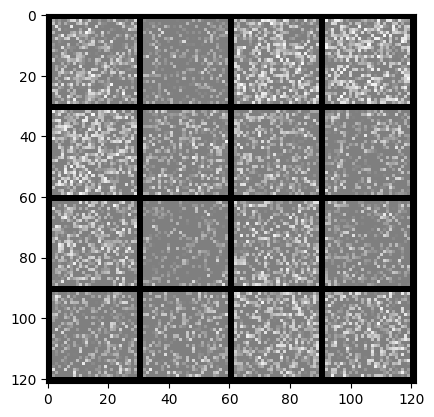

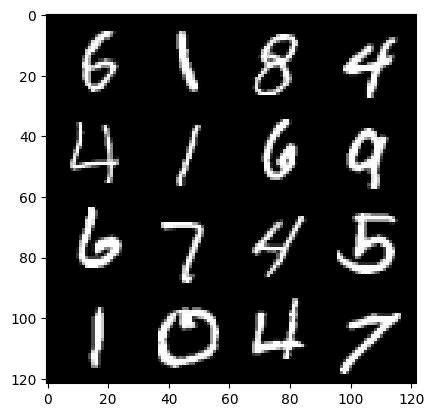

0: step 300 / Gen loss: 4.894754742185274 / disc_loss:0.21324223906422674


  0%|          | 0/469 [00:00<?, ?it/s]

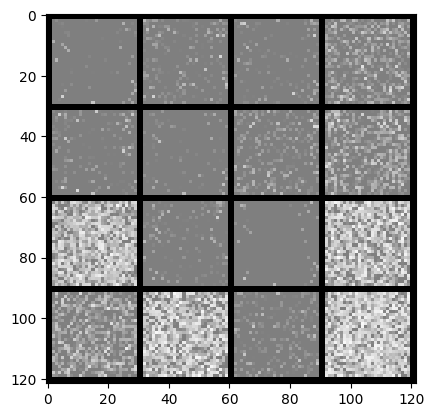

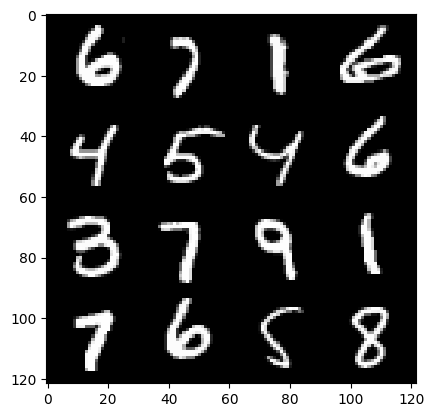

1: step 600 / Gen loss: 13.363023265202848 / disc_loss:0.009122099874075506


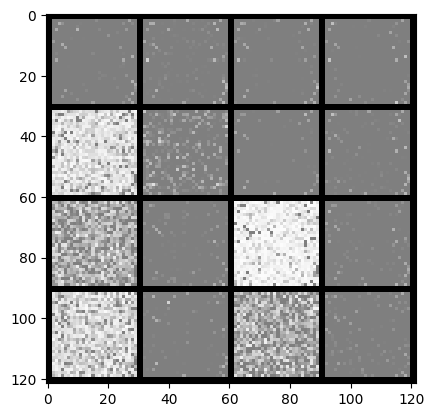

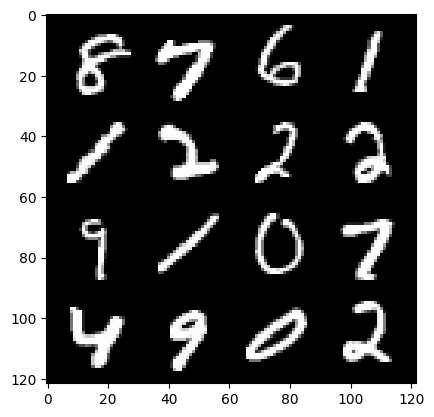

1: step 900 / Gen loss: 17.337781416575105 / disc_loss:0.002219081052850621


  0%|          | 0/469 [00:00<?, ?it/s]

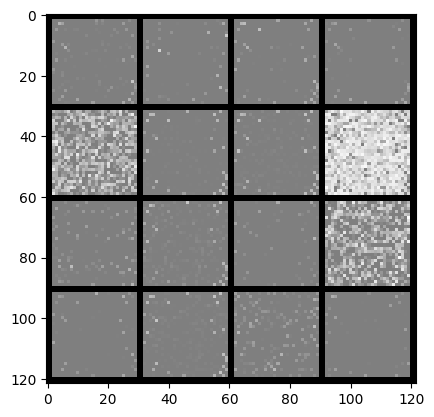

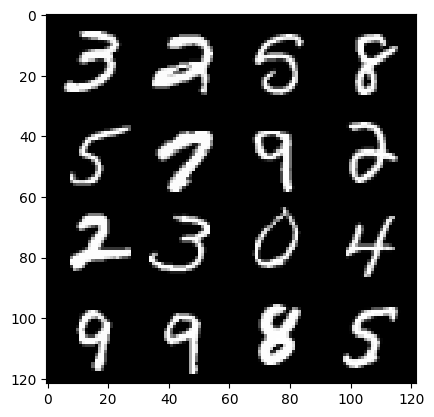

2: step 1200 / Gen loss: 19.739909807841 / disc_loss:0.0009792184015774788


  0%|          | 0/469 [00:00<?, ?it/s]

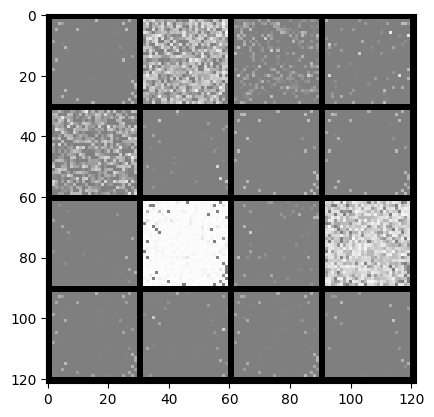

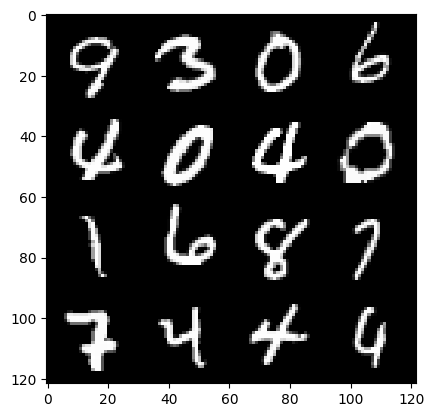

3: step 1500 / Gen loss: 21.565699990590417 / disc_loss:0.000522650025280503


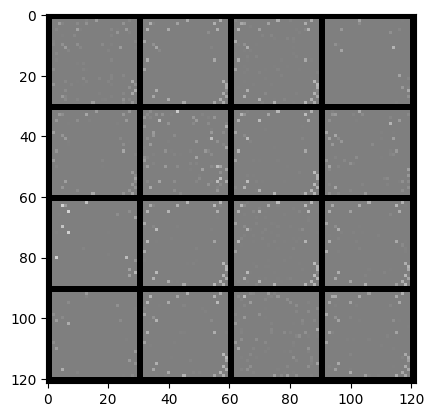

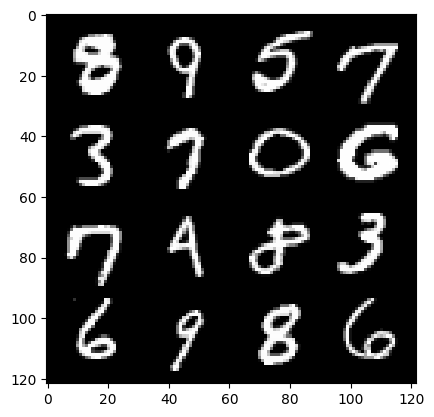

3: step 1800 / Gen loss: 23.08351402282713 / disc_loss:0.0003271407139739801


  0%|          | 0/469 [00:00<?, ?it/s]

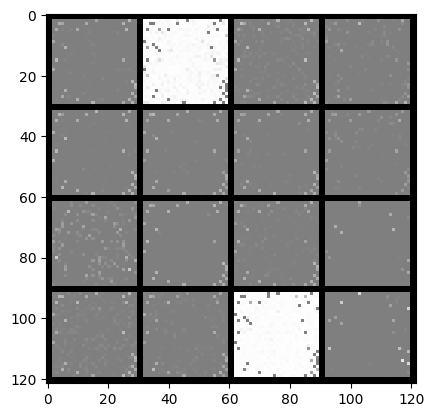

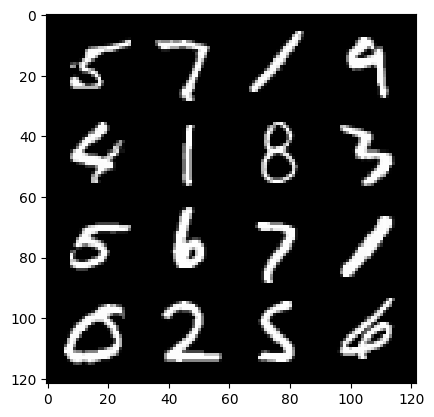

4: step 2100 / Gen loss: 24.393347225189213 / disc_loss:0.00021088768267266754


  0%|          | 0/469 [00:00<?, ?it/s]

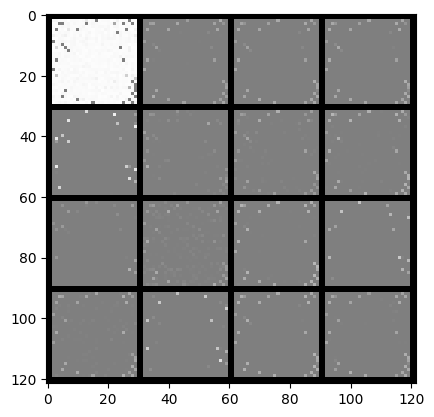

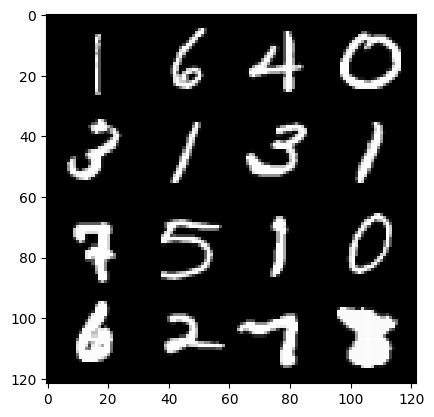

5: step 2400 / Gen loss: 25.574793758392342 / disc_loss:0.00014630502151703685


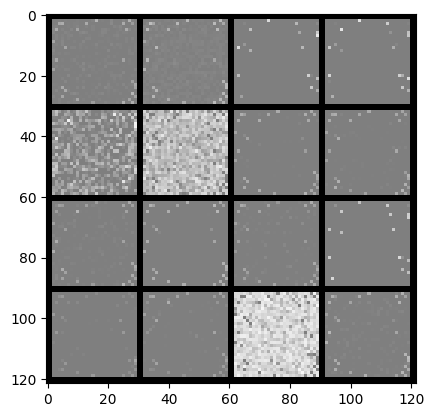

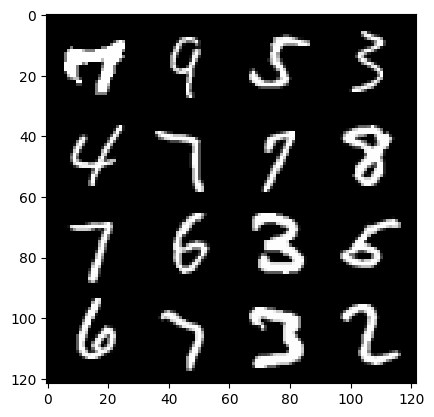

5: step 2700 / Gen loss: 26.667727540334063 / disc_loss:0.00010795119294925829


  0%|          | 0/469 [00:00<?, ?it/s]

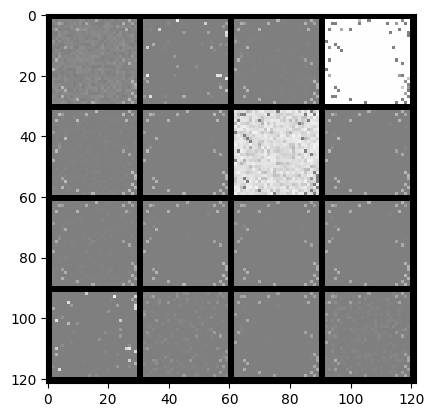

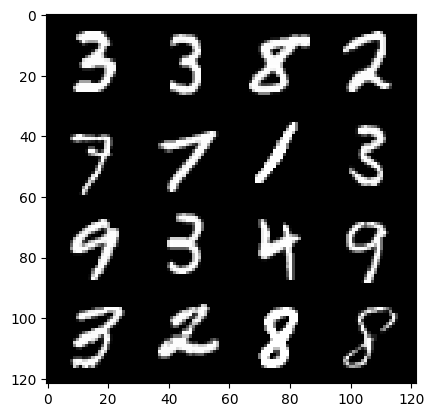

6: step 3000 / Gen loss: 27.66268078486126 / disc_loss:7.871993107983146e-05


  0%|          | 0/469 [00:00<?, ?it/s]

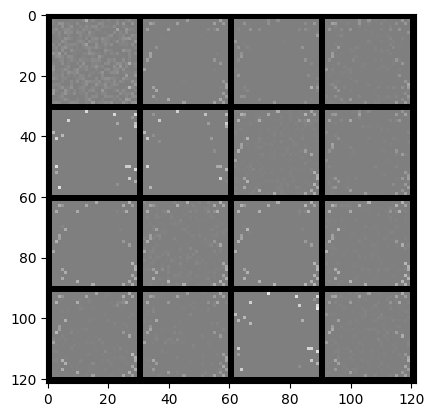

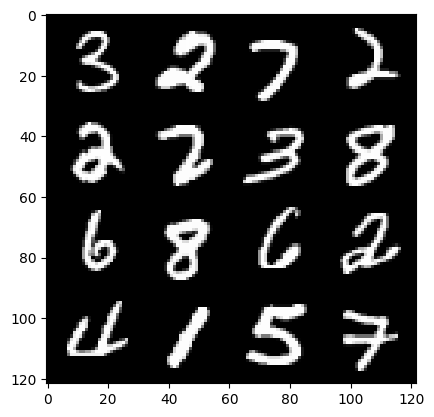

7: step 3300 / Gen loss: 28.665737578074147 / disc_loss:6.017409856819238e-05


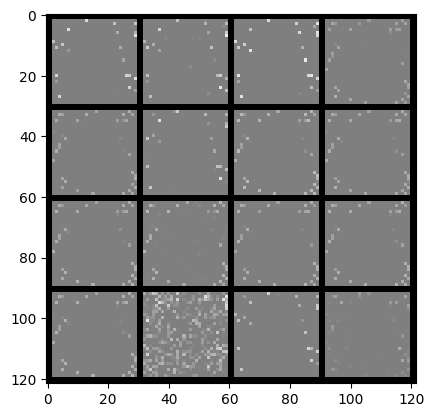

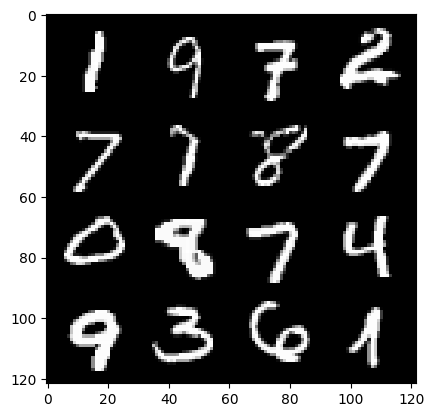

7: step 3600 / Gen loss: 29.537003669738787 / disc_loss:4.44475812582823e-05


  0%|          | 0/469 [00:00<?, ?it/s]

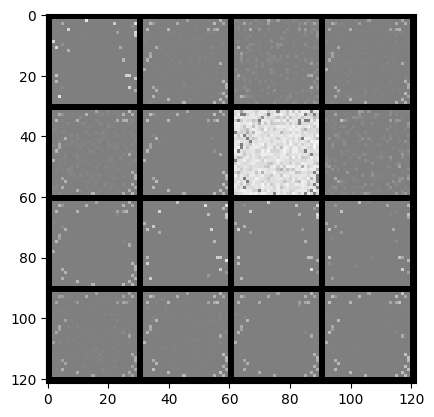

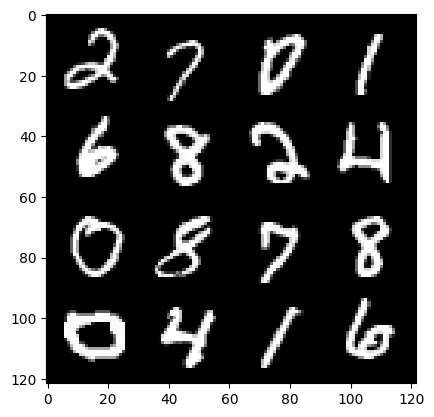

8: step 3900 / Gen loss: 30.397218990325932 / disc_loss:3.594621576667126e-05


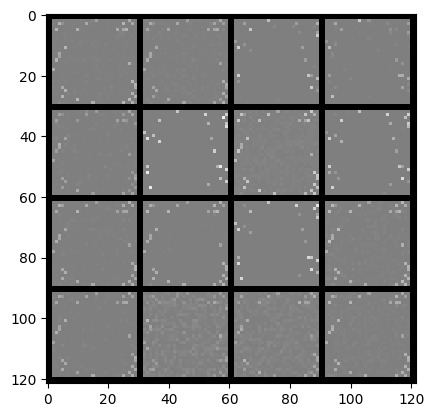

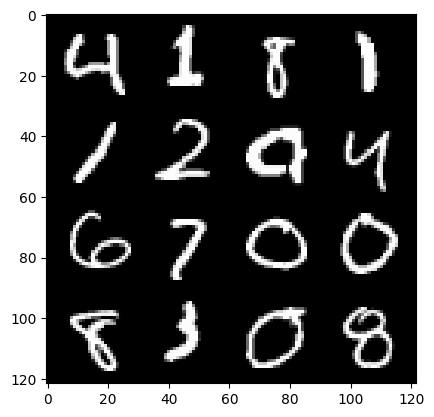

8: step 4200 / Gen loss: 31.28208435058595 / disc_loss:2.8814048776742613e-05


  0%|          | 0/469 [00:00<?, ?it/s]

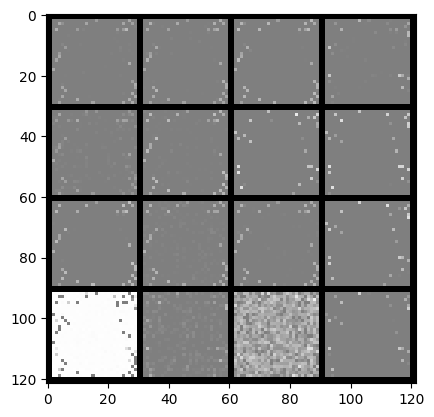

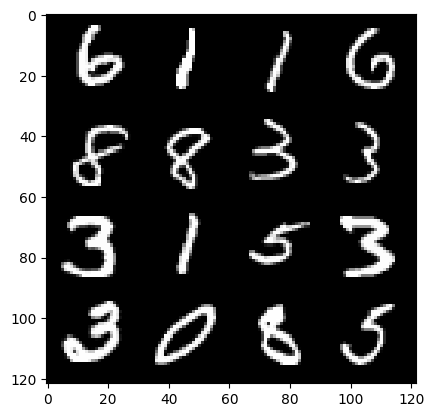

9: step 4500 / Gen loss: 32.08905740737915 / disc_loss:2.2362422973856153e-05


  0%|          | 0/469 [00:00<?, ?it/s]

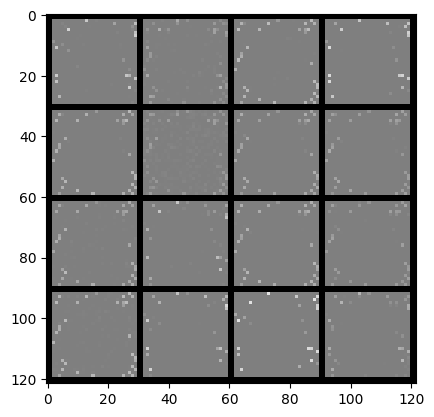

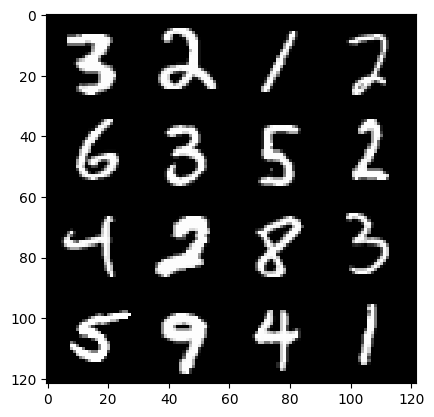

10: step 4800 / Gen loss: 32.86080596923829 / disc_loss:1.7528069415675423e-05


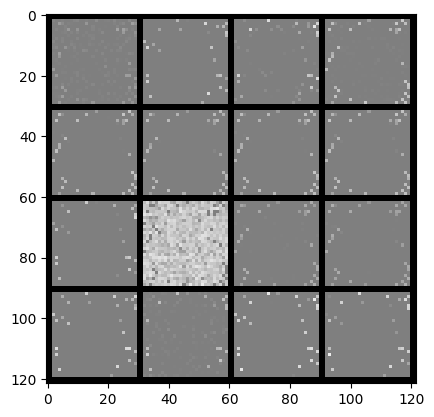

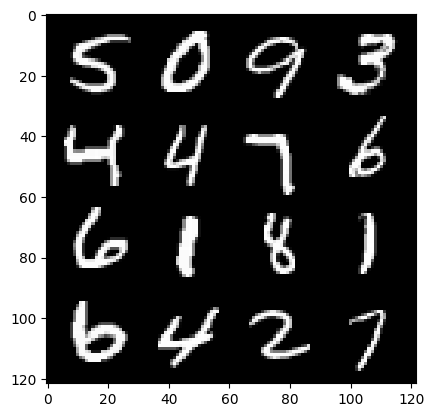

10: step 5100 / Gen loss: 33.65490685780843 / disc_loss:1.4887762654325345e-05


  0%|          | 0/469 [00:00<?, ?it/s]

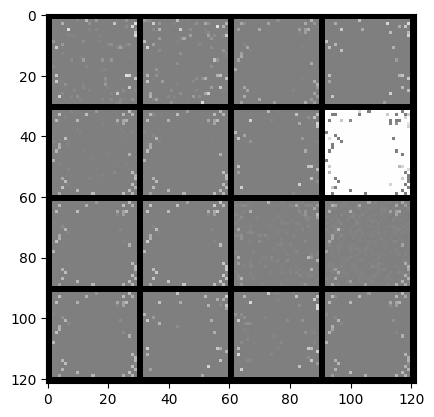

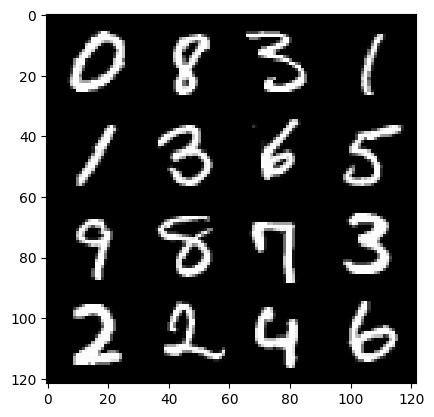

11: step 5400 / Gen loss: 34.4476313273112 / disc_loss:1.1292515009699852e-05


  0%|          | 0/469 [00:00<?, ?it/s]

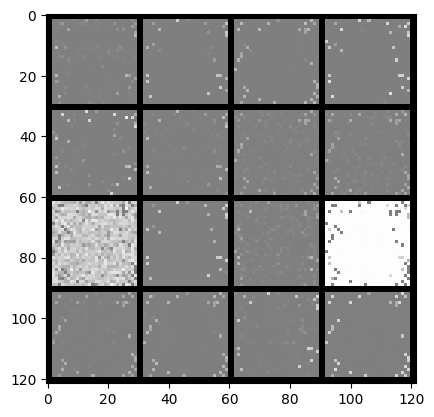

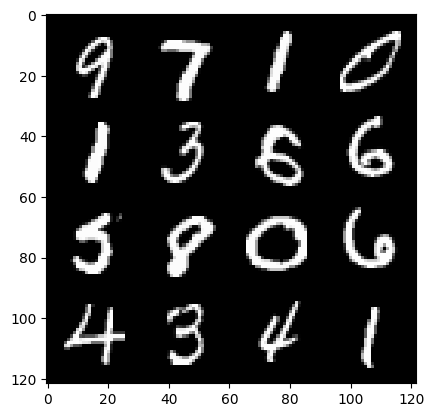

12: step 5700 / Gen loss: 35.1749132792155 / disc_loss:9.619758266884068e-06


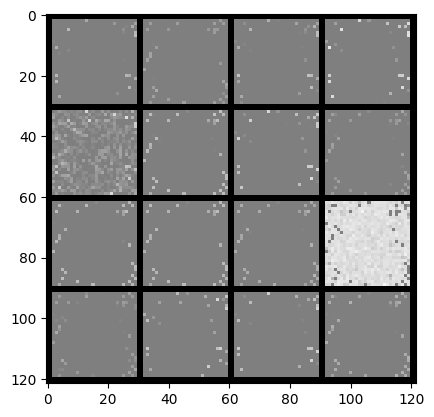

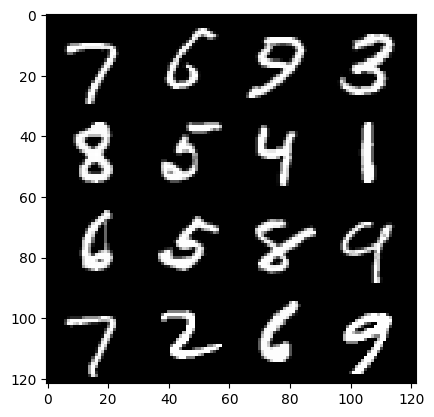

12: step 6000 / Gen loss: 35.96548575083415 / disc_loss:8.10146973321934e-06


  0%|          | 0/469 [00:00<?, ?it/s]

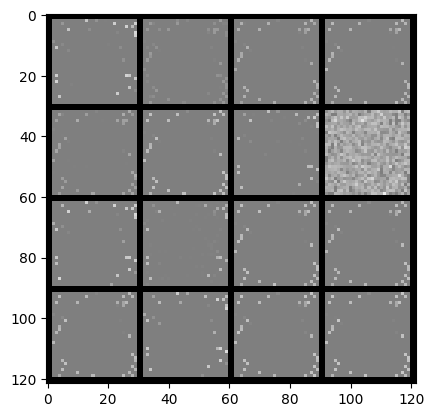

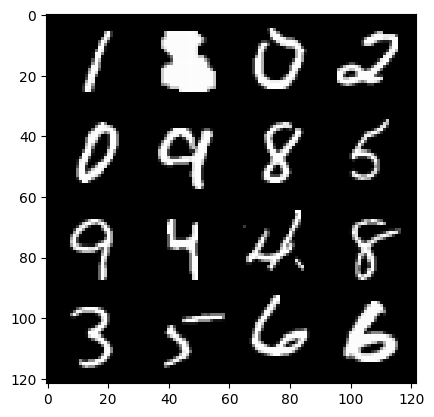

13: step 6300 / Gen loss: 36.64436121622721 / disc_loss:6.186399047010129e-06


  0%|          | 0/469 [00:00<?, ?it/s]

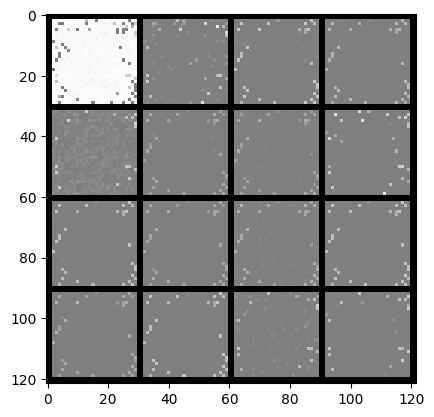

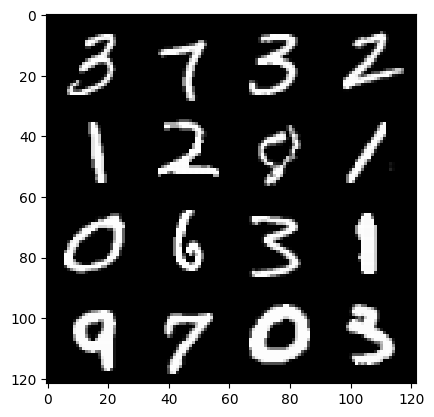

14: step 6600 / Gen loss: 37.40695851643882 / disc_loss:5.366741303684341e-06


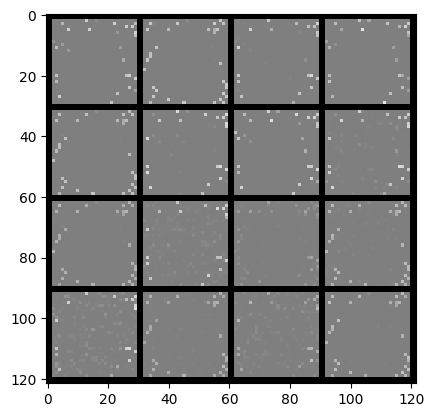

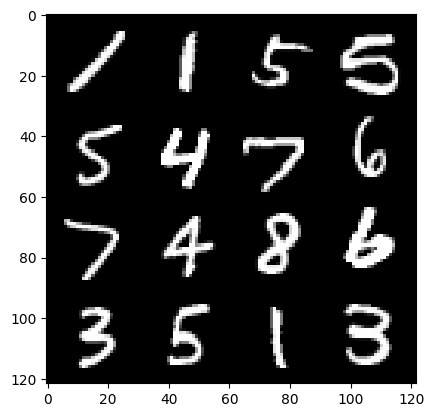

14: step 6900 / Gen loss: 38.117434387207034 / disc_loss:4.11415384310961e-06


  0%|          | 0/469 [00:00<?, ?it/s]

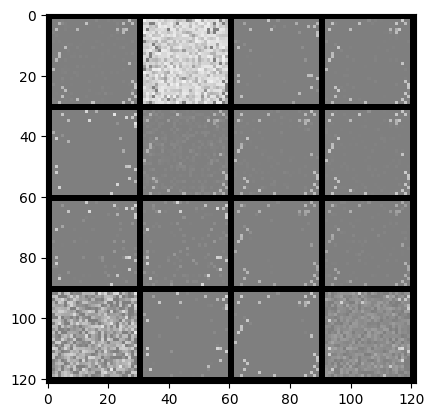

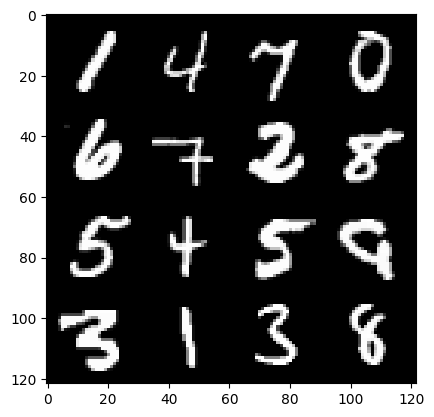

15: step 7200 / Gen loss: 38.880032297770164 / disc_loss:3.8687560307456195e-06


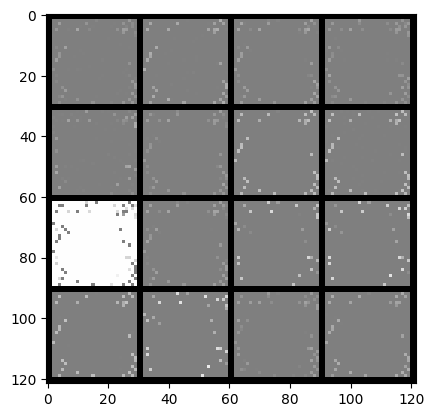

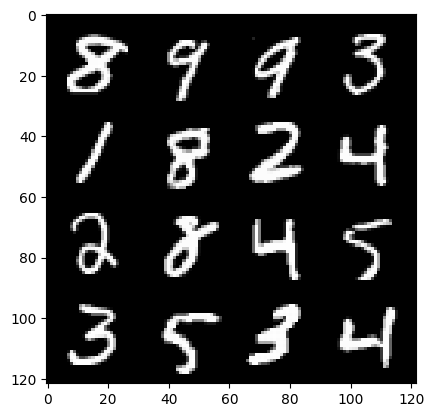

15: step 7500 / Gen loss: 39.60887494405115 / disc_loss:3.0008107575933234e-06


  0%|          | 0/469 [00:00<?, ?it/s]

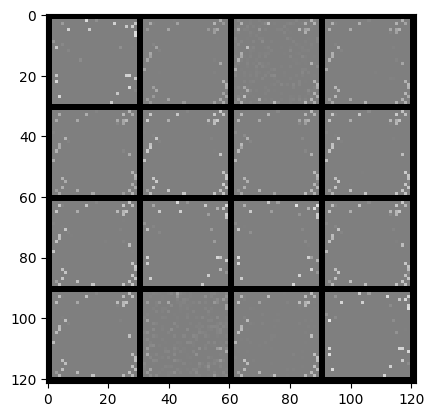

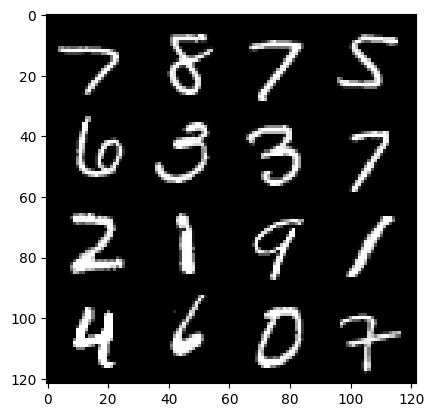

16: step 7800 / Gen loss: 40.31449914296469 / disc_loss:2.386839483676794e-06


  0%|          | 0/469 [00:00<?, ?it/s]

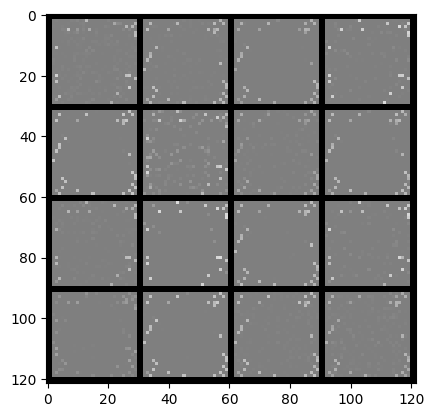

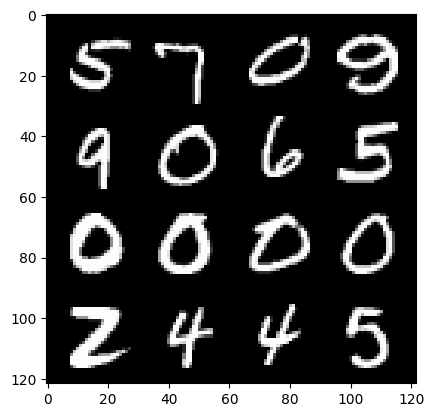

17: step 8100 / Gen loss: 41.03366536458335 / disc_loss:2.196183234559613e-06


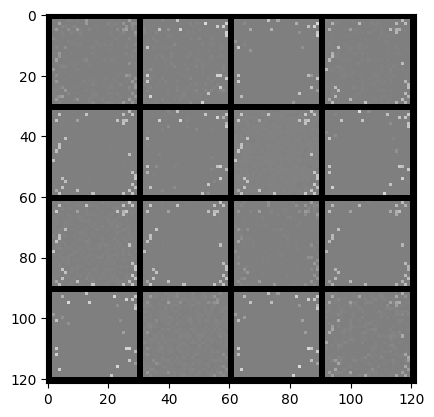

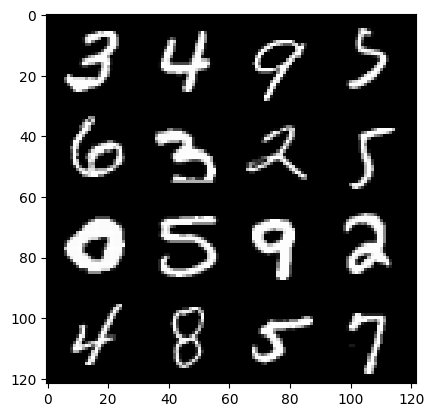

17: step 8400 / Gen loss: 41.741681925455765 / disc_loss:1.723966872001863e-06


  0%|          | 0/469 [00:00<?, ?it/s]

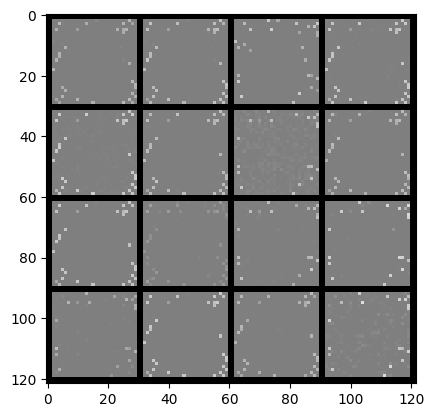

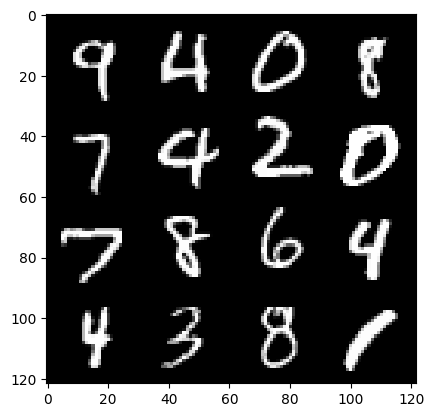

18: step 8700 / Gen loss: 42.46234191894535 / disc_loss:1.3870470091366848e-06


  0%|          | 0/469 [00:00<?, ?it/s]

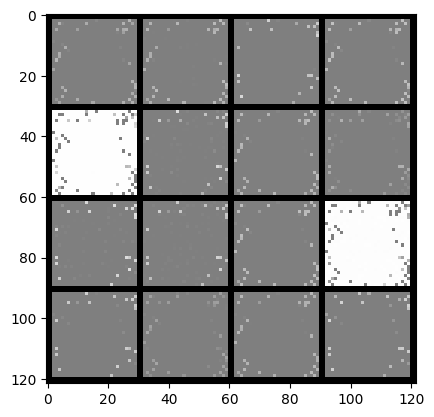

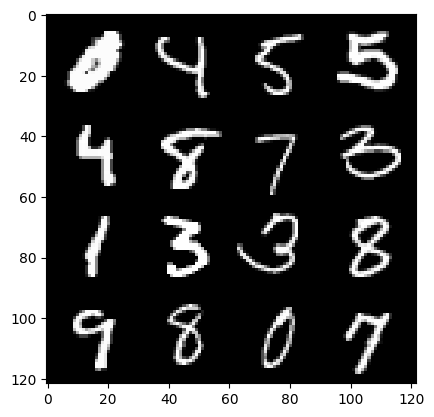

19: step 9000 / Gen loss: 43.185216293334996 / disc_loss:1.2048359802226595e-06


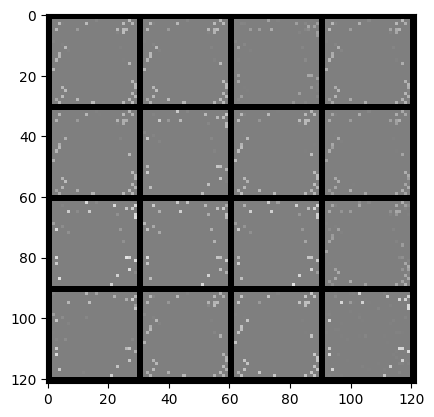

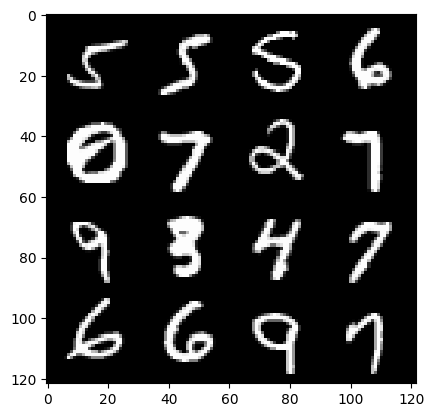

19: step 9300 / Gen loss: 43.885290705362934 / disc_loss:1.0539725255872172e-06


  0%|          | 0/469 [00:00<?, ?it/s]

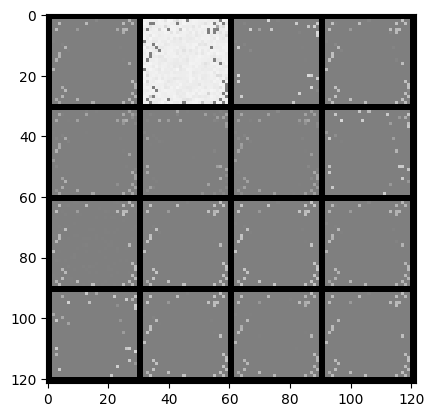

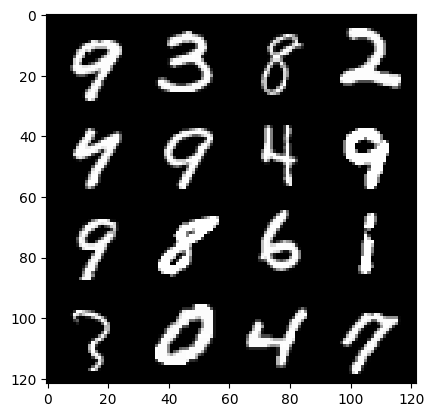

20: step 9600 / Gen loss: 44.567365163167345 / disc_loss:8.374430999443423e-07


  0%|          | 0/469 [00:00<?, ?it/s]

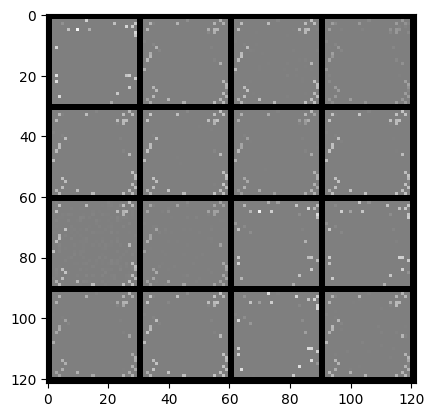

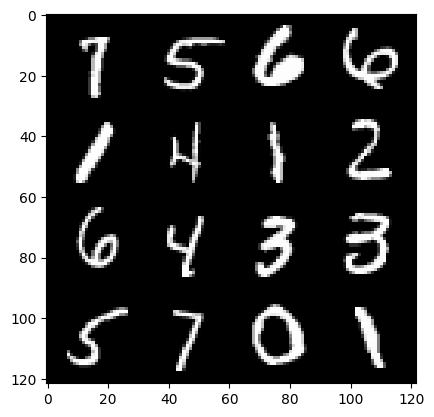

21: step 9900 / Gen loss: 45.29404003143308 / disc_loss:7.082971835833029e-07


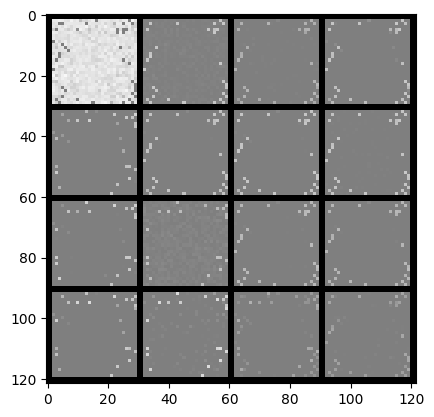

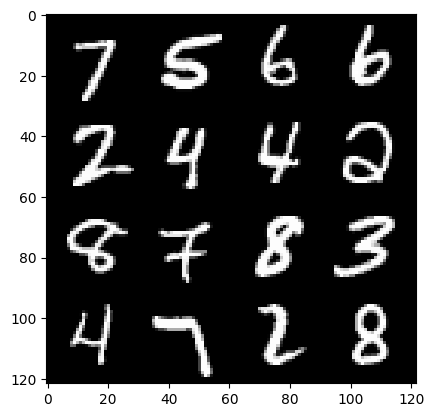

21: step 10200 / Gen loss: 46.03101608276373 / disc_loss:5.711304550833539e-07


  0%|          | 0/469 [00:00<?, ?it/s]

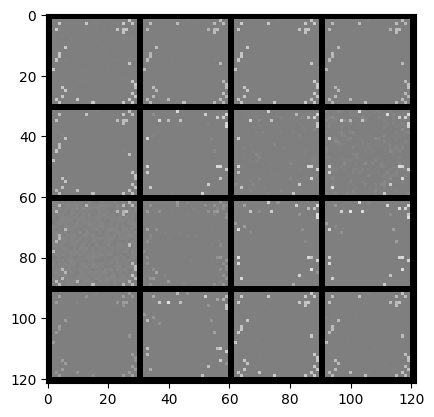

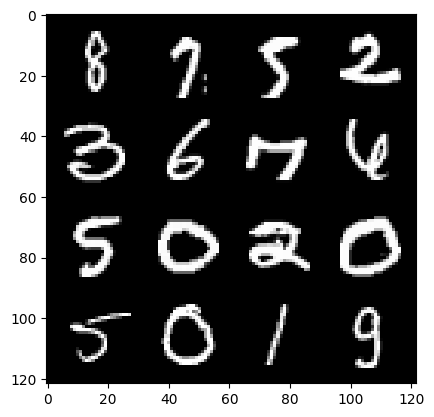

22: step 10500 / Gen loss: 46.73564634958903 / disc_loss:5.443800499686325e-07


  0%|          | 0/469 [00:00<?, ?it/s]

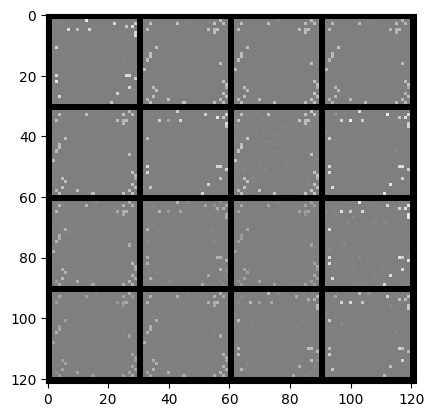

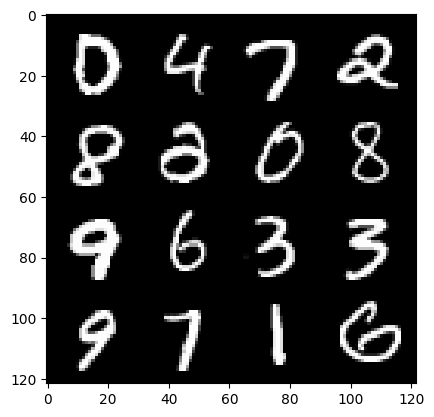

23: step 10800 / Gen loss: 47.443782501220674 / disc_loss:4.205676342176426e-07


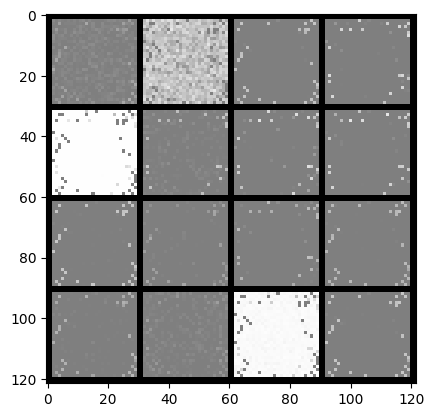

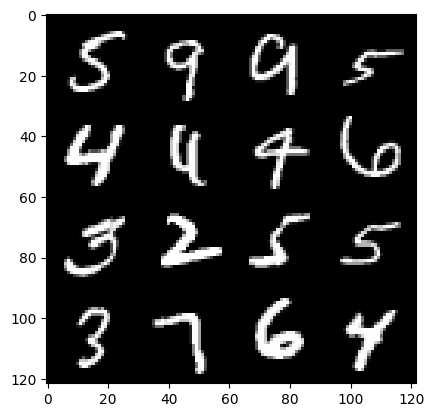

23: step 11100 / Gen loss: 48.16857988993325 / disc_loss:3.6039351684872644e-07


  0%|          | 0/469 [00:00<?, ?it/s]

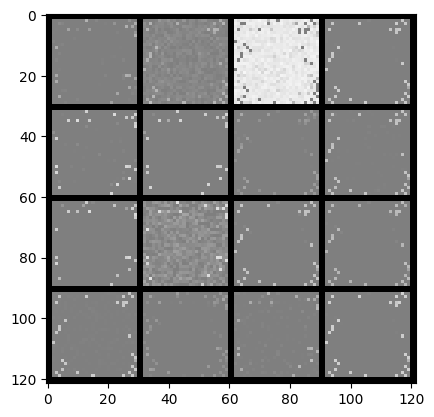

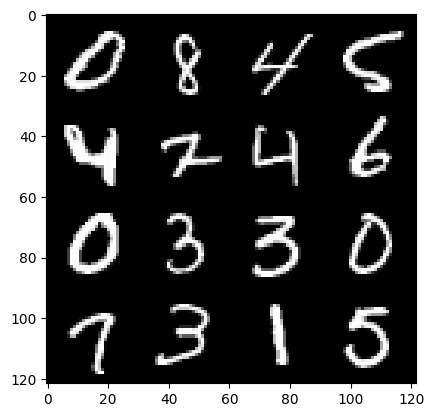

24: step 11400 / Gen loss: 48.874969736735025 / disc_loss:3.1441176206570266e-07


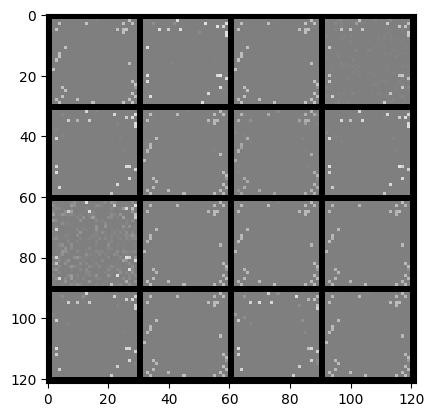

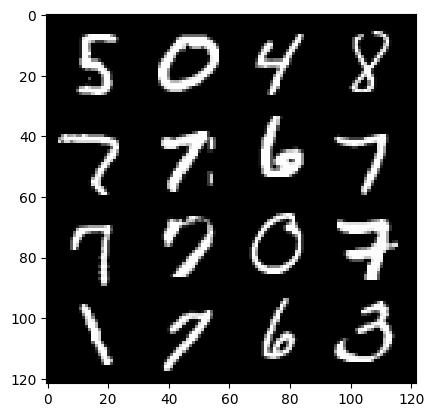

24: step 11700 / Gen loss: 49.52172963460288 / disc_loss:2.3655550399552067e-07


  0%|          | 0/469 [00:00<?, ?it/s]

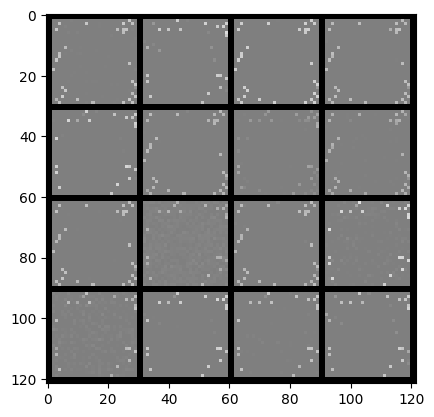

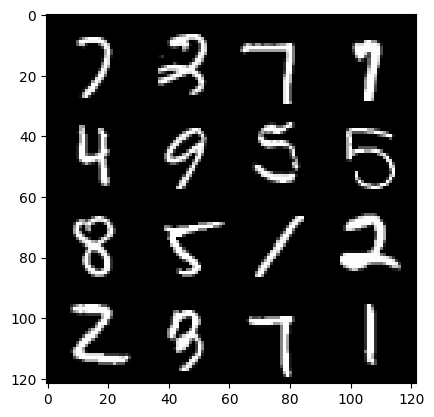

25: step 12000 / Gen loss: 50.24913269042967 / disc_loss:2.282742185884719e-07


  0%|          | 0/469 [00:00<?, ?it/s]

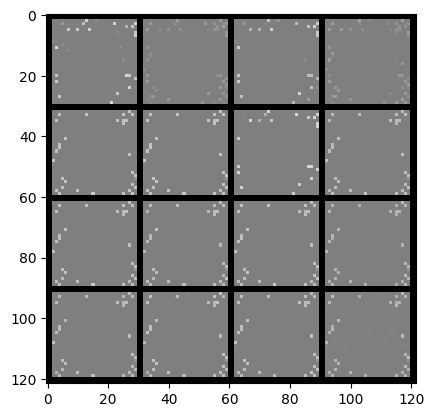

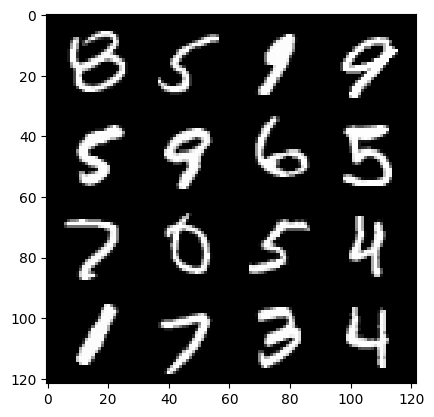

26: step 12300 / Gen loss: 50.945477650960264 / disc_loss:2.0132117440452287e-07


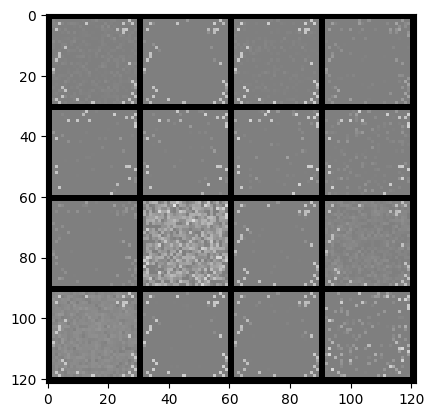

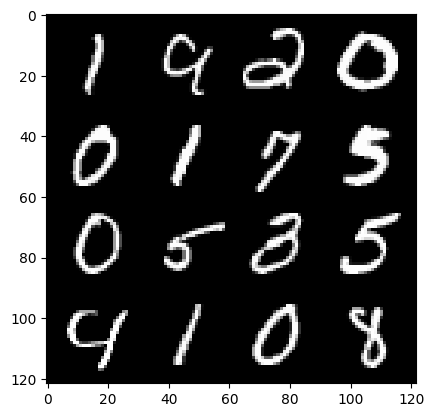

26: step 12600 / Gen loss: 51.64906584421791 / disc_loss:1.500843125823437e-07


  0%|          | 0/469 [00:00<?, ?it/s]

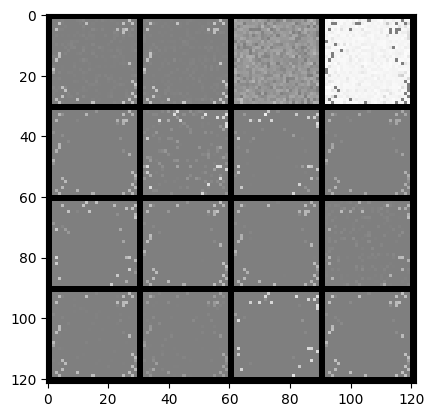

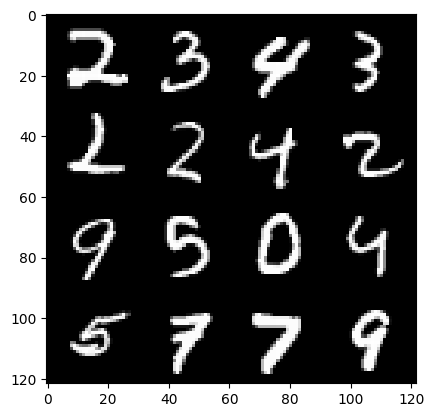

27: step 12900 / Gen loss: 52.25130950927731 / disc_loss:1.263807980119344e-07


  0%|          | 0/469 [00:00<?, ?it/s]

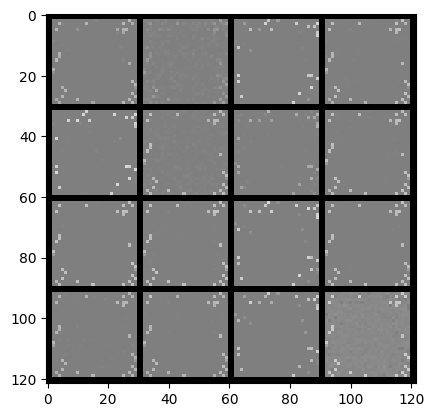

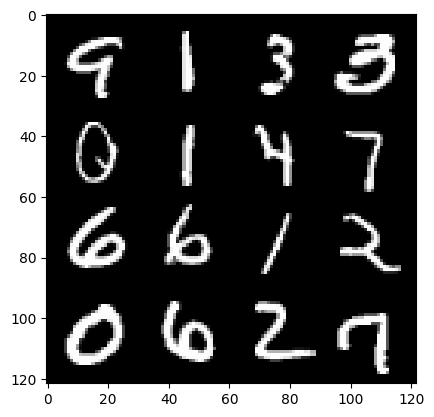

28: step 13200 / Gen loss: 52.93520379384357 / disc_loss:1.0986492340436797e-07


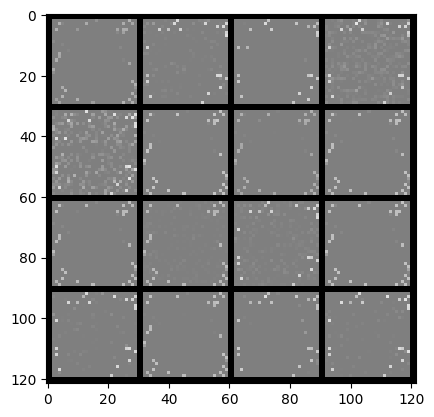

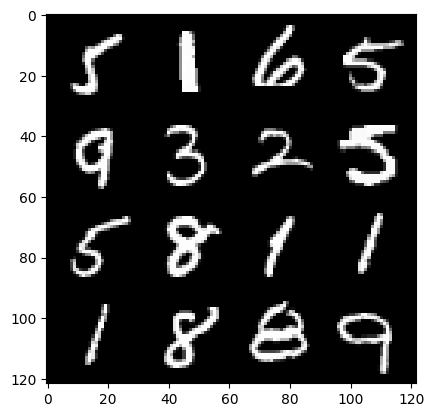

28: step 13500 / Gen loss: 53.59686018625892 / disc_loss:1.0143015412541115e-07


  0%|          | 0/469 [00:00<?, ?it/s]

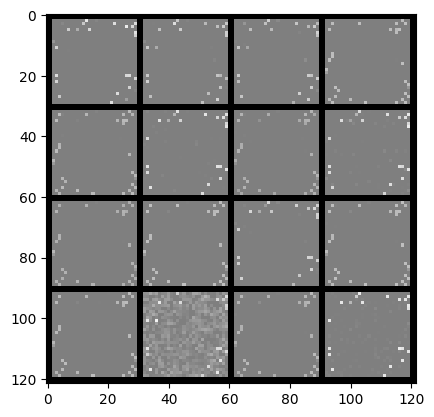

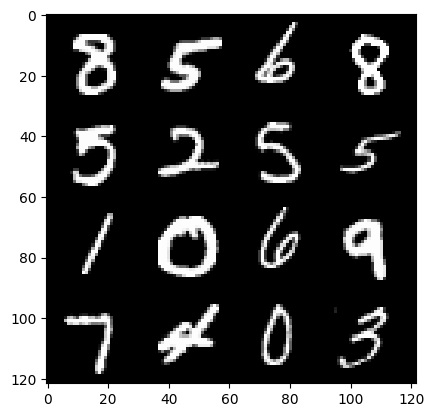

29: step 13800 / Gen loss: 54.28906974792478 / disc_loss:8.014447430001087e-08


  0%|          | 0/469 [00:00<?, ?it/s]

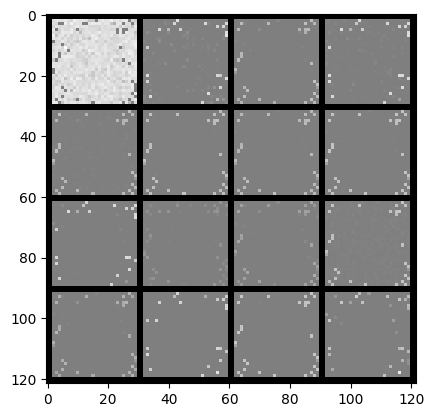

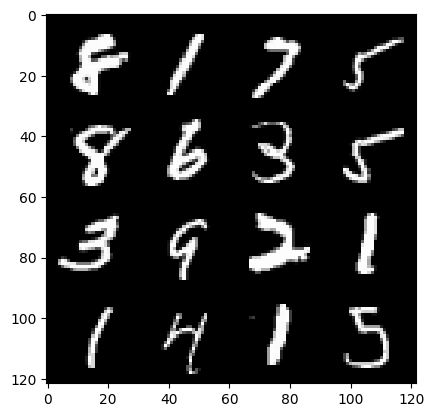

30: step 14100 / Gen loss: 54.9336853281657 / disc_loss:7.883168997561514e-08


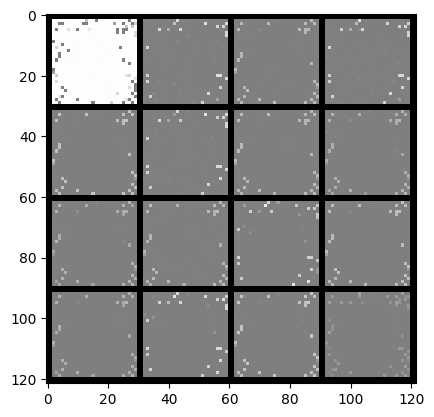

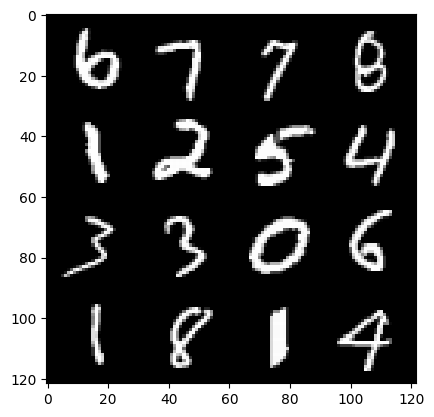

30: step 14400 / Gen loss: 55.585804163614895 / disc_loss:6.418928259292277e-08


  0%|          | 0/469 [00:00<?, ?it/s]

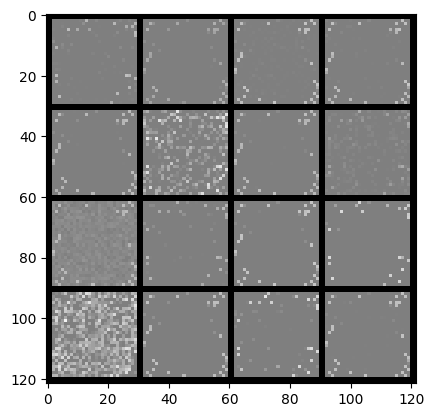

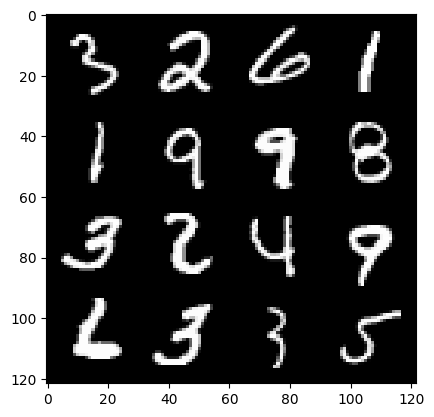

31: step 14700 / Gen loss: 56.277326278686544 / disc_loss:5.505000768096789e-08


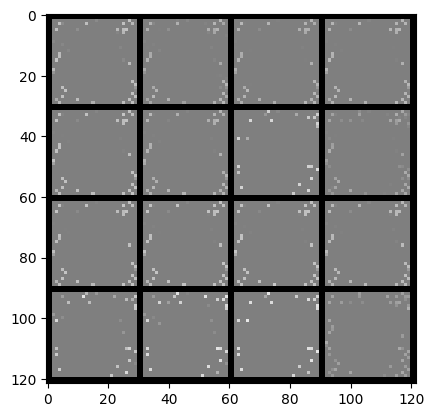

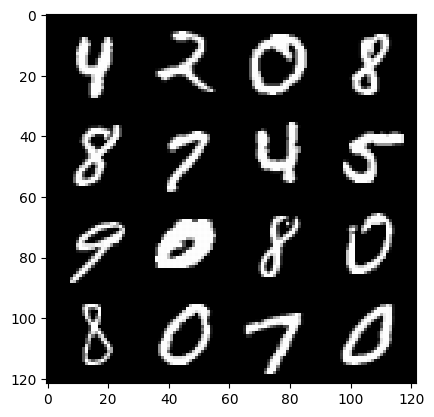

31: step 15000 / Gen loss: 56.94144945780436 / disc_loss:4.111231513670431e-08


  0%|          | 0/469 [00:00<?, ?it/s]

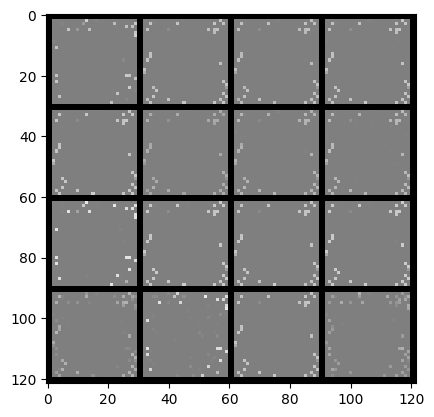

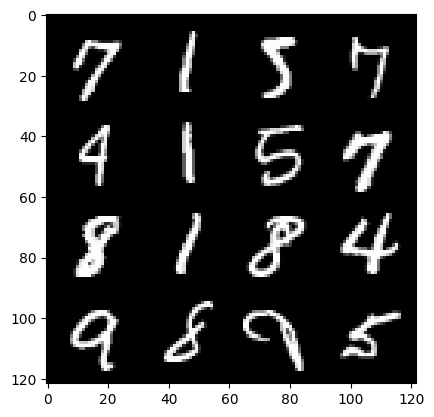

32: step 15300 / Gen loss: 57.54146994272869 / disc_loss:3.785895527972743e-08


  0%|          | 0/469 [00:00<?, ?it/s]

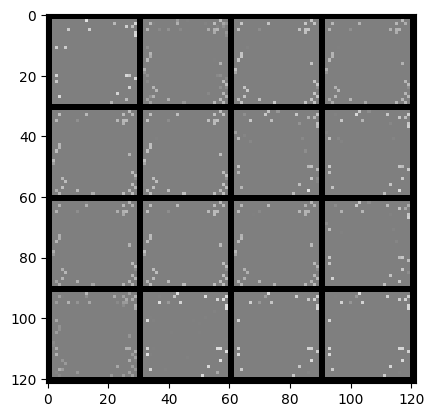

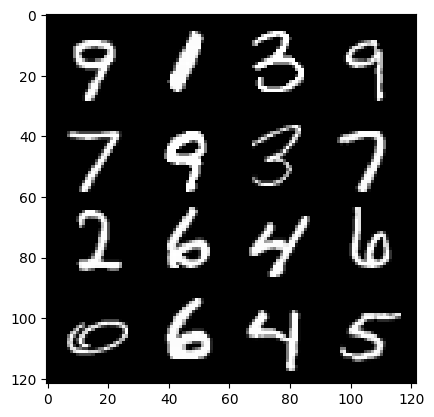

33: step 15600 / Gen loss: 58.06079039255772 / disc_loss:3.5516937877215e-08


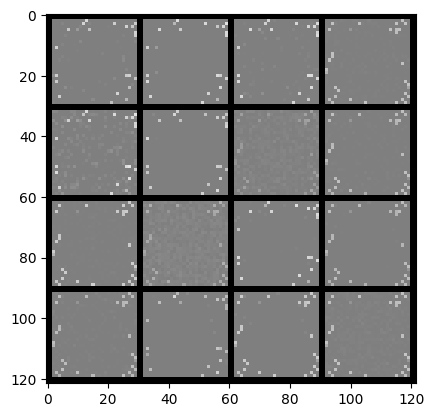

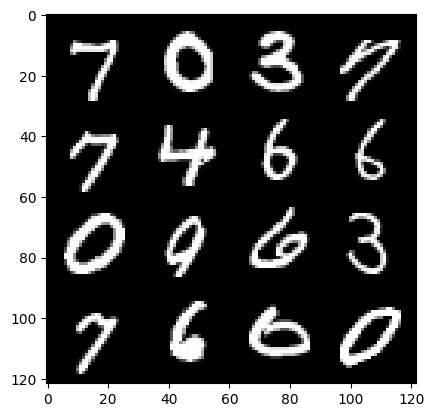

33: step 15900 / Gen loss: 58.771165008544955 / disc_loss:2.9986380451022906e-08


  0%|          | 0/469 [00:00<?, ?it/s]

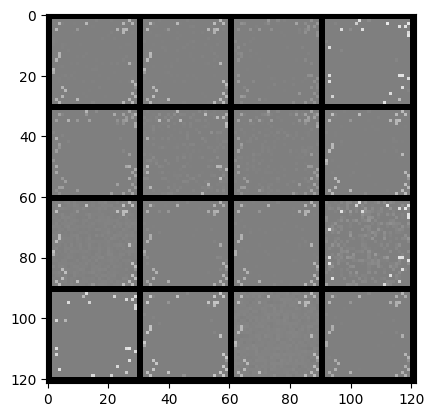

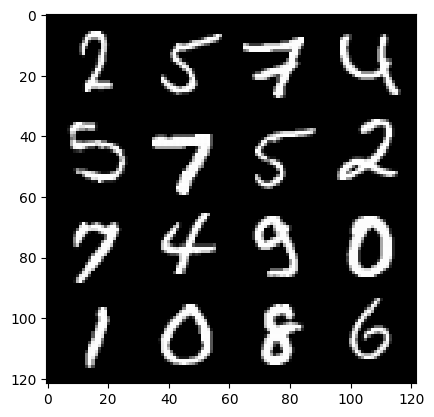

34: step 16200 / Gen loss: 59.3319647979736 / disc_loss:2.566326662308455e-08


  0%|          | 0/469 [00:00<?, ?it/s]

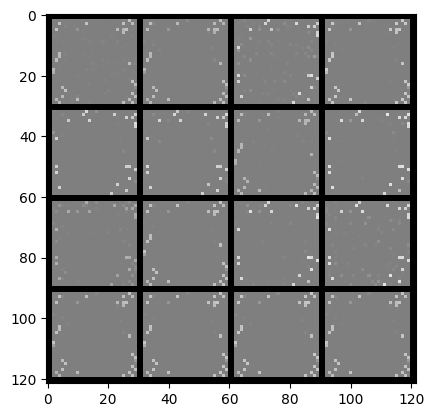

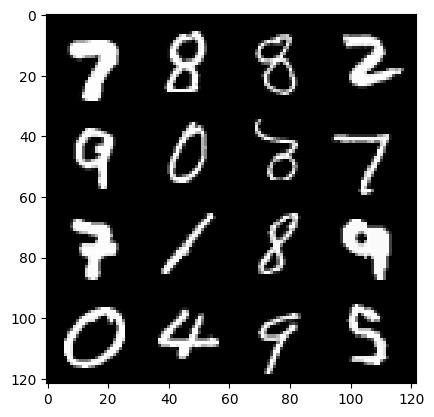

35: step 16500 / Gen loss: 59.88488321940103 / disc_loss:2.136162806060104e-08


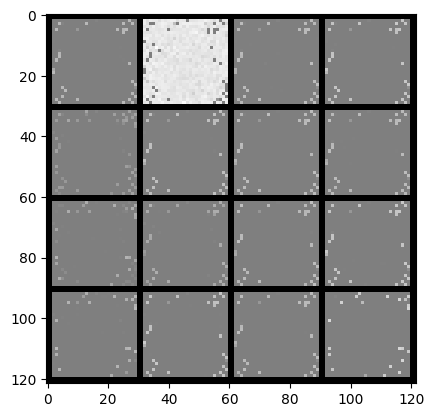

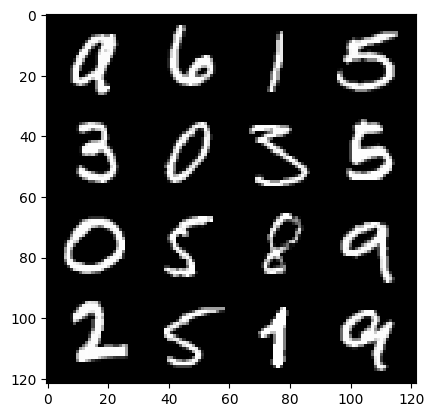

35: step 16800 / Gen loss: 60.5316402308146 / disc_loss:2.096684323651029e-08


  0%|          | 0/469 [00:00<?, ?it/s]

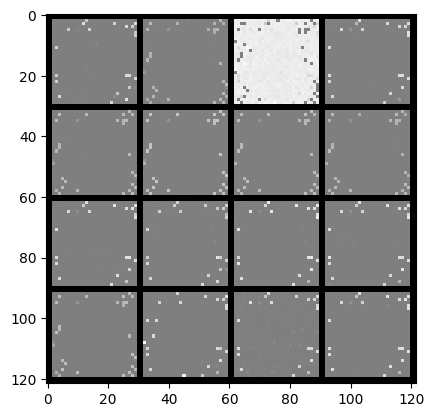

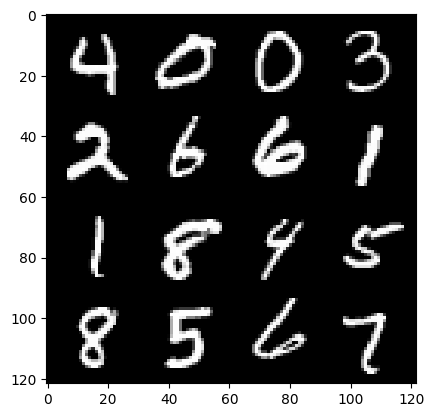

36: step 17100 / Gen loss: 61.06288881937671 / disc_loss:1.6812293523645518e-08


  0%|          | 0/469 [00:00<?, ?it/s]

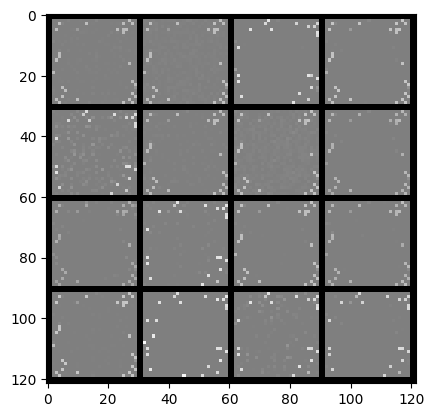

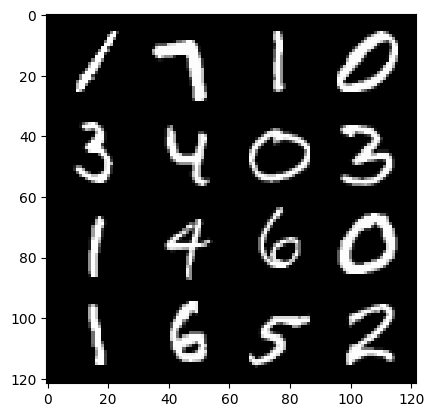

37: step 17400 / Gen loss: 61.622311185201006 / disc_loss:1.5331959792771108e-08


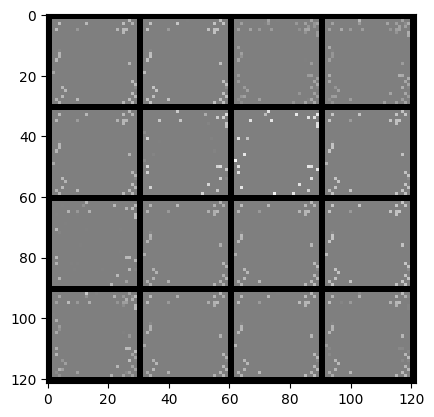

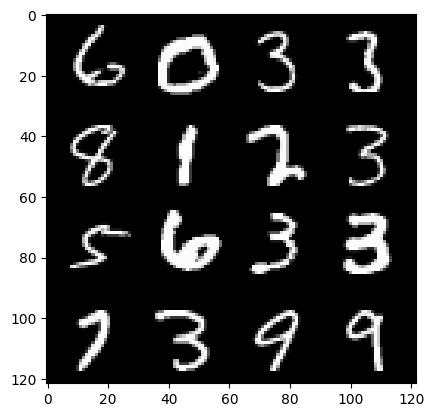

37: step 17700 / Gen loss: 62.255078163147 / disc_loss:1.3359660169520736e-08


  0%|          | 0/469 [00:00<?, ?it/s]

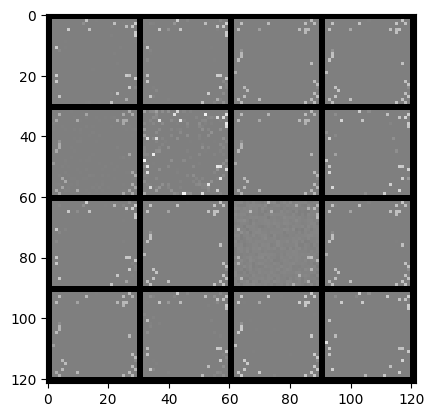

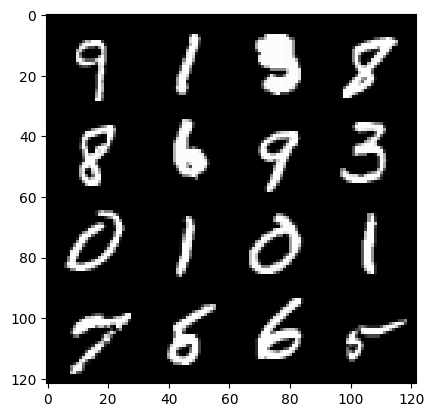

38: step 18000 / Gen loss: 62.73622959136965 / disc_loss:1.1018494420108235e-08


  0%|          | 0/469 [00:00<?, ?it/s]

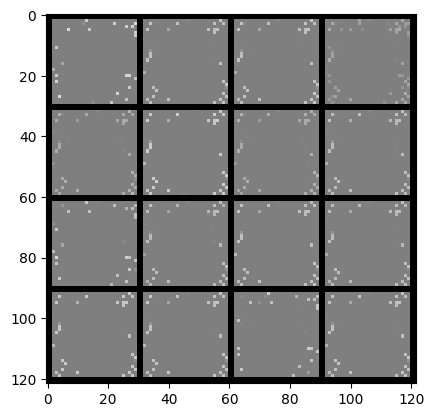

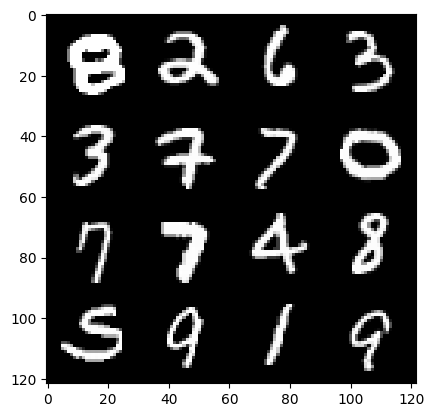

39: step 18300 / Gen loss: 63.27958683013914 / disc_loss:1.0826010966302759e-08


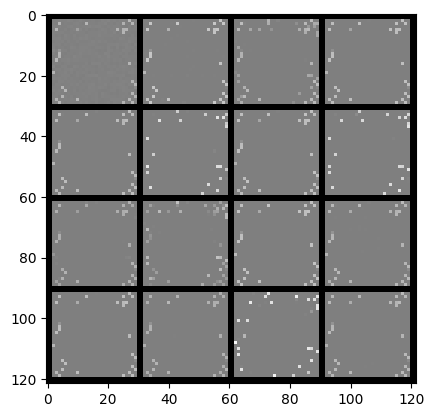

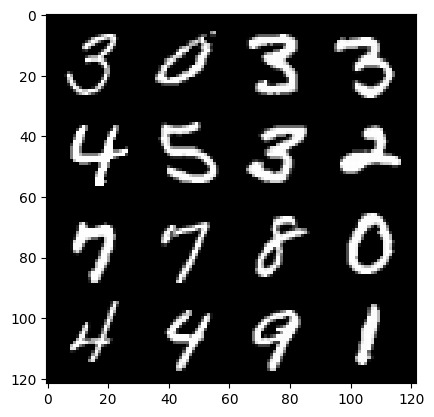

39: step 18600 / Gen loss: 63.78576713562013 / disc_loss:8.724893423202791e-09


  0%|          | 0/469 [00:00<?, ?it/s]

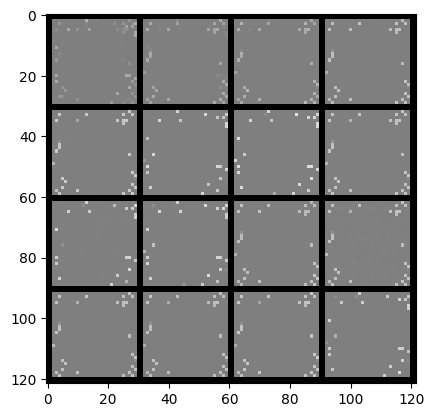

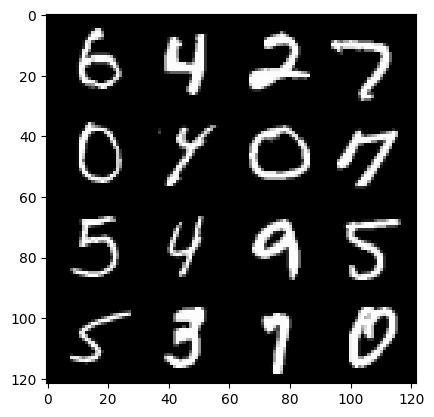

40: step 18900 / Gen loss: 64.32504069010416 / disc_loss:8.063117880504263e-09


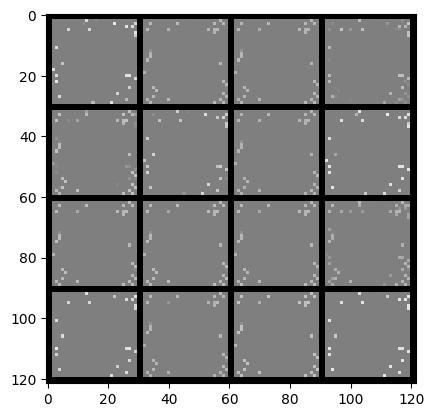

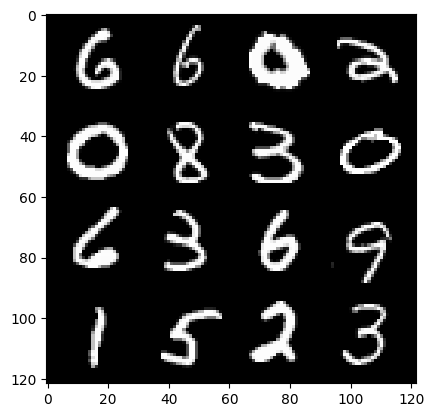

40: step 19200 / Gen loss: 64.80976203918459 / disc_loss:7.514169009884929e-09


  0%|          | 0/469 [00:00<?, ?it/s]

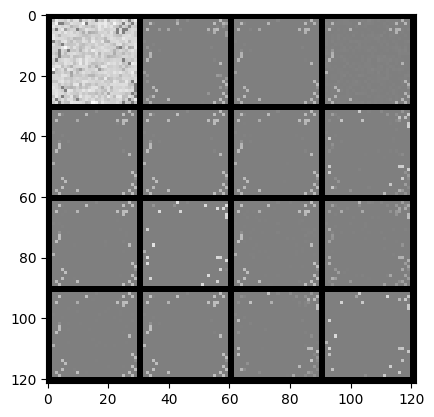

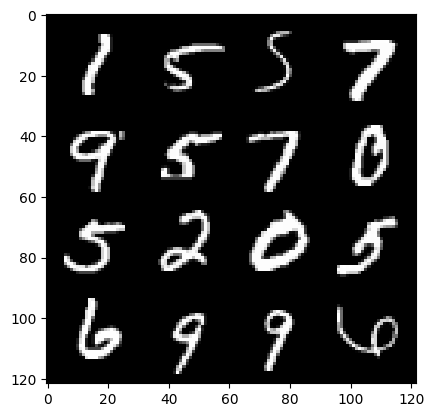

41: step 19500 / Gen loss: 65.33263954162595 / disc_loss:6.489731673349953e-09


  0%|          | 0/469 [00:00<?, ?it/s]

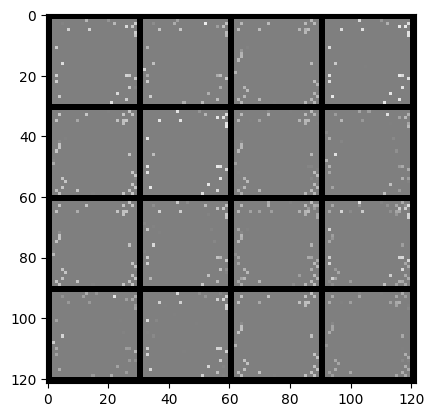

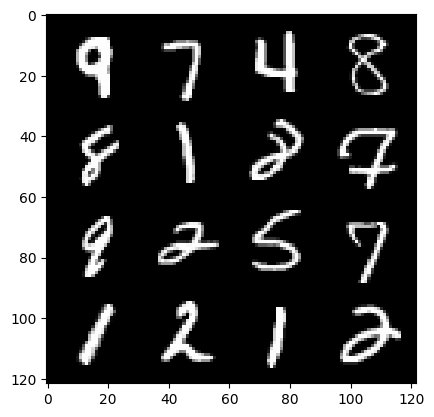

42: step 19800 / Gen loss: 65.83806322733562 / disc_loss:4.99496377879642e-09


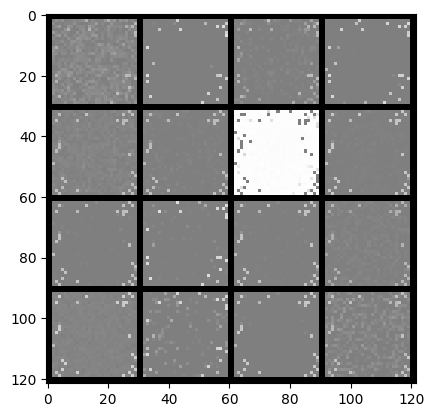

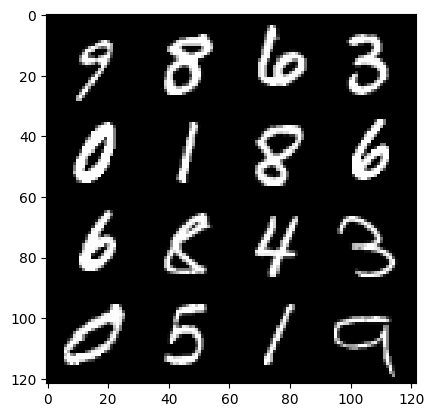

42: step 20100 / Gen loss: 66.28137646993002 / disc_loss:5.881269344680074e-09


  0%|          | 0/469 [00:00<?, ?it/s]

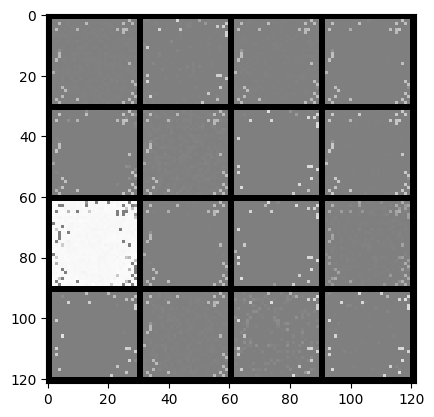

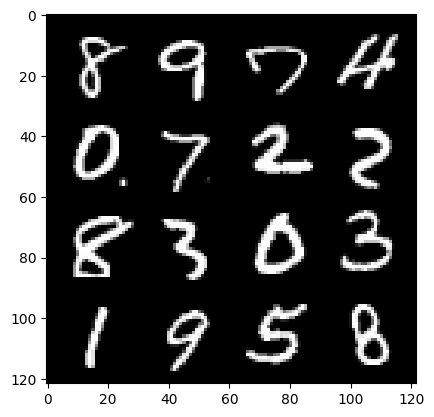

43: step 20400 / Gen loss: 66.74239537556961 / disc_loss:3.720622475019322e-09


  0%|          | 0/469 [00:00<?, ?it/s]

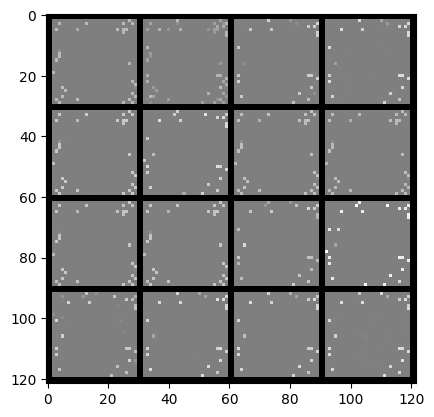

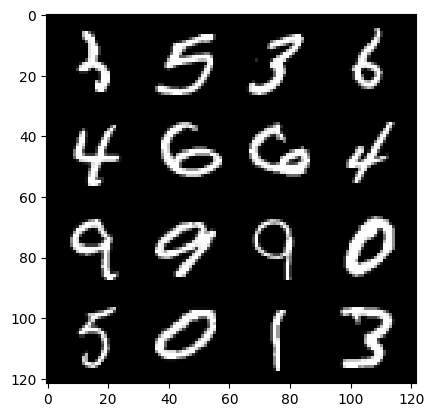

44: step 20700 / Gen loss: 67.25624921162927 / disc_loss:4.9152857046578645e-09


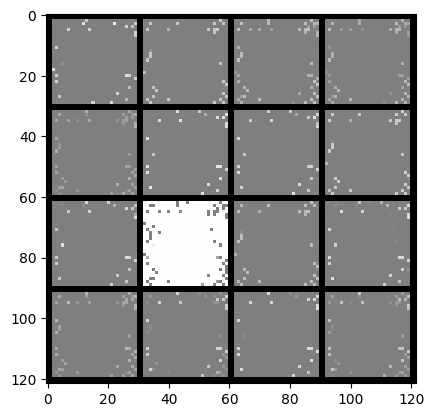

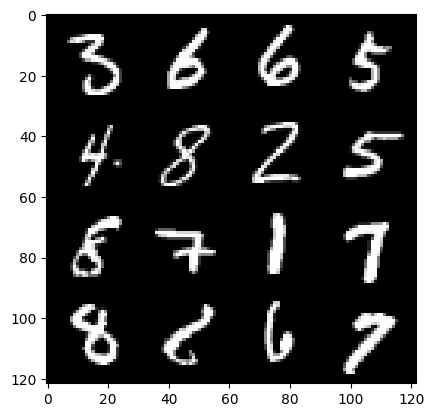

44: step 21000 / Gen loss: 67.73245262145998 / disc_loss:3.1649335283101514e-09


  0%|          | 0/469 [00:00<?, ?it/s]

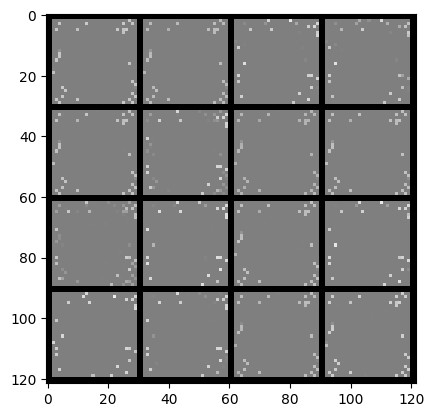

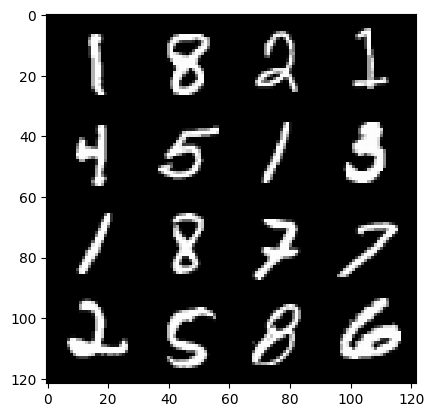

45: step 21300 / Gen loss: 68.09700665791829 / disc_loss:3.79201863418924e-09


  0%|          | 0/469 [00:00<?, ?it/s]

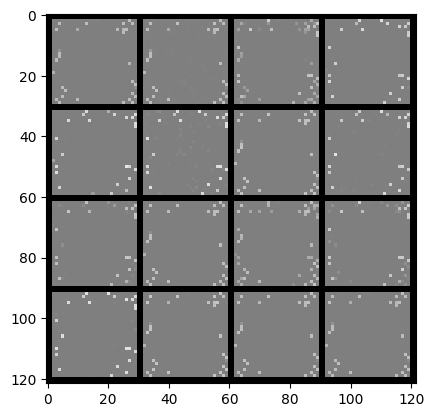

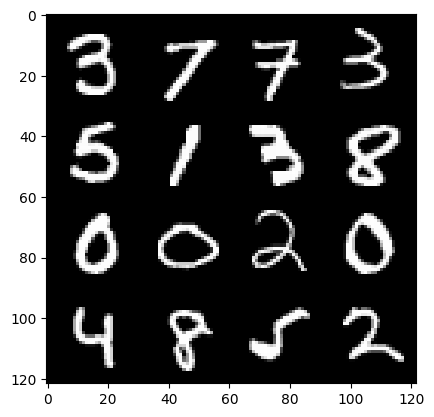

46: step 21600 / Gen loss: 68.55058621724443 / disc_loss:2.876227810459187e-09


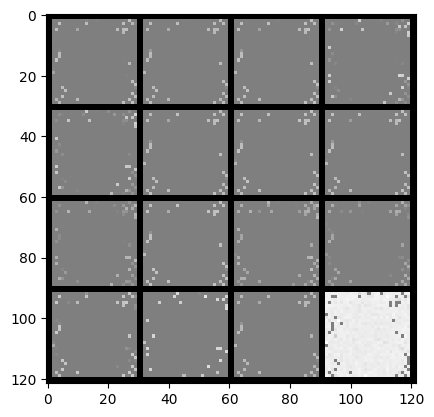

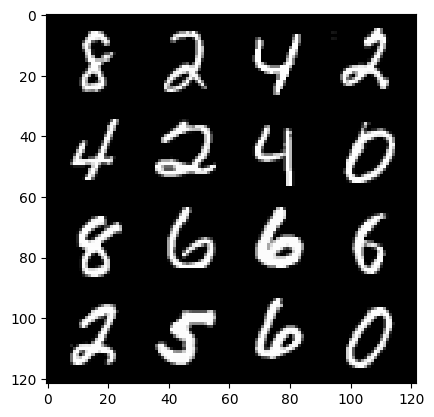

46: step 21900 / Gen loss: 69.07107330322265 / disc_loss:3.0562786221266476e-09


  0%|          | 0/469 [00:00<?, ?it/s]

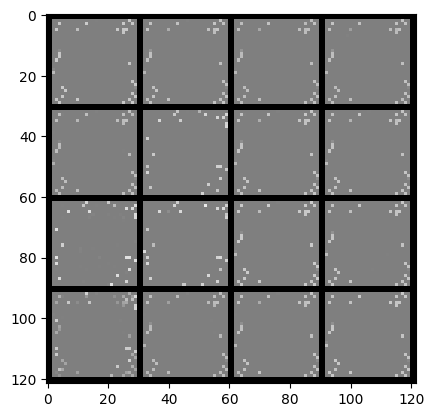

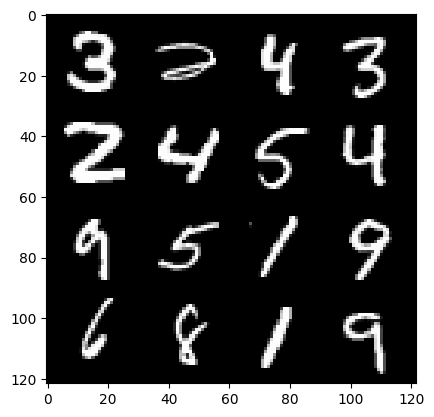

47: step 22200 / Gen loss: 69.47396024068199 / disc_loss:2.513529403687837e-09


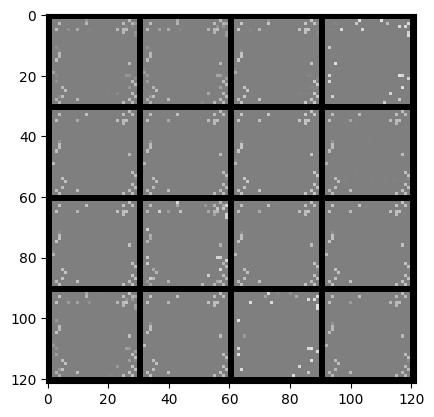

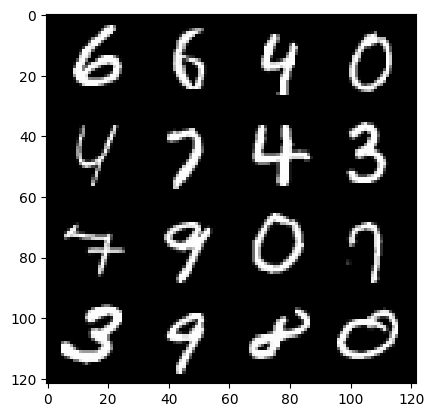

47: step 22500 / Gen loss: 69.88797729492184 / disc_loss:2.0101002516185534e-09


  0%|          | 0/469 [00:00<?, ?it/s]

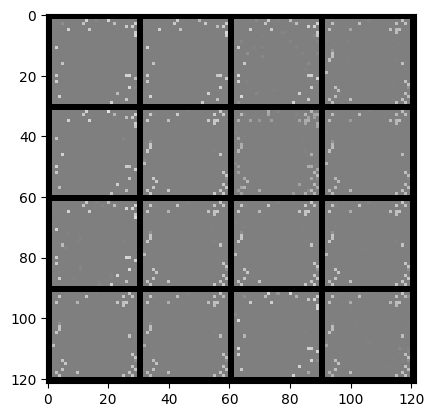

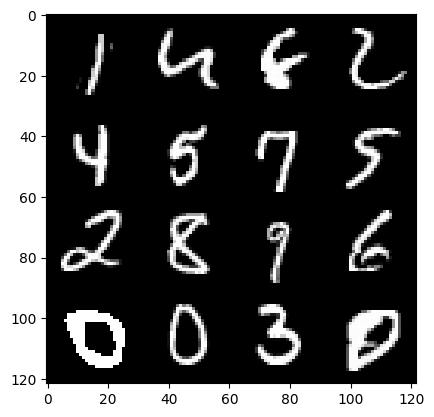

48: step 22800 / Gen loss: 70.29823463439938 / disc_loss:2.1109919438414904e-09


  0%|          | 0/469 [00:00<?, ?it/s]

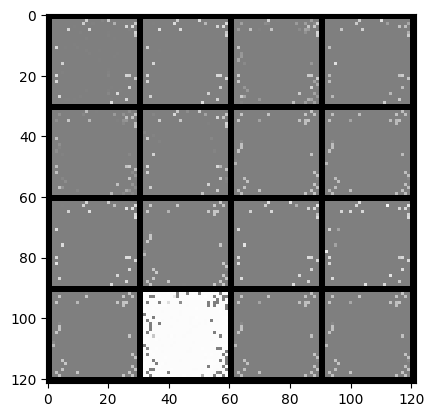

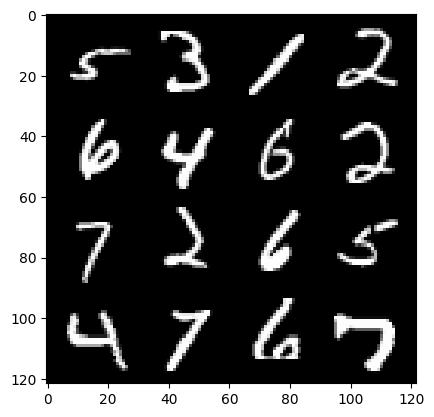

49: step 23100 / Gen loss: 70.70348498026533 / disc_loss:1.6096334159998436e-09


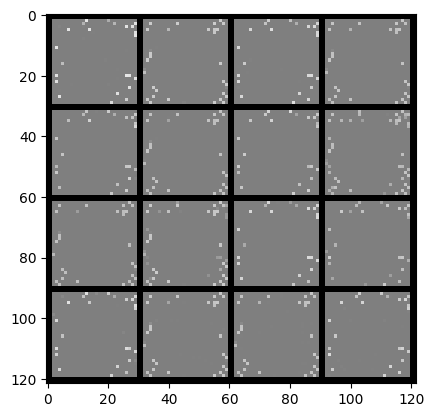

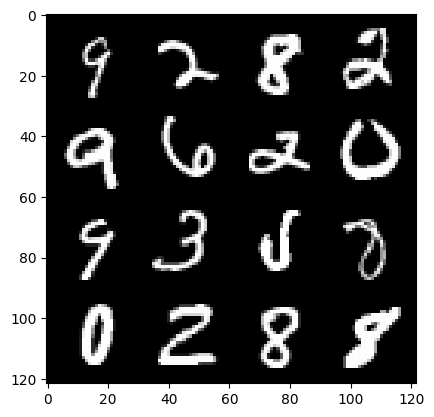

49: step 23400 / Gen loss: 71.05027193705236 / disc_loss:1.965085603590949e-09


  0%|          | 0/469 [00:00<?, ?it/s]

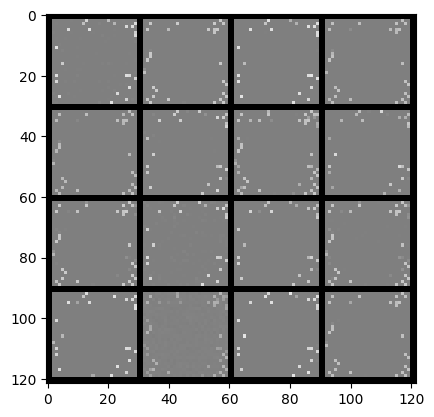

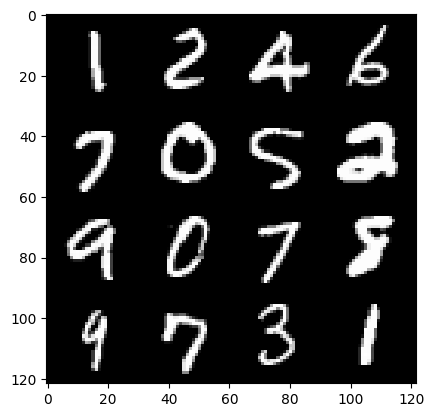

50: step 23700 / Gen loss: 71.53275004069008 / disc_loss:1.1600125856177824e-09


  0%|          | 0/469 [00:00<?, ?it/s]

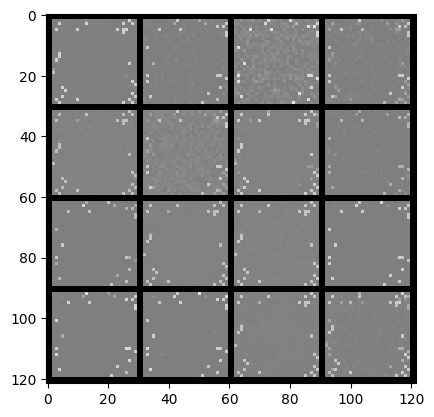

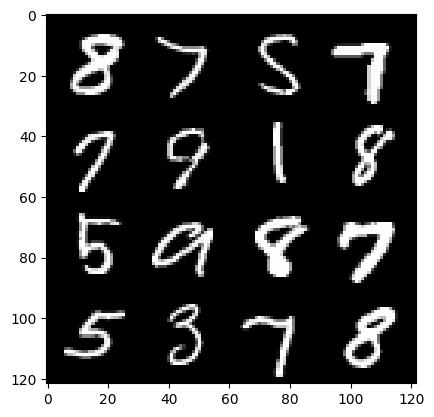

51: step 24000 / Gen loss: 71.92291709899901 / disc_loss:1.5791057116539446e-09


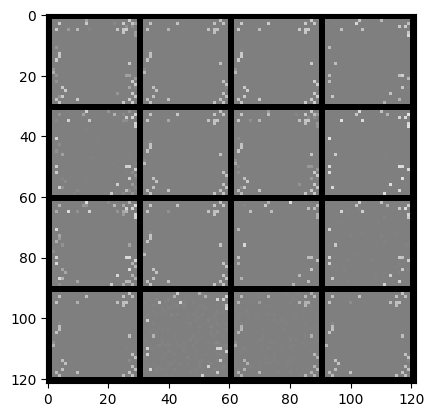

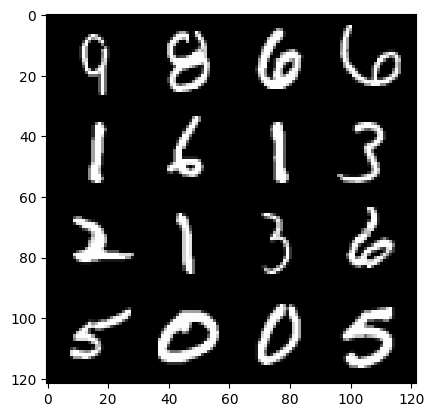

51: step 24300 / Gen loss: 72.30193272908531 / disc_loss:1.3907723871627478e-09


  0%|          | 0/469 [00:00<?, ?it/s]

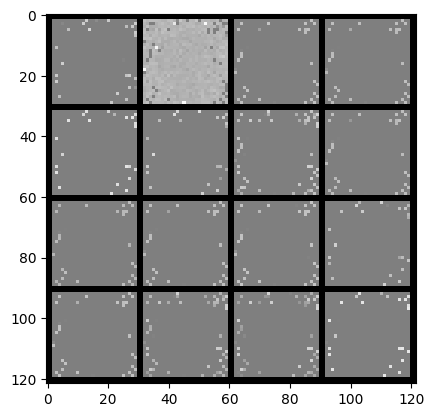

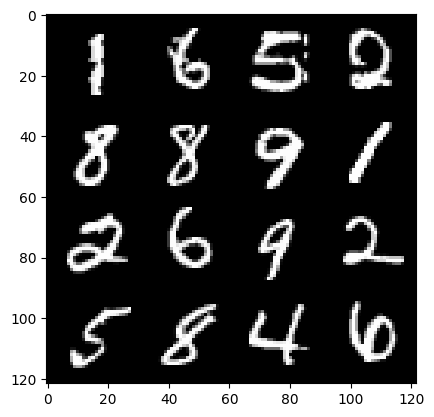

52: step 24600 / Gen loss: 72.6613678232829 / disc_loss:1.111376242146634e-09


  0%|          | 0/469 [00:00<?, ?it/s]

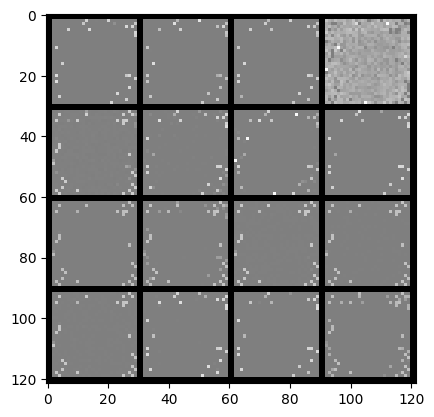

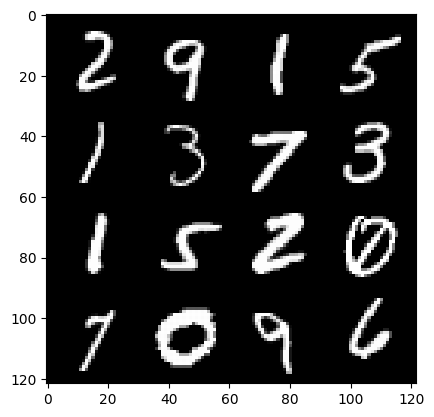

53: step 24900 / Gen loss: 73.06530436197919 / disc_loss:1.1051679717673697e-09


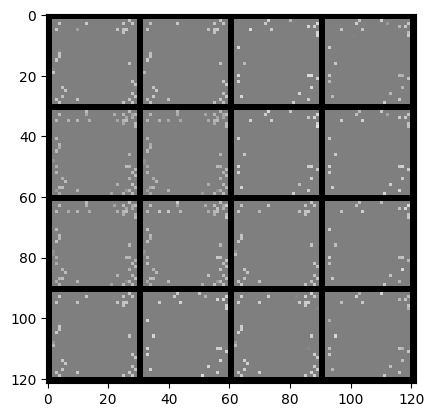

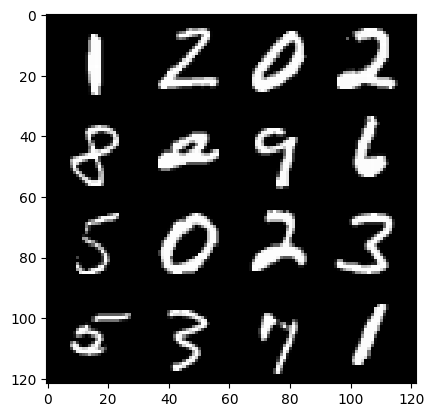

53: step 25200 / Gen loss: 73.39826230367028 / disc_loss:8.676811968921792e-10


  0%|          | 0/469 [00:00<?, ?it/s]

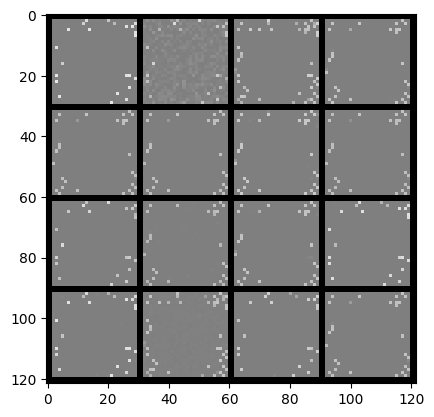

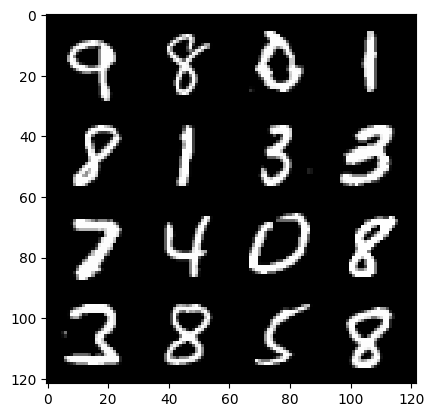

54: step 25500 / Gen loss: 73.81139305114742 / disc_loss:1.0617060835123782e-09


  0%|          | 0/469 [00:00<?, ?it/s]

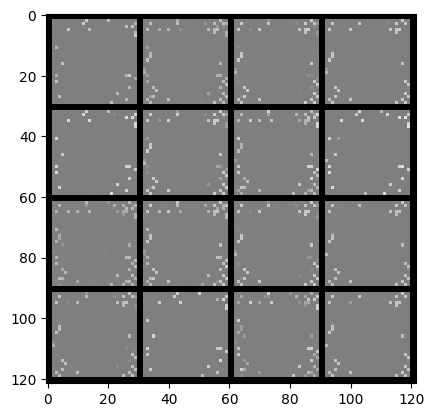

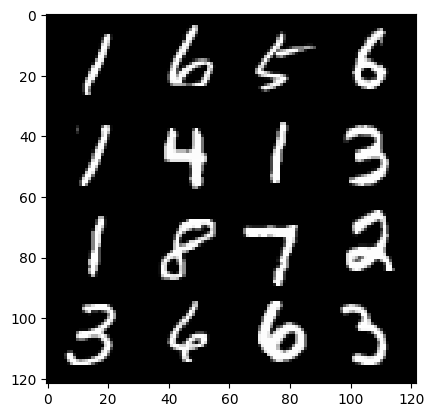

55: step 25800 / Gen loss: 74.27663920084633 / disc_loss:8.273236438520005e-10


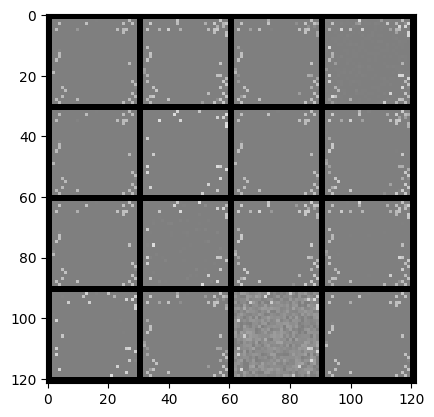

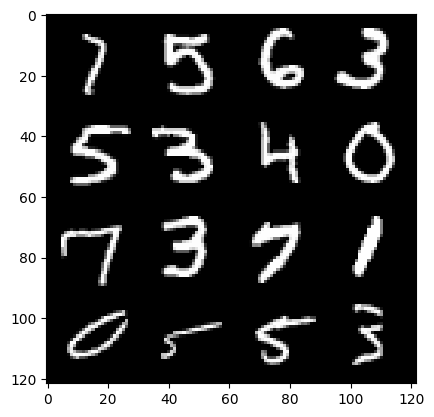

55: step 26100 / Gen loss: 74.55550025939935 / disc_loss:8.366372198735199e-10


  0%|          | 0/469 [00:00<?, ?it/s]

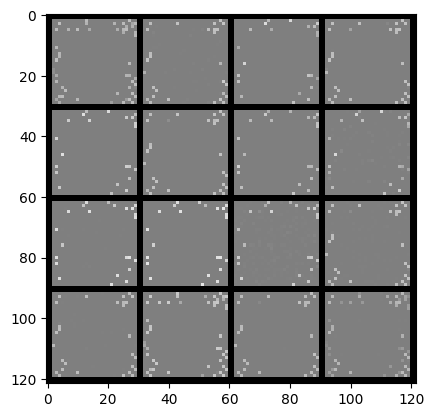

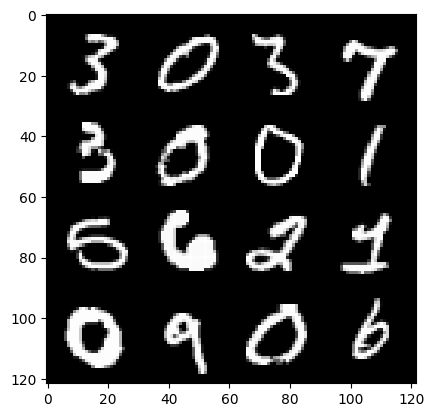

56: step 26400 / Gen loss: 74.94123011271164 / disc_loss:5.779367757511686e-10


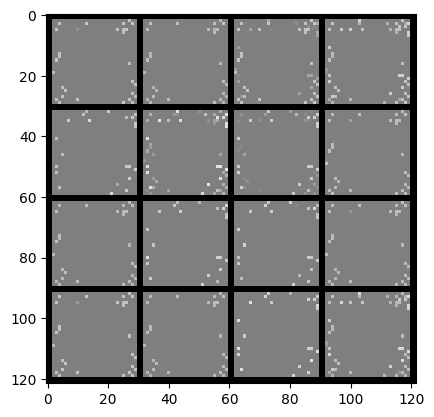

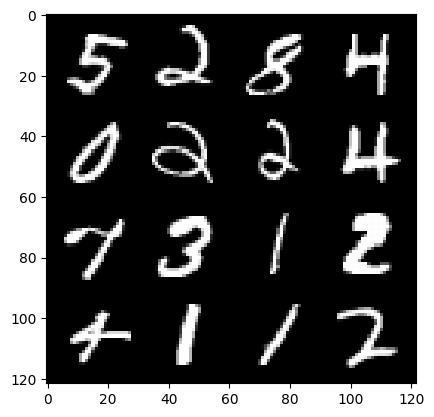

56: step 26700 / Gen loss: 75.23412170410154 / disc_loss:7.435049033851143e-10


  0%|          | 0/469 [00:00<?, ?it/s]

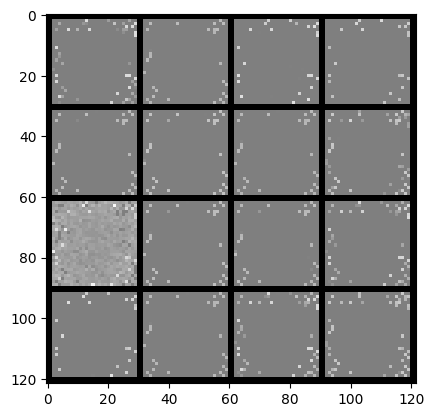

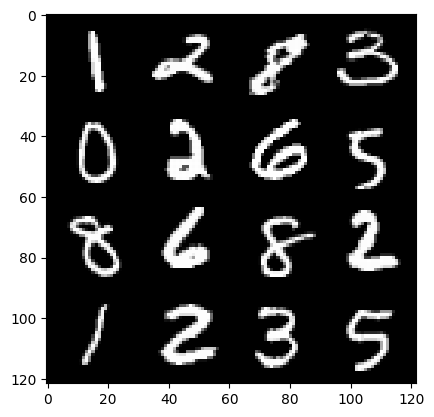

57: step 27000 / Gen loss: 75.60331555684411 / disc_loss:6.5968606466349e-10


  0%|          | 0/469 [00:00<?, ?it/s]

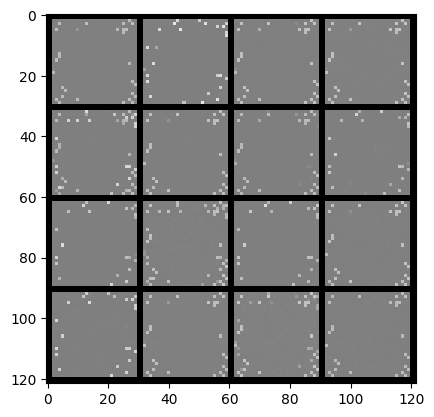

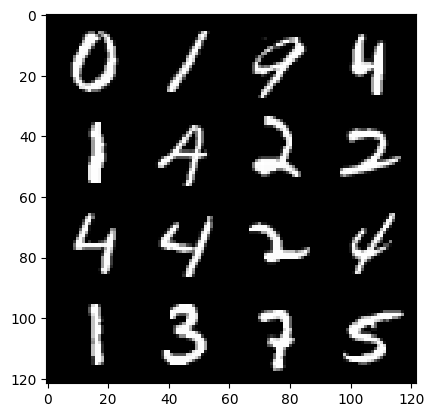

58: step 27300 / Gen loss: 75.94894849141443 / disc_loss:5.261968711682093e-10


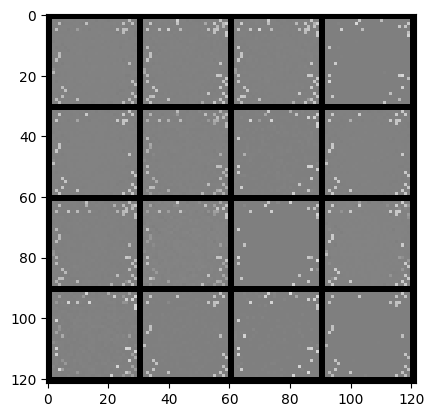

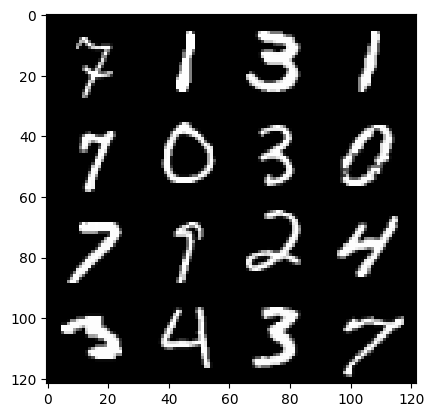

58: step 27600 / Gen loss: 76.20535677591963 / disc_loss:4.780784414644879e-10


  0%|          | 0/469 [00:00<?, ?it/s]

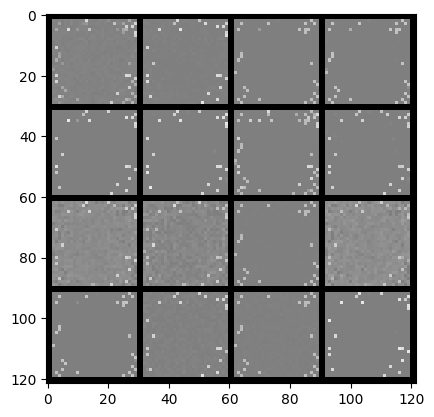

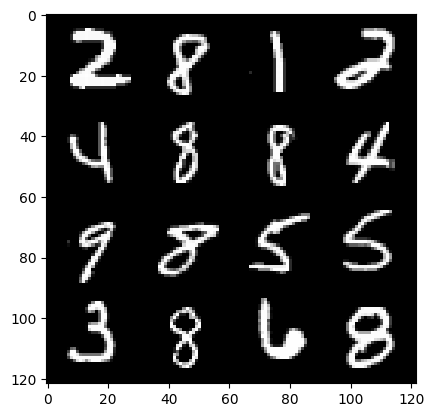

59: step 27900 / Gen loss: 76.25326988220219 / disc_loss:5.236099023808733e-10


  0%|          | 0/469 [00:00<?, ?it/s]

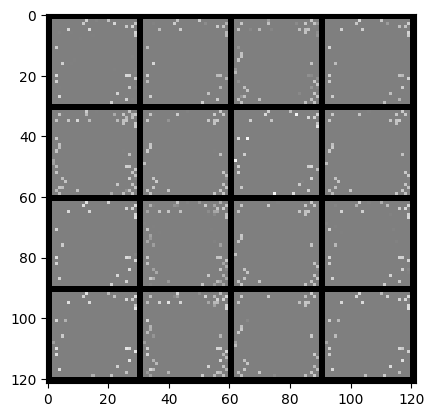

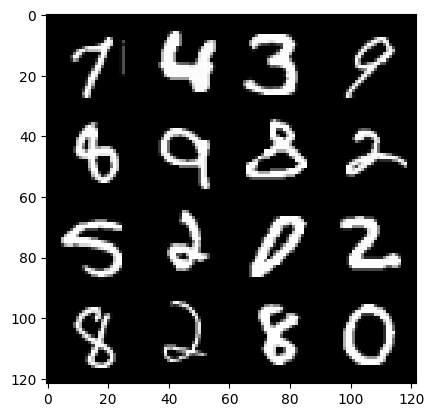

60: step 28200 / Gen loss: 76.35069084167483 / disc_loss:4.6566084821453317e-10


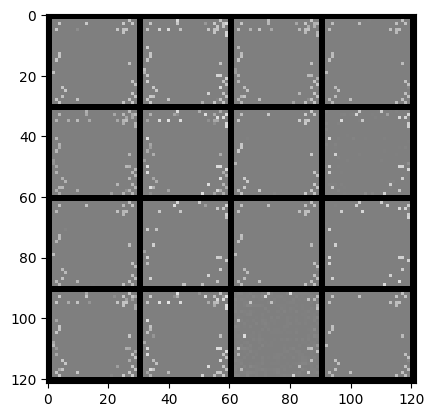

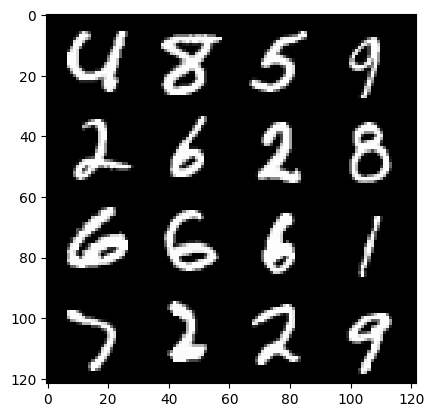

60: step 28500 / Gen loss: 76.62798266092935 / disc_loss:3.849464352834179e-10


  0%|          | 0/469 [00:00<?, ?it/s]

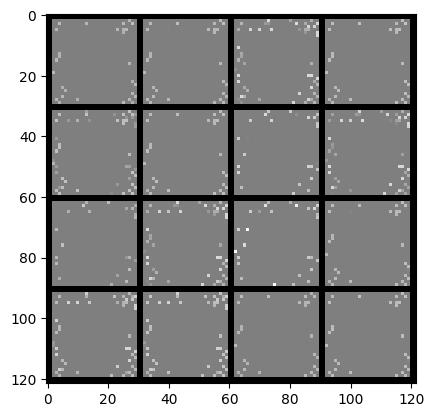

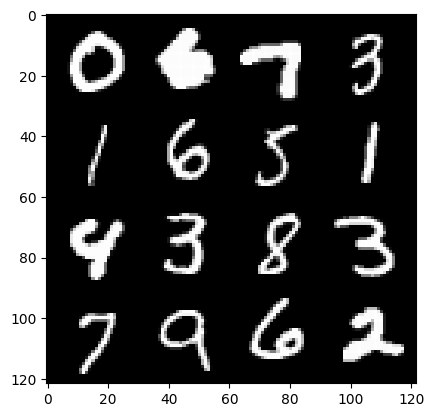

61: step 28800 / Gen loss: 76.91346074422201 / disc_loss:4.253036175091062e-10


  0%|          | 0/469 [00:00<?, ?it/s]

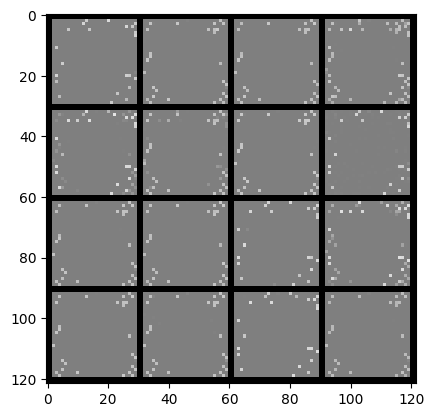

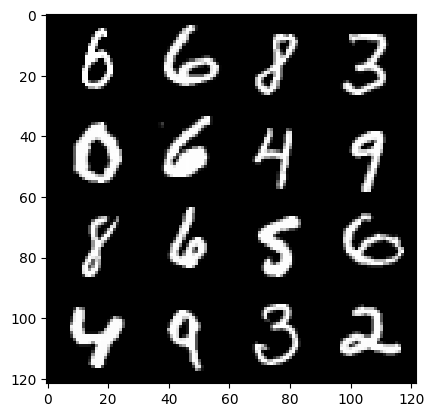

62: step 29100 / Gen loss: 77.22252357482917 / disc_loss:3.6011110167895796e-10


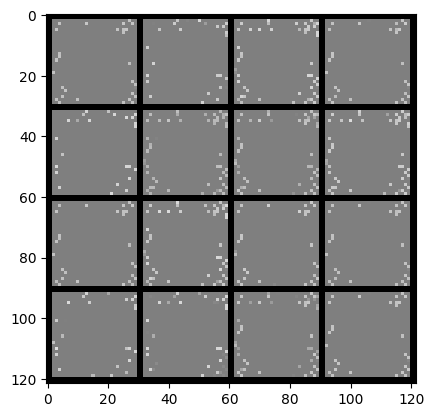

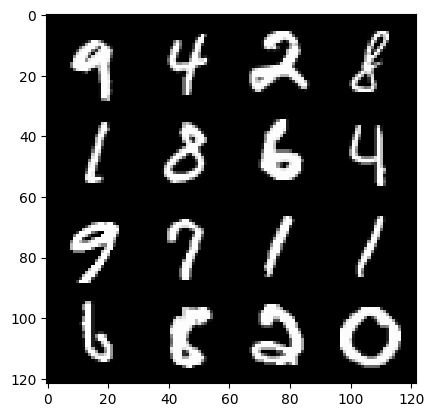

62: step 29400 / Gen loss: 77.5561425018311 / disc_loss:3.3061928204440153e-10


  0%|          | 0/469 [00:00<?, ?it/s]

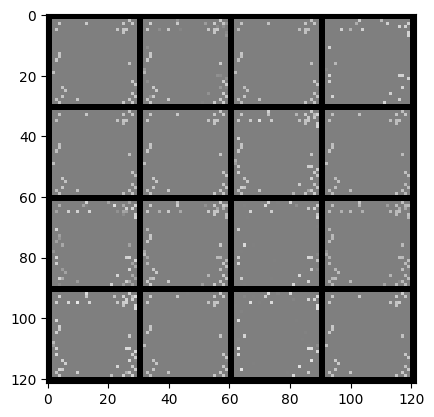

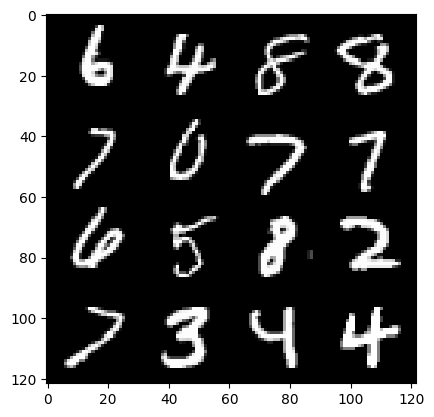

63: step 29700 / Gen loss: 77.89445060729979 / disc_loss:4.3151248879658184e-10


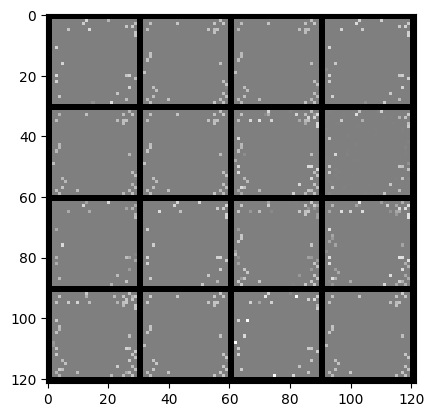

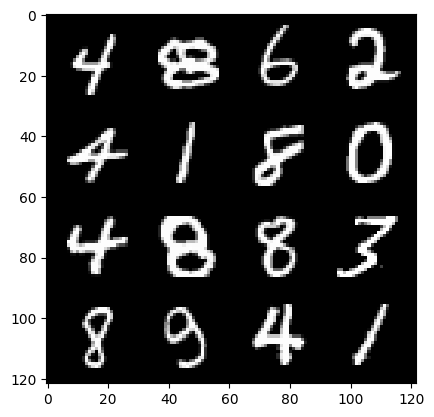

63: step 30000 / Gen loss: 78.2159297180175 / disc_loss:2.2506951876296213e-10


  0%|          | 0/469 [00:00<?, ?it/s]

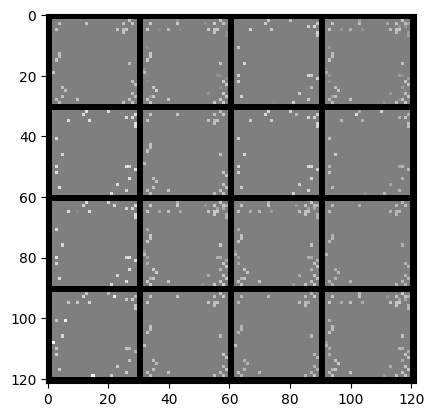

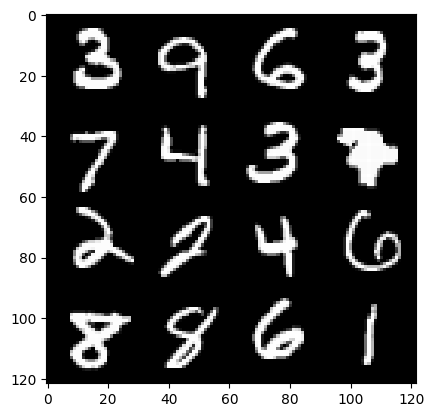

64: step 30300 / Gen loss: 78.55957061767576 / disc_loss:3.290670913536078e-10


  0%|          | 0/469 [00:00<?, ?it/s]

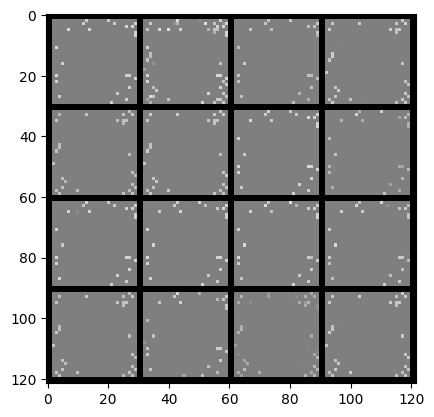

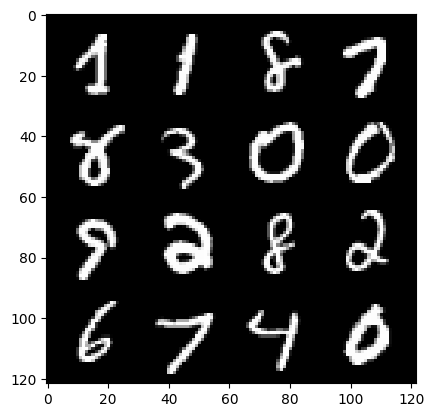

65: step 30600 / Gen loss: 78.78481811523443 / disc_loss:2.343827153657625e-10


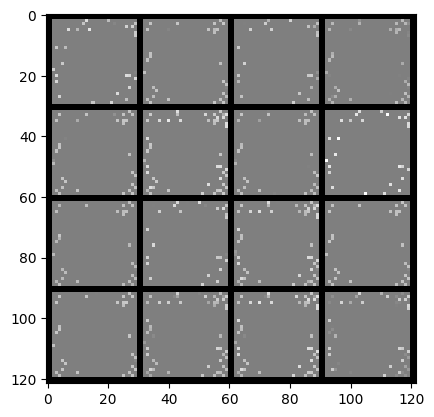

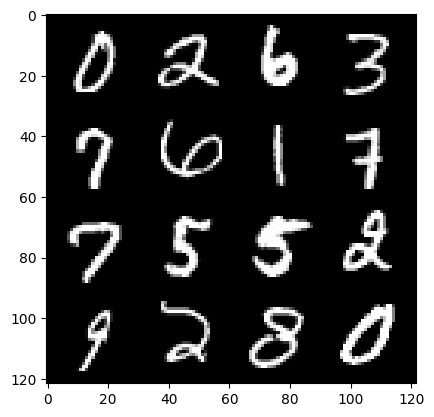

65: step 30900 / Gen loss: 79.0789156850179 / disc_loss:2.405915613031458e-10


  0%|          | 0/469 [00:00<?, ?it/s]

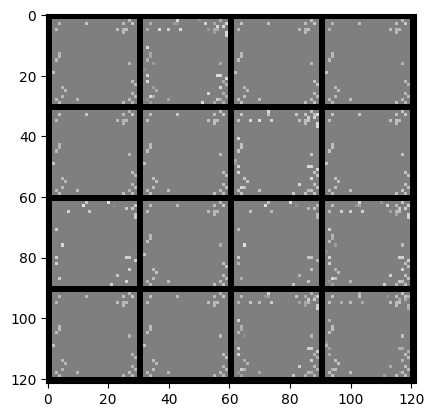

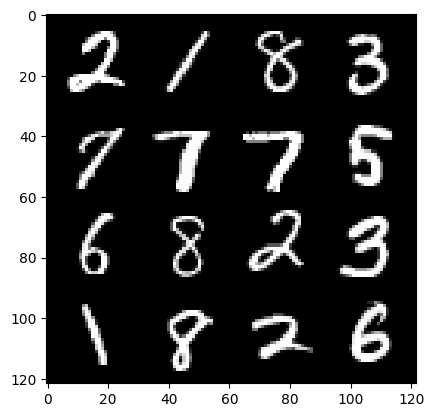

66: step 31200 / Gen loss: 79.34581545511882 / disc_loss:2.7784440387312867e-10


  0%|          | 0/469 [00:00<?, ?it/s]

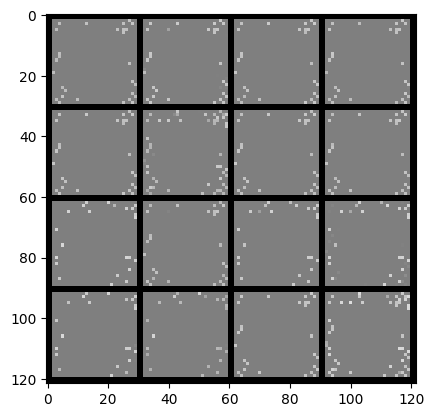

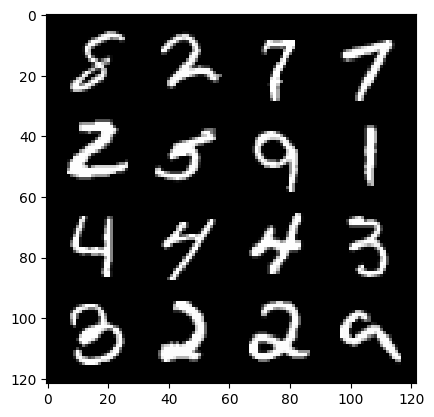

67: step 31500 / Gen loss: 79.6235928853353 / disc_loss:1.5211598675124449e-10


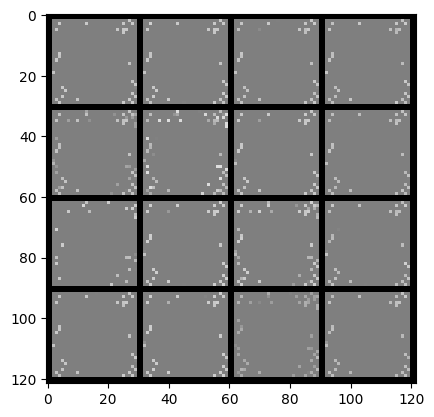

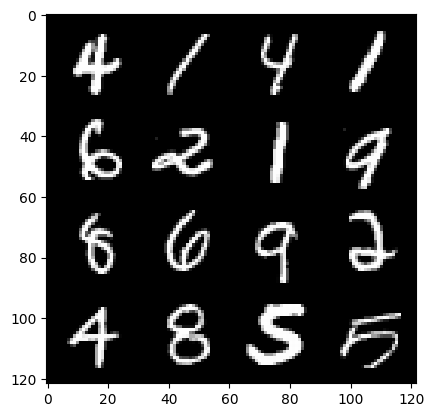

67: step 31800 / Gen loss: 79.86954406738278 / disc_loss:1.971298728882982e-10


  0%|          | 0/469 [00:00<?, ?it/s]

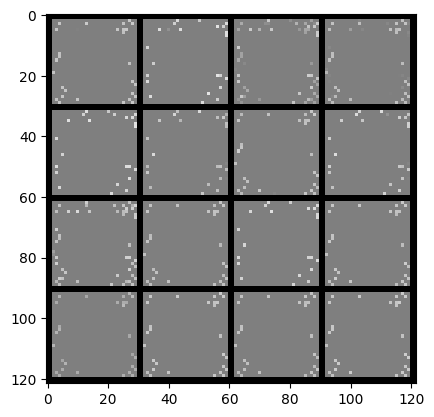

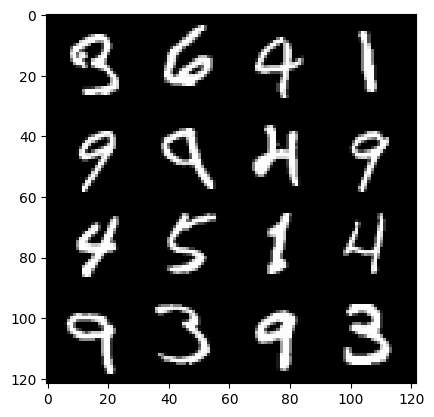

68: step 32100 / Gen loss: 80.13489046732585 / disc_loss:2.4680031981046593e-10


  0%|          | 0/469 [00:00<?, ?it/s]

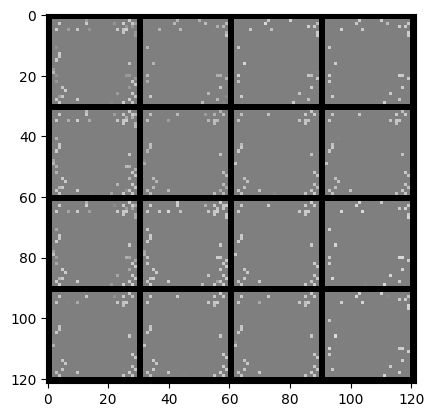

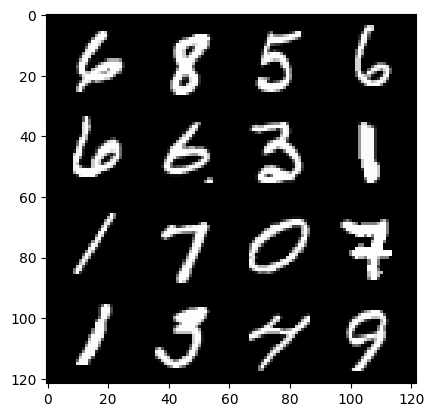

69: step 32400 / Gen loss: 80.38998308817548 / disc_loss:1.6608580575653649e-10


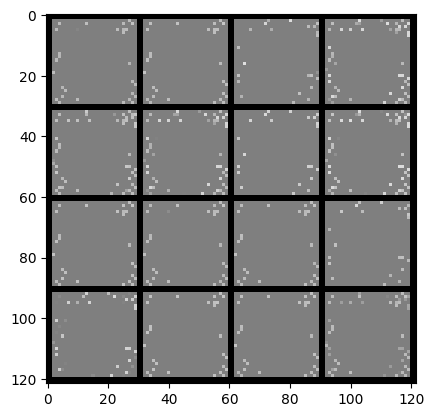

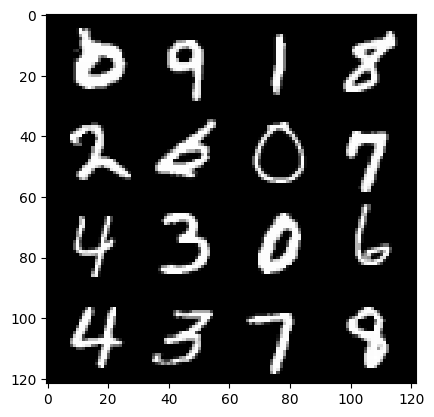

69: step 32700 / Gen loss: 80.65647221883138 / disc_loss:2.0023426648233903e-10


  0%|          | 0/469 [00:00<?, ?it/s]

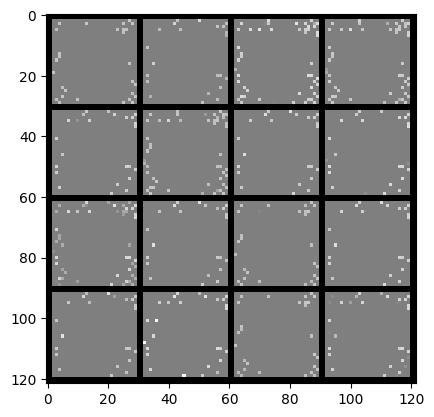

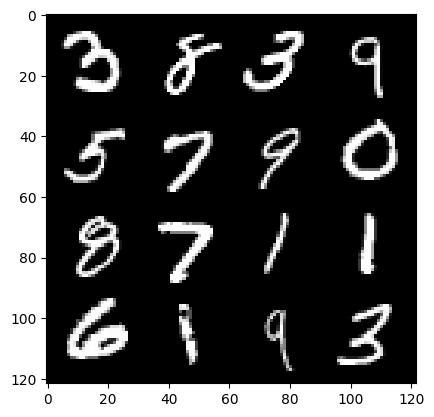

70: step 33000 / Gen loss: 80.87872136433927 / disc_loss:1.7229462107026796e-10


  0%|          | 0/469 [00:00<?, ?it/s]

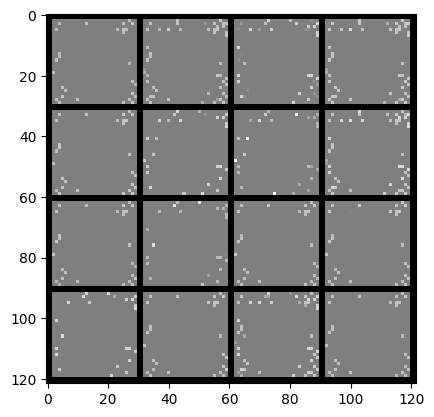

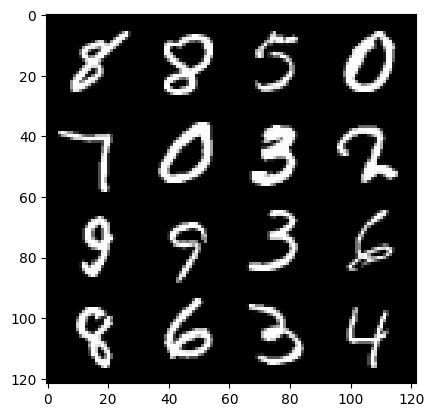

71: step 33300 / Gen loss: 81.09876754760741 / disc_loss:1.412505262754493e-10


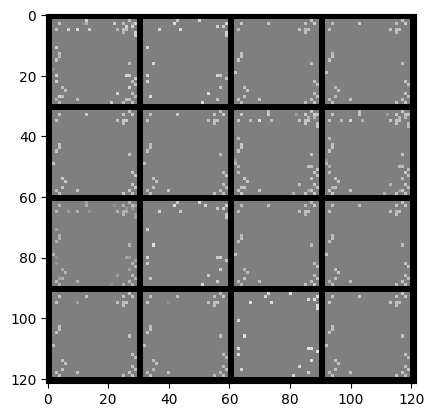

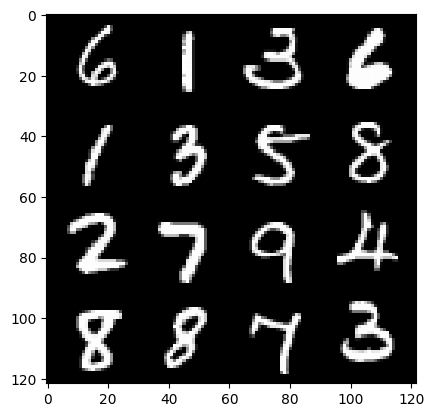

71: step 33600 / Gen loss: 81.3153571573894 / disc_loss:1.6142917993085716e-10


  0%|          | 0/469 [00:00<?, ?it/s]

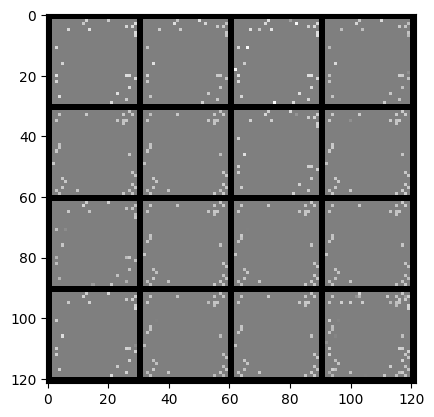

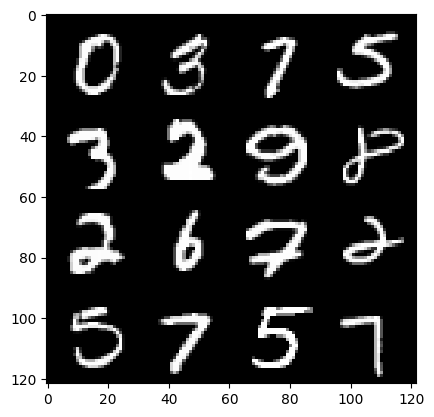

72: step 33900 / Gen loss: 81.53180600484221 / disc_loss:1.614291782655226e-10


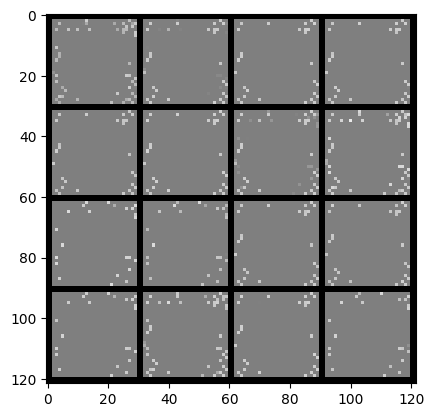

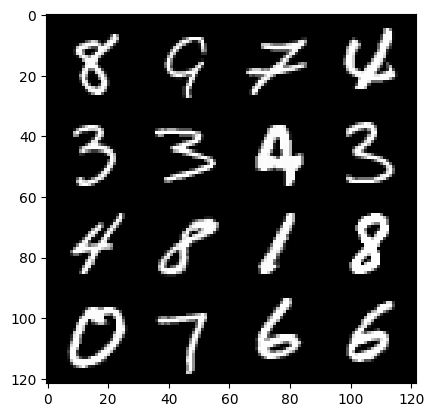

72: step 34200 / Gen loss: 81.75926160176594 / disc_loss:1.2107190268858162e-10


  0%|          | 0/469 [00:00<?, ?it/s]

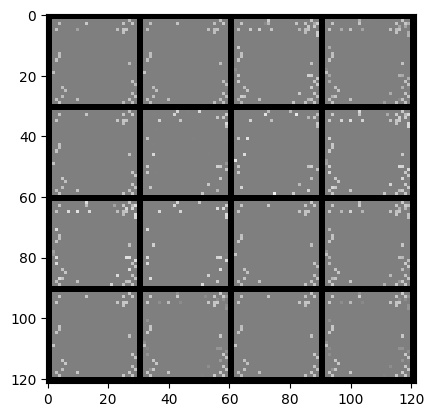

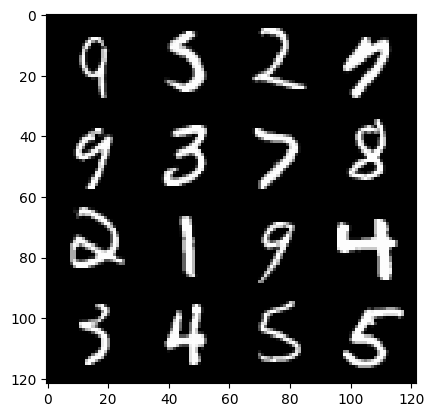

73: step 34500 / Gen loss: 81.91192217508953 / disc_loss:7.295359177872383e-11


  0%|          | 0/469 [00:00<?, ?it/s]

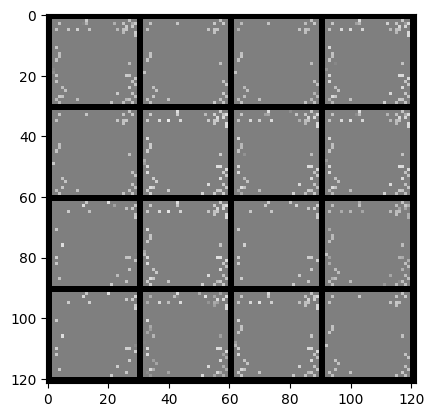

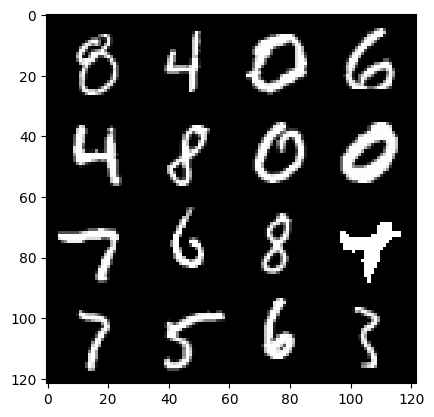

74: step 34800 / Gen loss: 82.11916638692219 / disc_loss:1.6608579502438063e-10


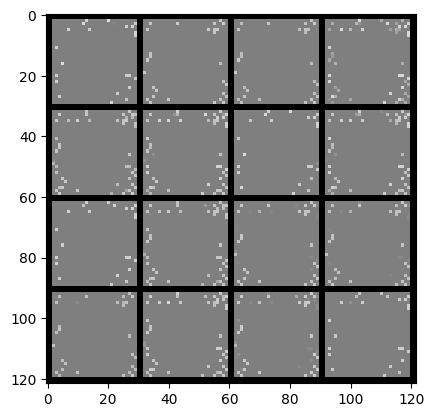

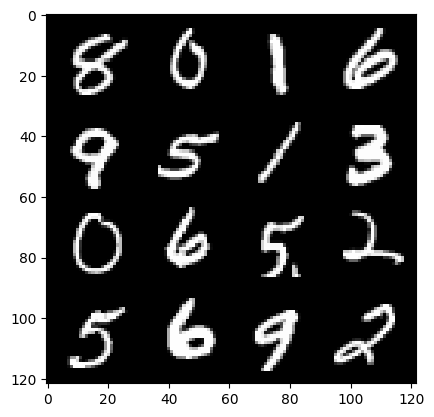

74: step 35100 / Gen loss: 82.31255073547362 / disc_loss:1.5522036979816648e-10


  0%|          | 0/469 [00:00<?, ?it/s]

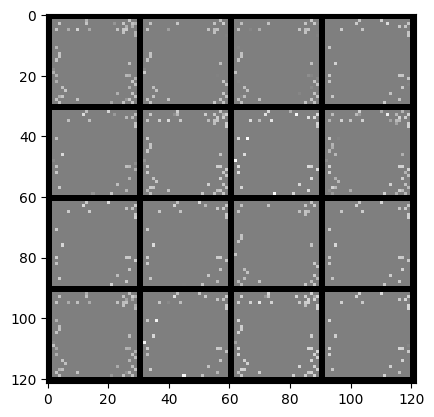

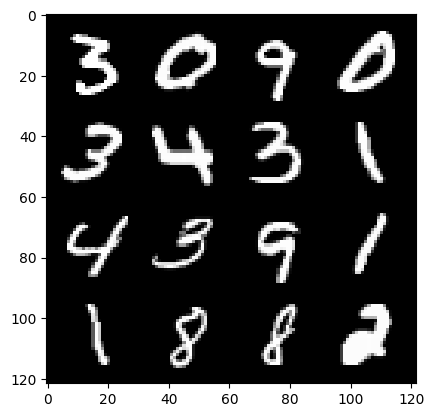

75: step 35400 / Gen loss: 82.51595520019531 / disc_loss:9.468444482167252e-11


  0%|          | 0/469 [00:00<?, ?it/s]

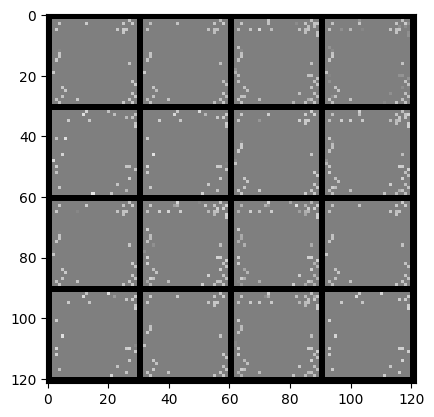

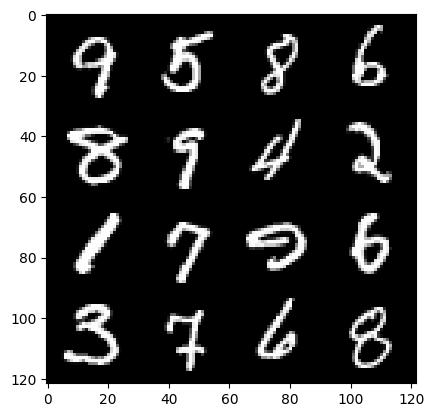

76: step 35700 / Gen loss: 82.68466082255044 / disc_loss:1.5832478106325705e-10


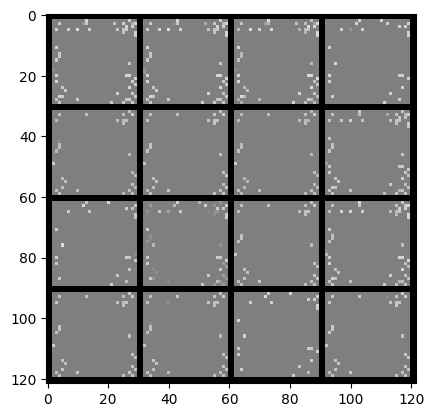

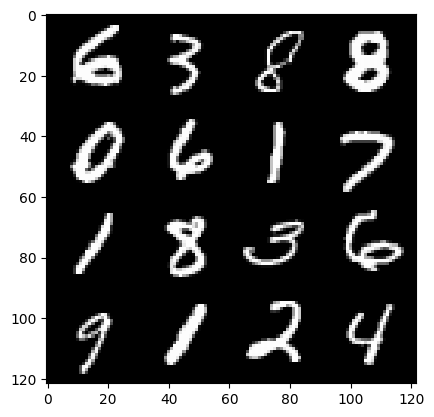

76: step 36000 / Gen loss: 82.87561172485353 / disc_loss:9.158001986383129e-11


  0%|          | 0/469 [00:00<?, ?it/s]

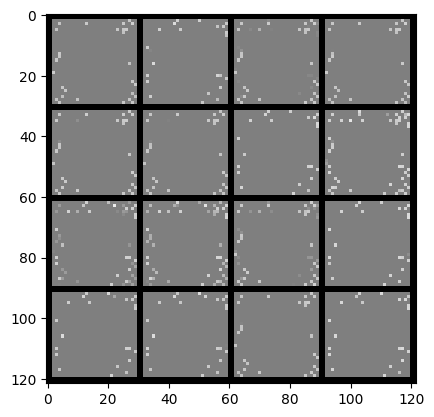

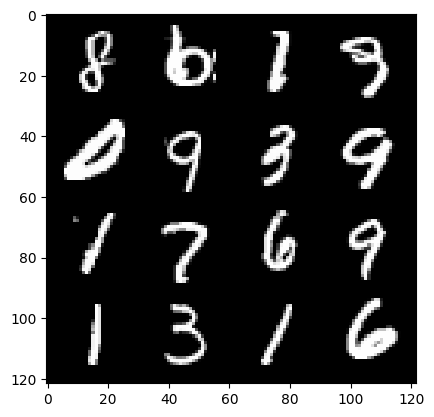

77: step 36300 / Gen loss: 83.02643376668301 / disc_loss:9.313224450894587e-11


  0%|          | 0/469 [00:00<?, ?it/s]

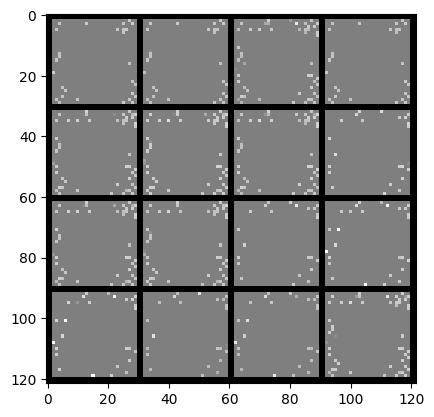

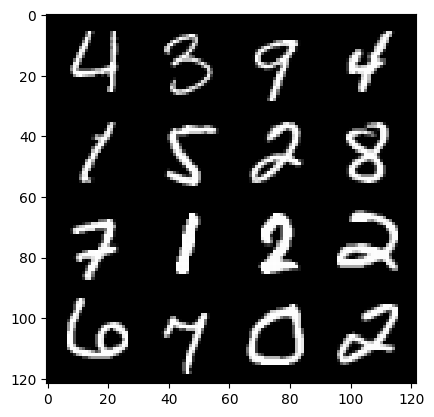

78: step 36600 / Gen loss: 83.16994735717769 / disc_loss:1.1641528148883158e-10


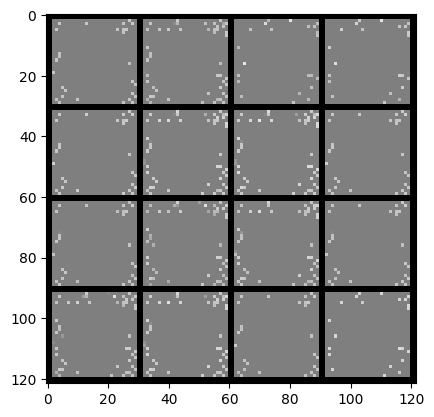

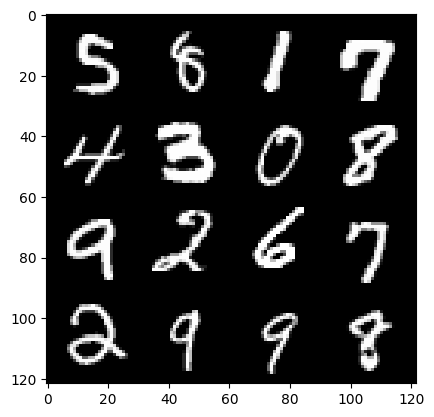

78: step 36900 / Gen loss: 83.36180987040207 / disc_loss:1.257285074200235e-10


  0%|          | 0/469 [00:00<?, ?it/s]

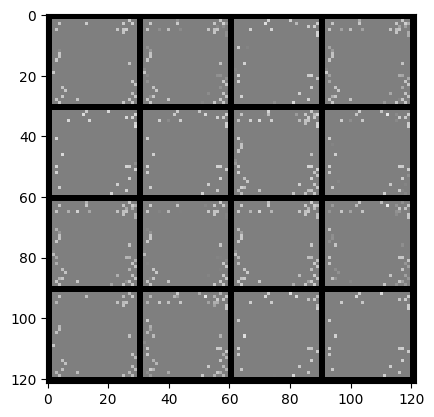

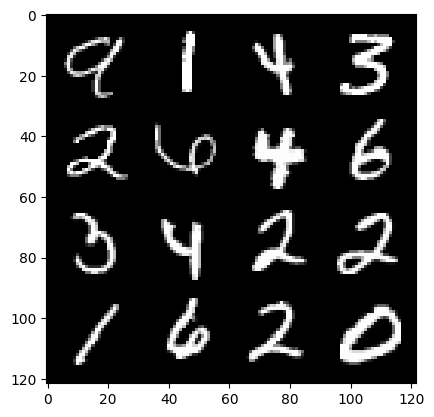

79: step 37200 / Gen loss: 83.51731719970704 / disc_loss:8.071460731266336e-11


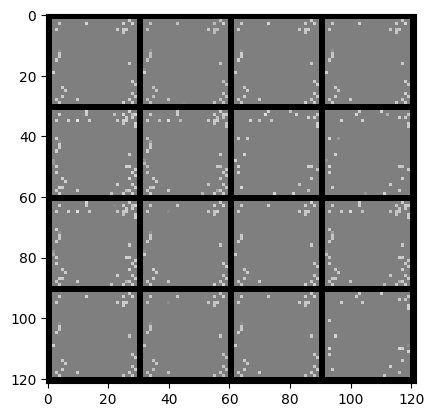

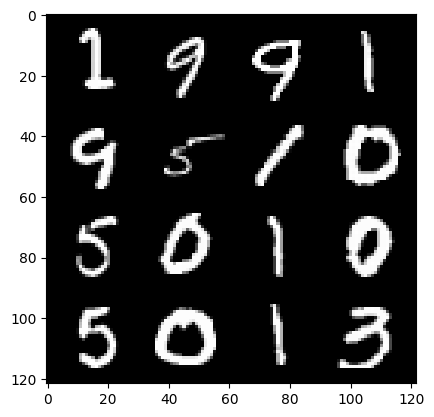

79: step 37500 / Gen loss: 83.6580965423584 / disc_loss:9.15800254149464e-11


  0%|          | 0/469 [00:00<?, ?it/s]

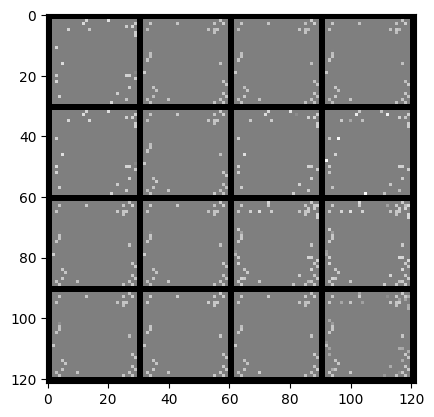

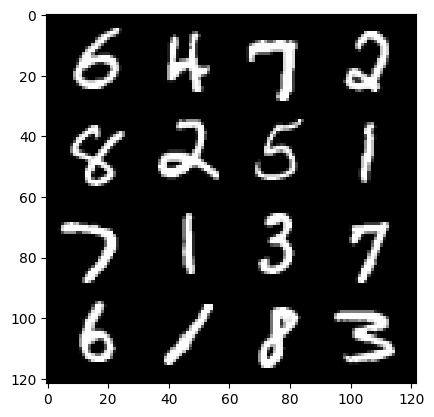

80: step 37800 / Gen loss: 83.80113085428877 / disc_loss:6.829697677771898e-11


  0%|          | 0/469 [00:00<?, ?it/s]

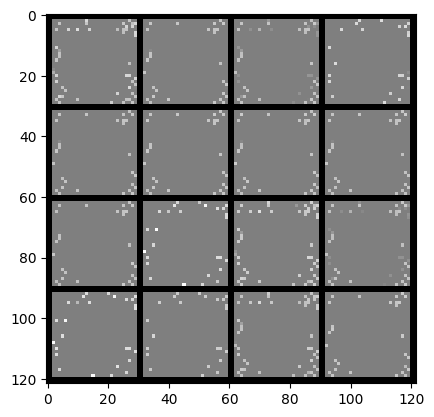

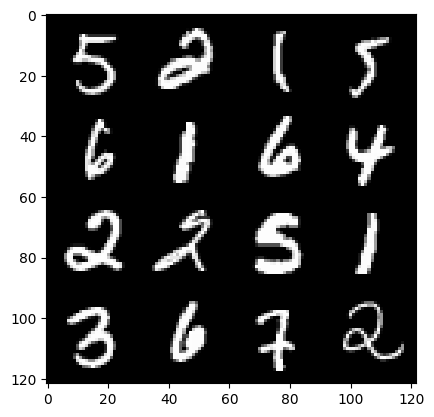

81: step 38100 / Gen loss: 83.94660344441735 / disc_loss:1.1796748476215295e-10


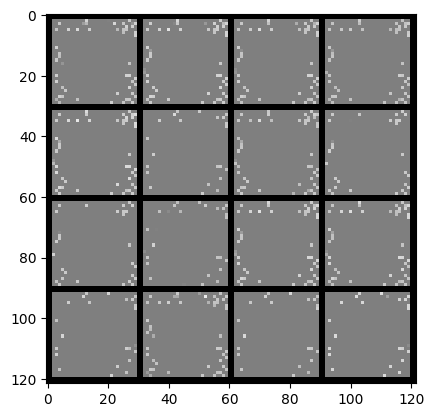

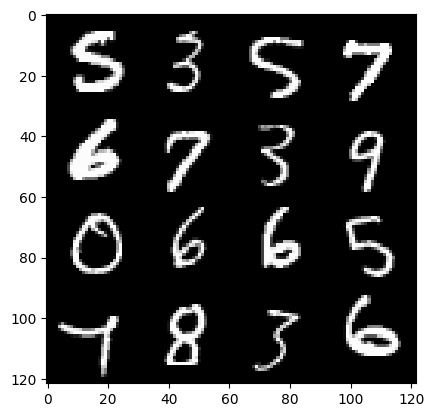

81: step 38400 / Gen loss: 84.10666191101073 / disc_loss:6.519256717796294e-11


  0%|          | 0/469 [00:00<?, ?it/s]

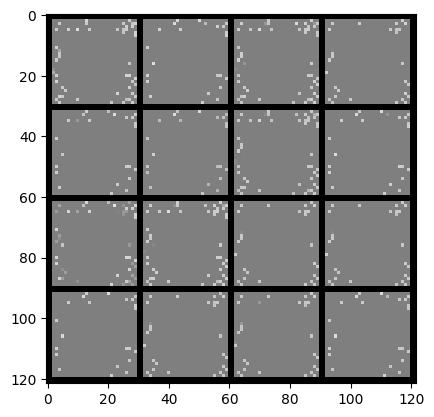

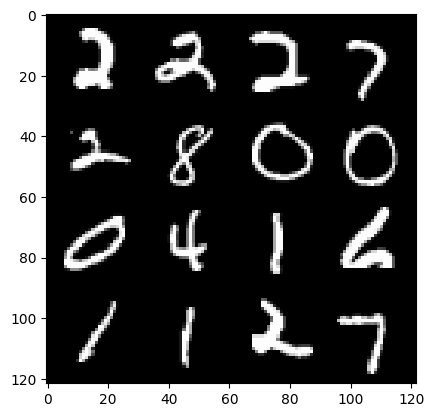

82: step 38700 / Gen loss: 84.22723899841307 / disc_loss:7.140137731065366e-11


  0%|          | 0/469 [00:00<?, ?it/s]

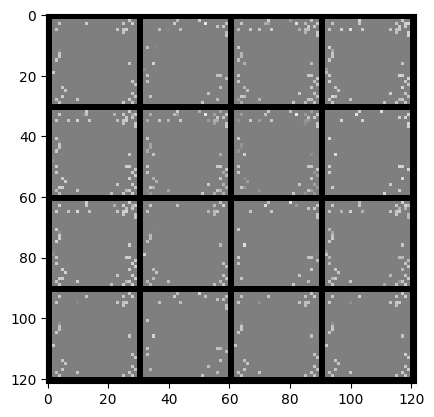

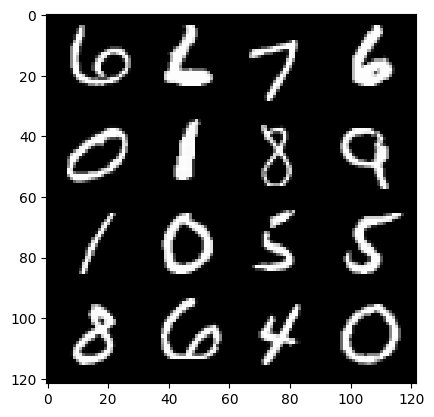

83: step 39000 / Gen loss: 84.35116882324223 / disc_loss:9.468443640248125e-11


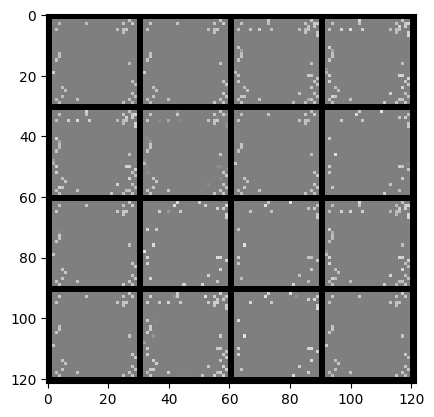

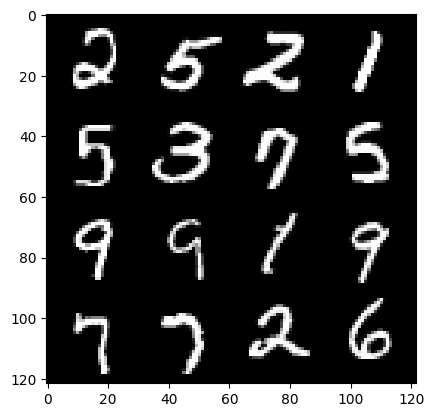

83: step 39300 / Gen loss: 84.48329991658531 / disc_loss:5.2774939048501803e-11


  0%|          | 0/469 [00:00<?, ?it/s]

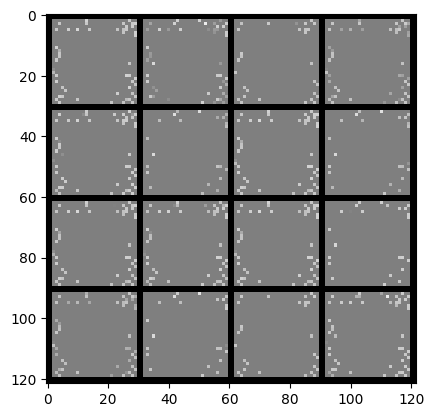

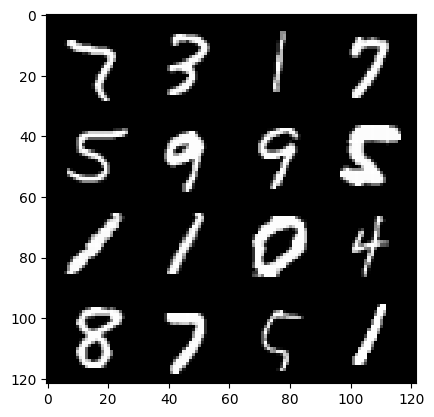

84: step 39600 / Gen loss: 84.61401199340816 / disc_loss:8.2266812528875e-11


  0%|          | 0/469 [00:00<?, ?it/s]

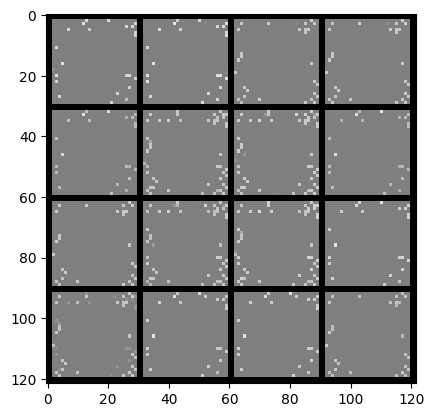

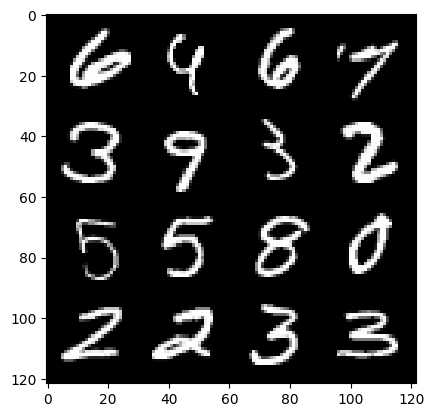

85: step 39900 / Gen loss: 84.72374287923178 / disc_loss:7.916239626778083e-11


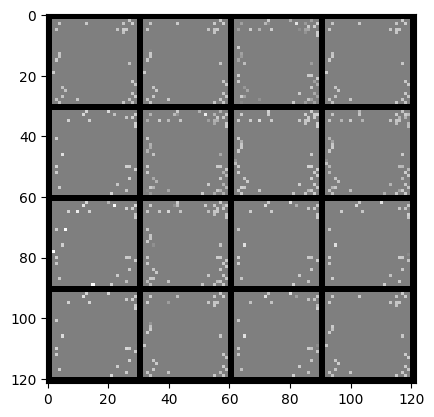

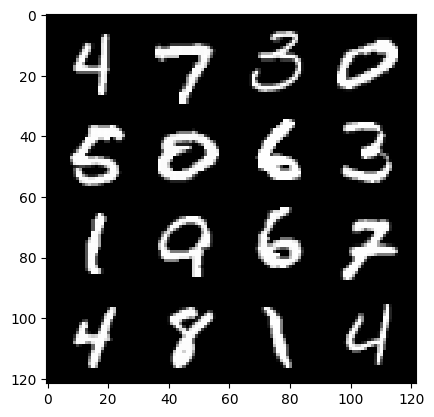

85: step 40200 / Gen loss: 84.86685147603353 / disc_loss:8.071460305680844e-11


  0%|          | 0/469 [00:00<?, ?it/s]

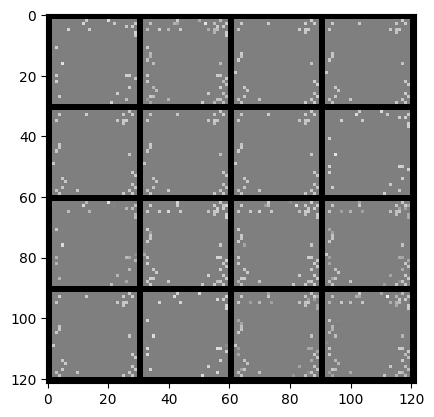

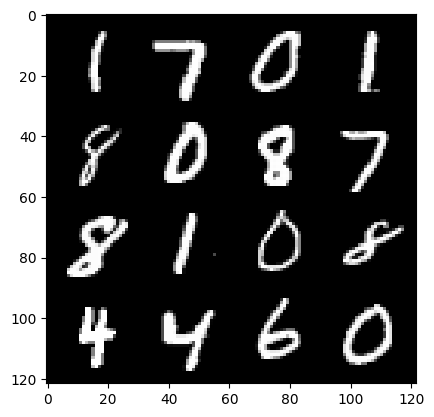

86: step 40500 / Gen loss: 84.98638430277508 / disc_loss:6.519256375477529e-11


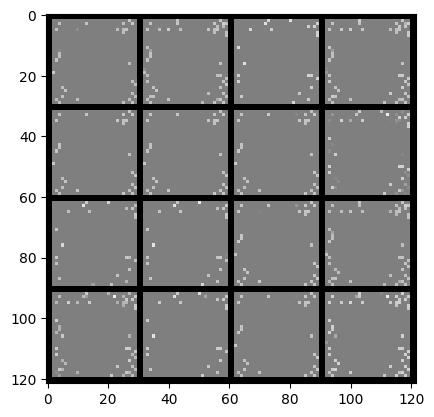

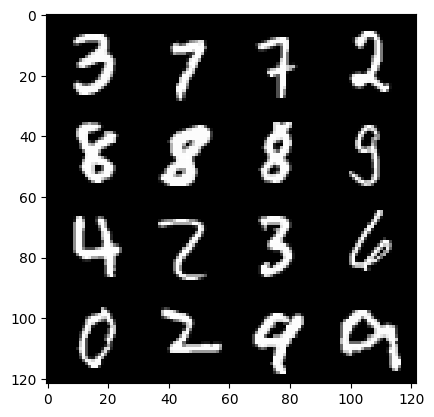

86: step 40800 / Gen loss: 85.111104482015 / disc_loss:6.67447742445463e-11


  0%|          | 0/469 [00:00<?, ?it/s]

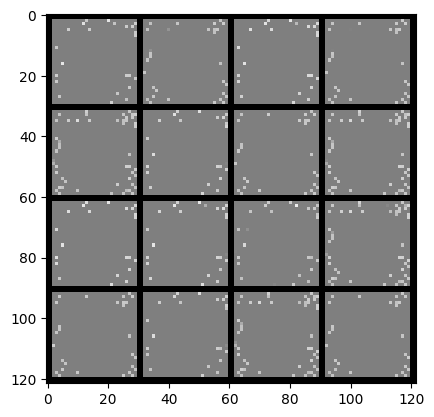

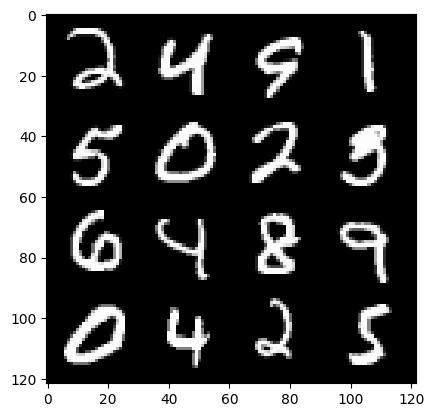

87: step 41100 / Gen loss: 85.21353823343917 / disc_loss:6.36403594637495e-11


  0%|          | 0/469 [00:00<?, ?it/s]

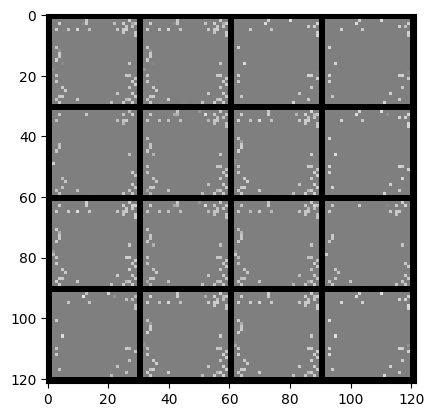

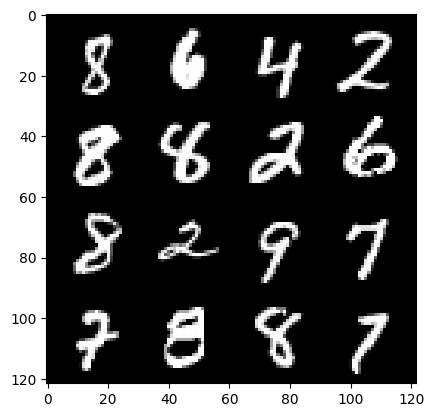

88: step 41400 / Gen loss: 85.3247583516439 / disc_loss:6.674477461462067e-11


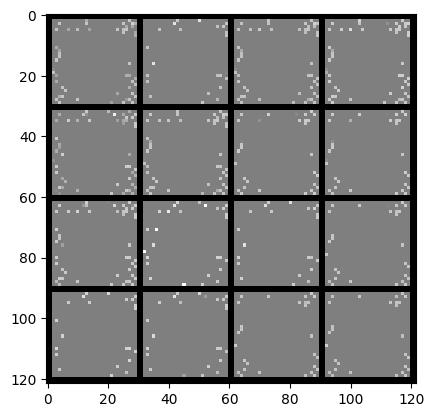

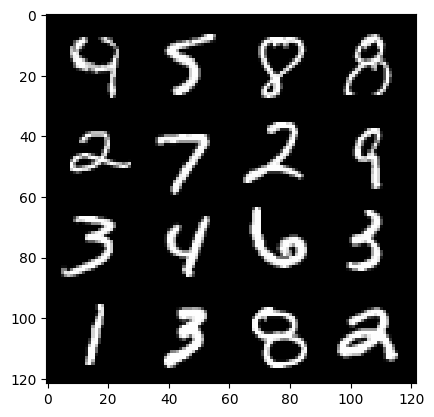

88: step 41700 / Gen loss: 85.43485562642418 / disc_loss:6.674477054380291e-11


  0%|          | 0/469 [00:00<?, ?it/s]

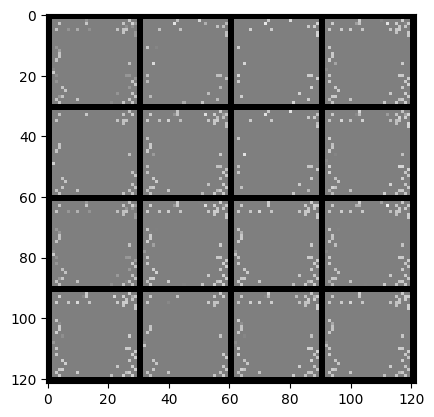

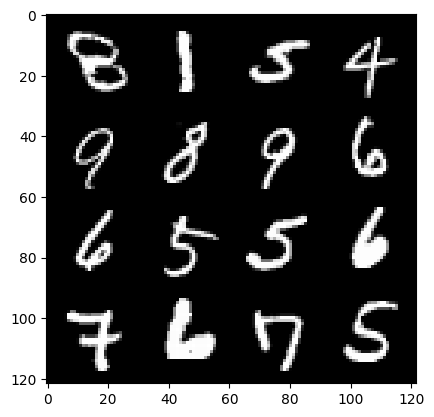

89: step 42000 / Gen loss: 85.55501253763836 / disc_loss:6.829697844305354e-11


  0%|          | 0/469 [00:00<?, ?it/s]

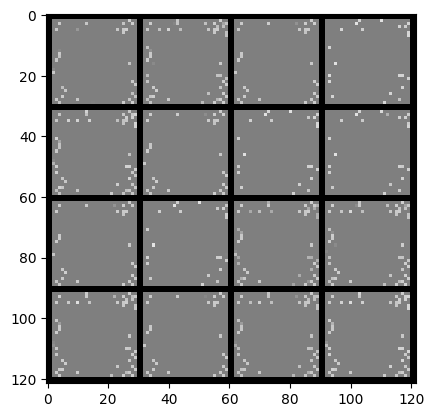

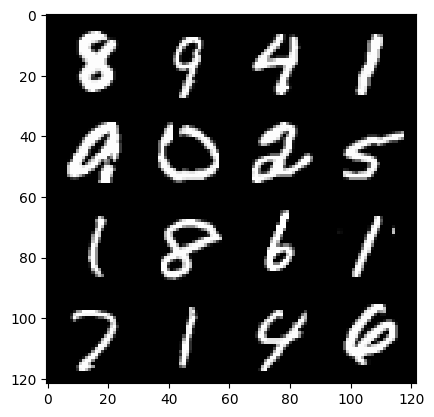

90: step 42300 / Gen loss: 85.65648295084634 / disc_loss:6.053595356473687e-11


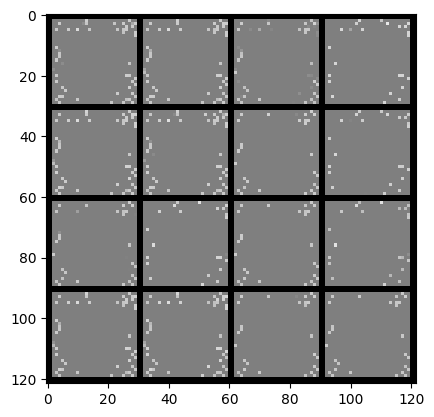

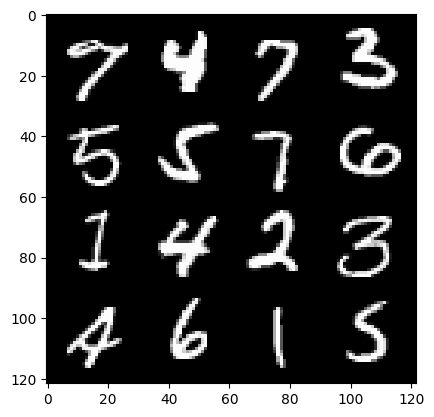

90: step 42600 / Gen loss: 85.76594543457033 / disc_loss:5.898374918119249e-11


  0%|          | 0/469 [00:00<?, ?it/s]

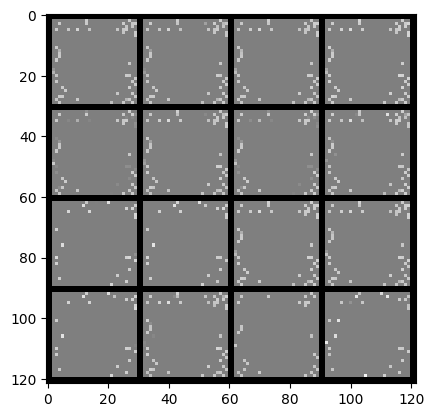

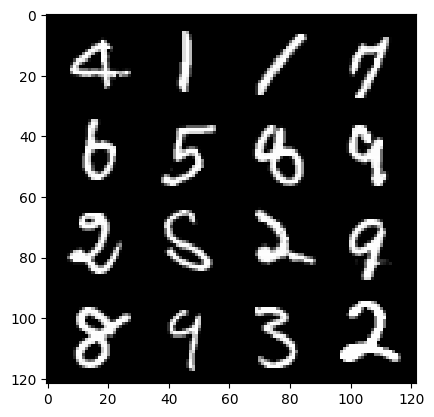

91: step 42900 / Gen loss: 85.87983629862468 / disc_loss:8.071460685007041e-11


  0%|          | 0/469 [00:00<?, ?it/s]

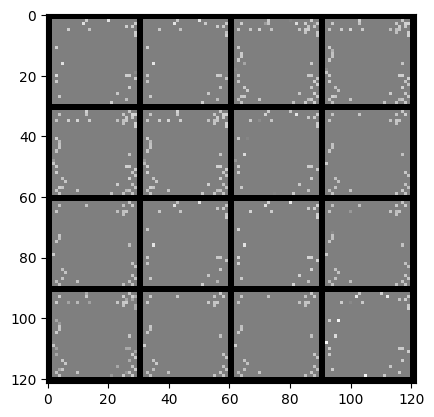

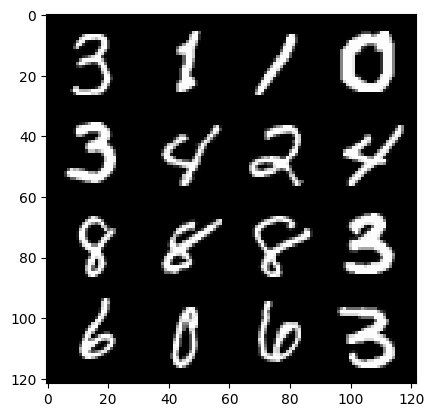

92: step 43200 / Gen loss: 85.97680809021001 / disc_loss:3.725289854372705e-11


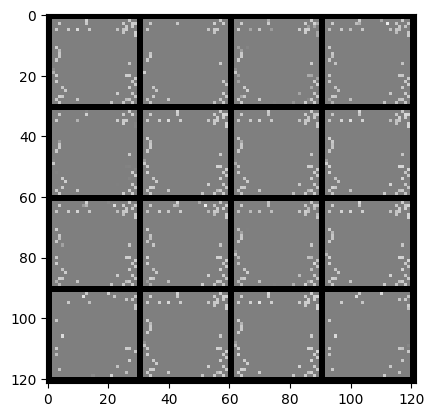

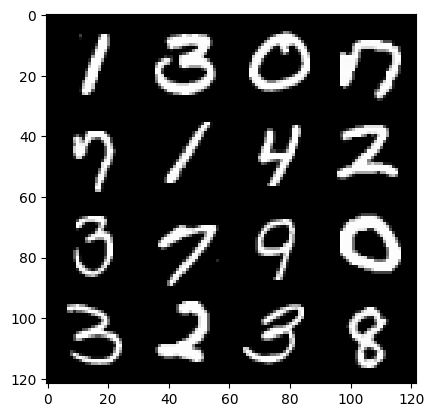

92: step 43500 / Gen loss: 86.06973574320482 / disc_loss:6.208815711561398e-11


  0%|          | 0/469 [00:00<?, ?it/s]

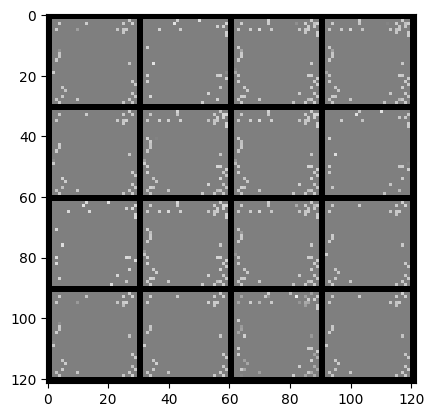

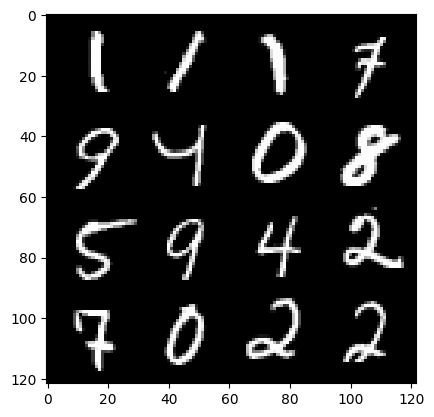

93: step 43800 / Gen loss: 86.15110382080086 / disc_loss:2.949187792126533e-11


  0%|          | 0/469 [00:00<?, ?it/s]

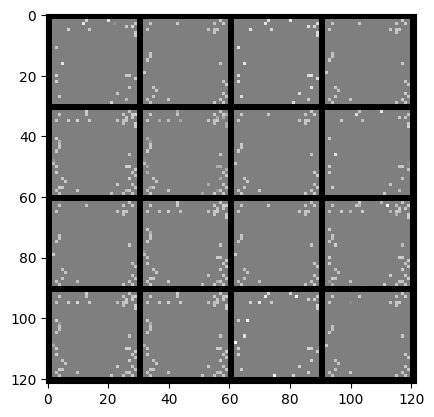

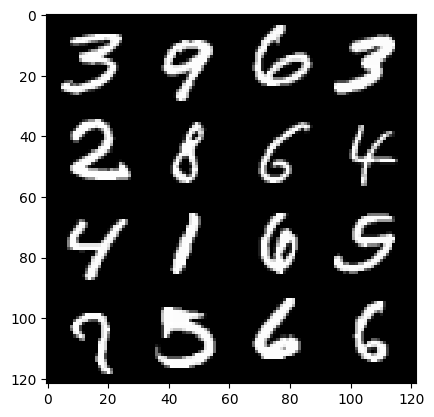

94: step 44100 / Gen loss: 86.25079762776687 / disc_loss:6.984917810815004e-11


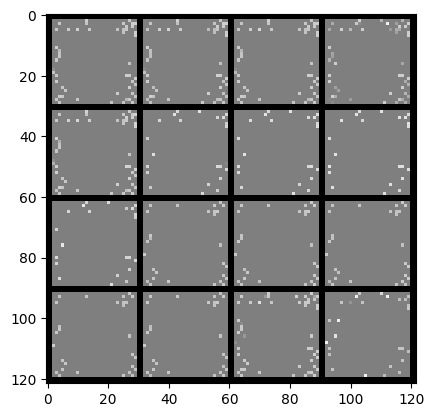

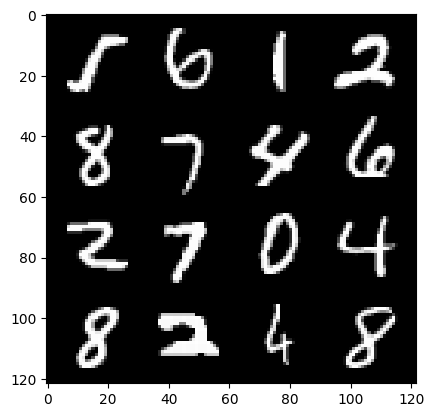

94: step 44400 / Gen loss: 86.35521690368648 / disc_loss:6.364036196175131e-11


  0%|          | 0/469 [00:00<?, ?it/s]

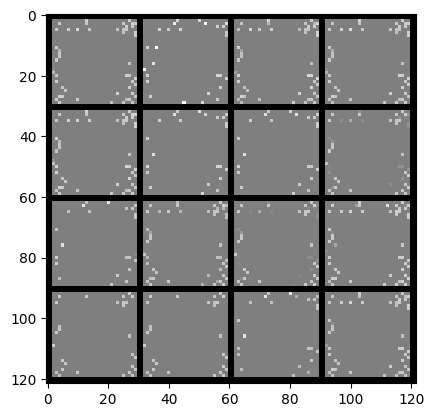

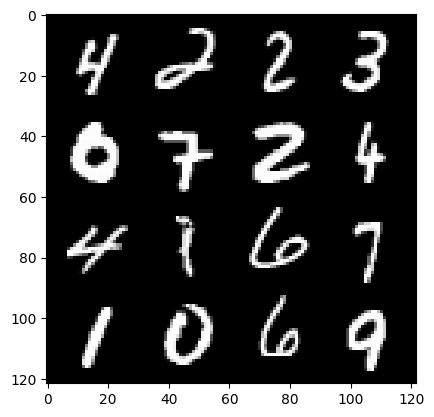

95: step 44700 / Gen loss: 86.44163688659665 / disc_loss:3.7252896878392507e-11


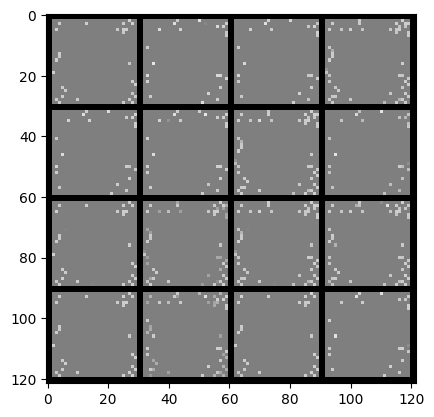

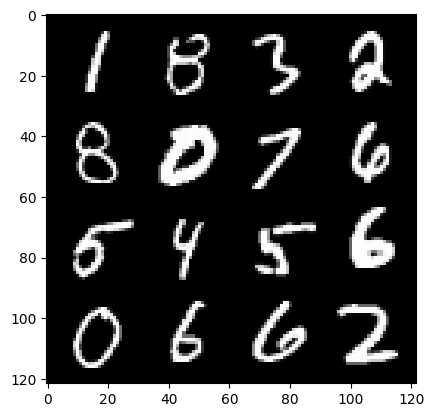

95: step 45000 / Gen loss: 86.52356913248698 / disc_loss:5.743154766572428e-11


  0%|          | 0/469 [00:00<?, ?it/s]

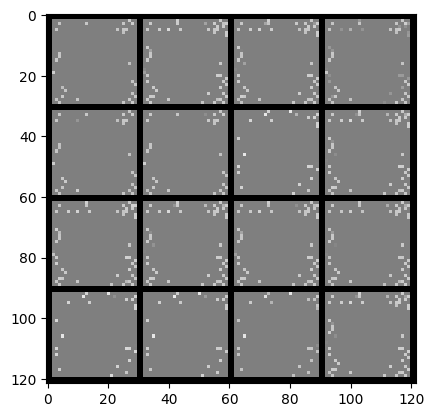

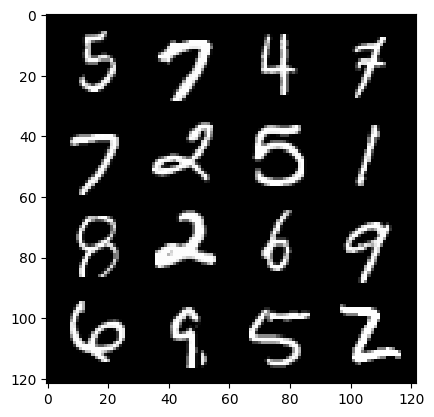

96: step 45300 / Gen loss: 86.61330998738605 / disc_loss:4.6566118461210954e-11


  0%|          | 0/469 [00:00<?, ?it/s]

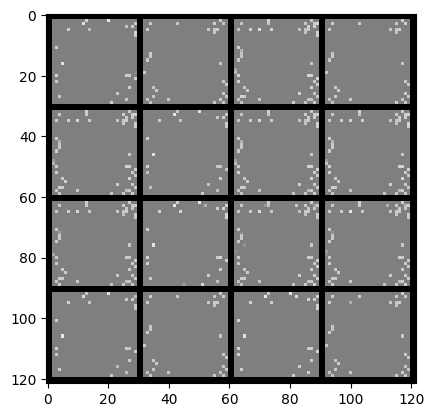

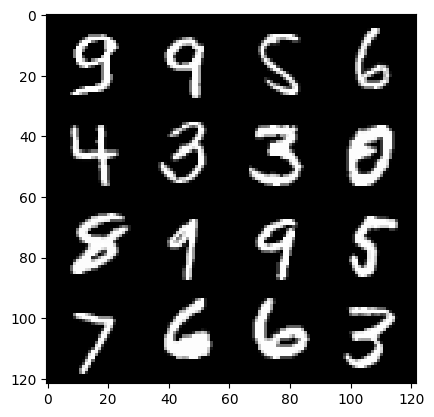

97: step 45600 / Gen loss: 86.69981997172033 / disc_loss:6.053595837570331e-11


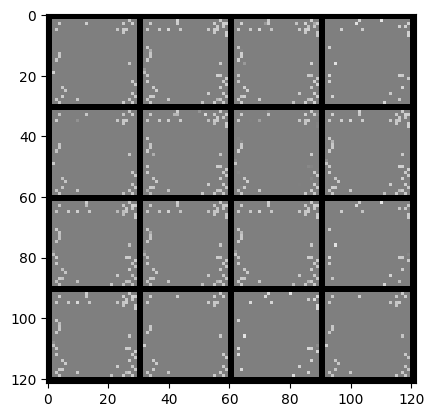

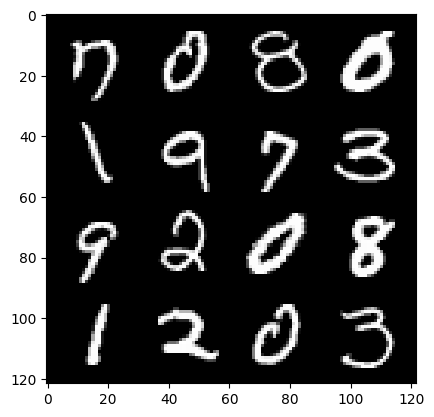

97: step 45900 / Gen loss: 86.79418225606278 / disc_loss:4.501391611307544e-11


  0%|          | 0/469 [00:00<?, ?it/s]

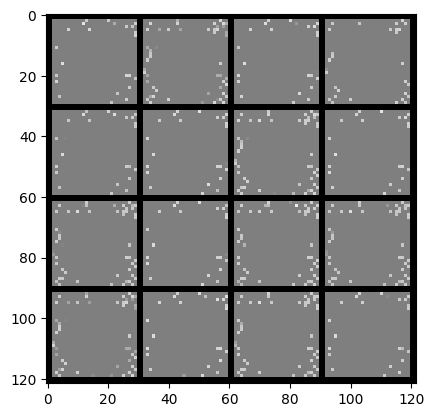

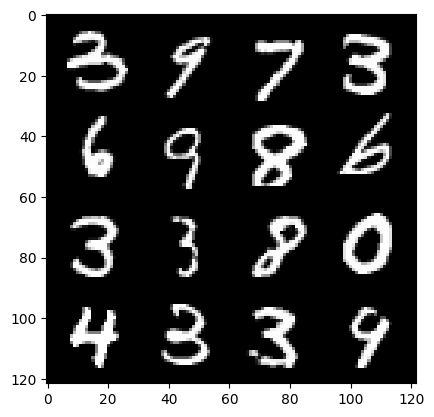

98: step 46200 / Gen loss: 86.86335774739591 / disc_loss:2.6387470171881002e-11


  0%|          | 0/469 [00:00<?, ?it/s]

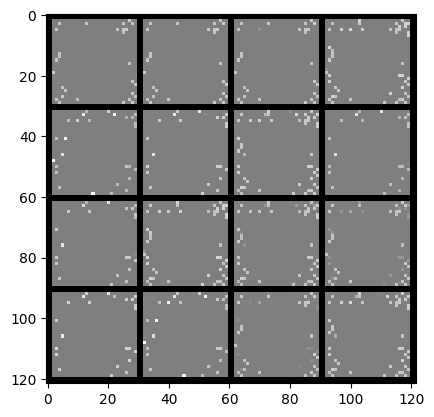

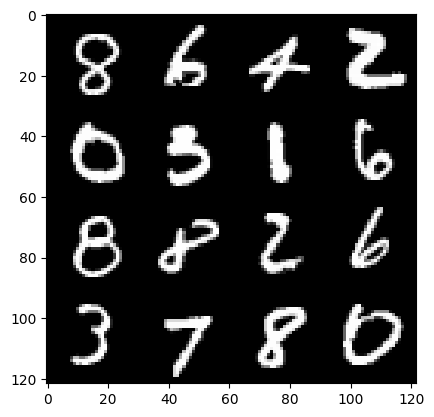

99: step 46500 / Gen loss: 86.94362541198731 / disc_loss:4.811832339986685e-11


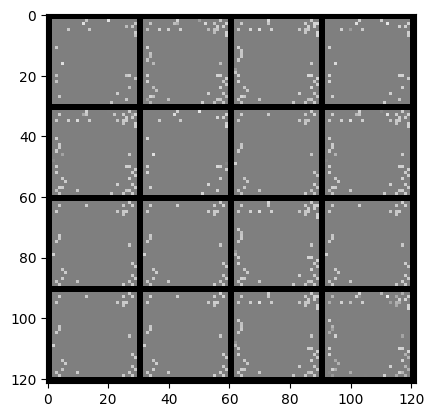

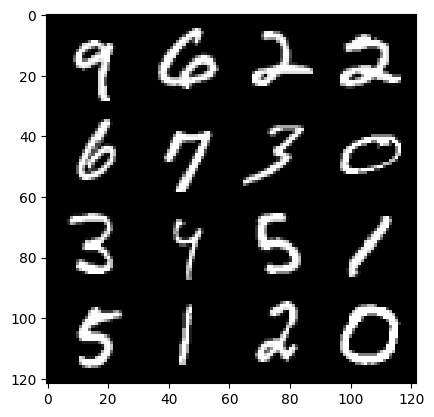

99: step 46800 / Gen loss: 87.02791455586747 / disc_loss:4.967052806096698e-11


  0%|          | 0/469 [00:00<?, ?it/s]

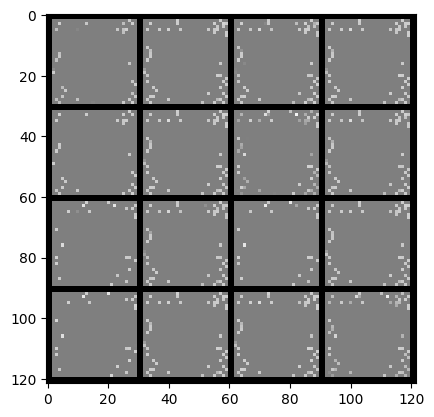

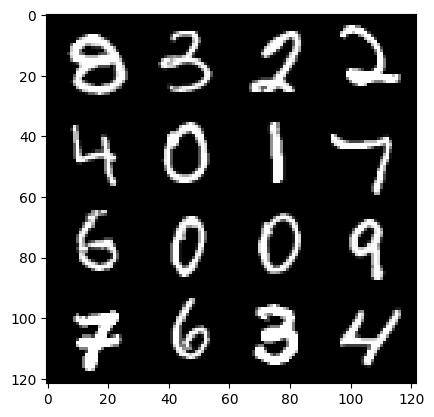

100: step 47100 / Gen loss: 87.12219543457037 / disc_loss:5.5879345502625935e-11


  0%|          | 0/469 [00:00<?, ?it/s]

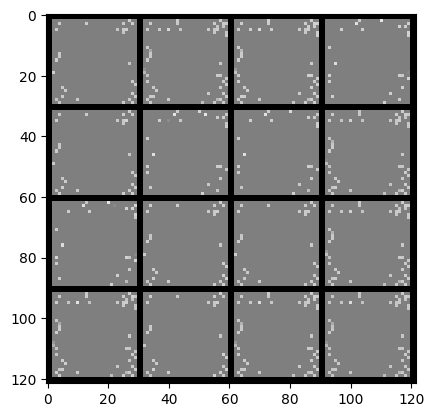

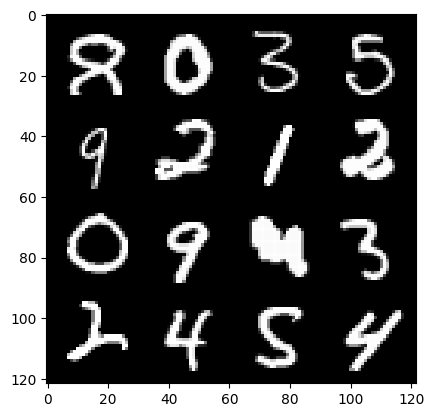

101: step 47400 / Gen loss: 87.20421536763514 / disc_loss:2.6387469524250905e-11


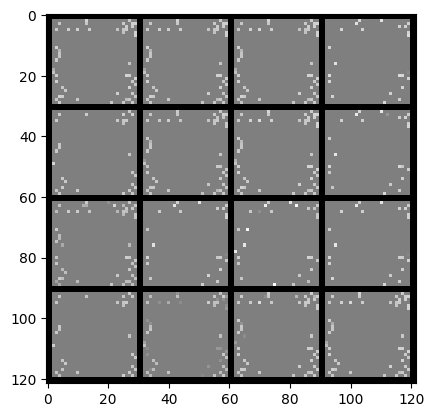

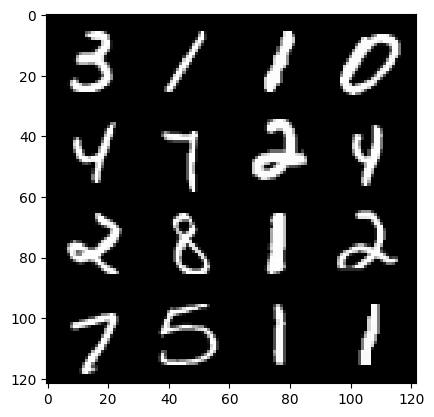

101: step 47700 / Gen loss: 87.27338302612304 / disc_loss:4.346171108190097e-11


  0%|          | 0/469 [00:00<?, ?it/s]

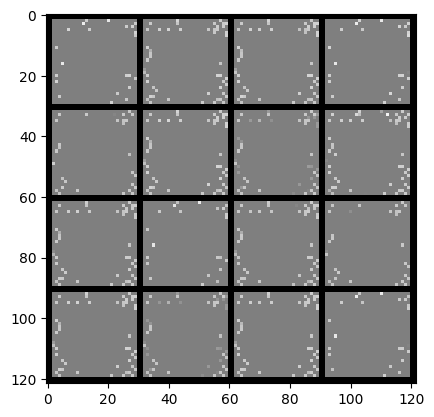

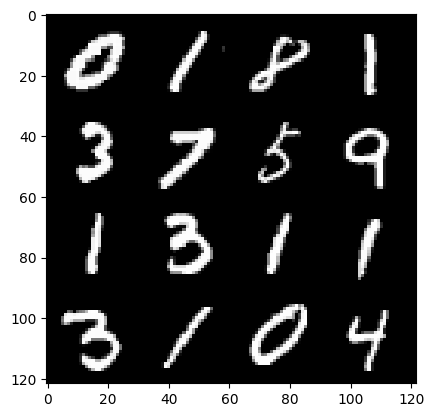

102: step 48000 / Gen loss: 87.3494228617351 / disc_loss:2.9491875145707764e-11


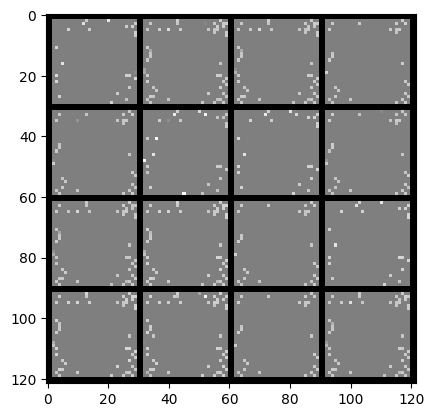

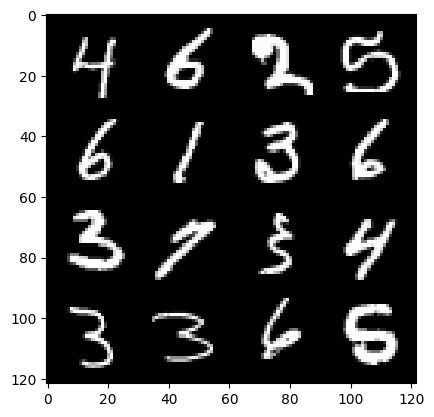

102: step 48300 / Gen loss: 87.43337155659994 / disc_loss:3.88051024646785e-11


  0%|          | 0/469 [00:00<?, ?it/s]

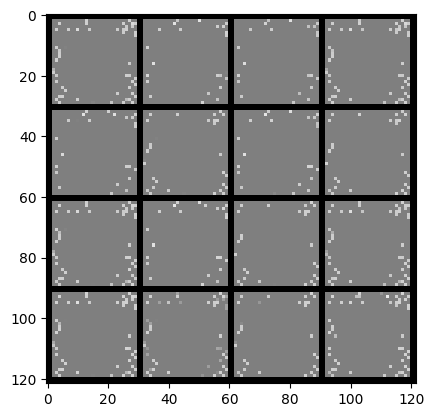

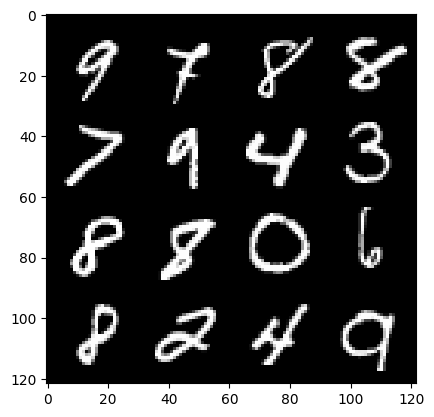

103: step 48600 / Gen loss: 87.50936749776197 / disc_loss:5.122273235199279e-11


  0%|          | 0/469 [00:00<?, ?it/s]

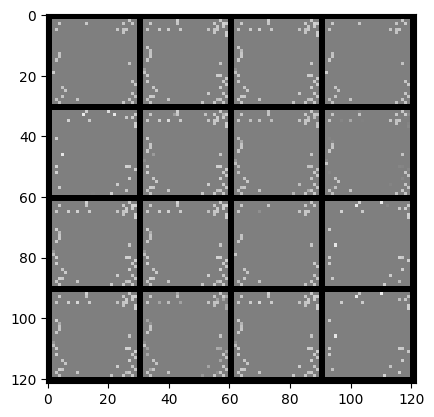

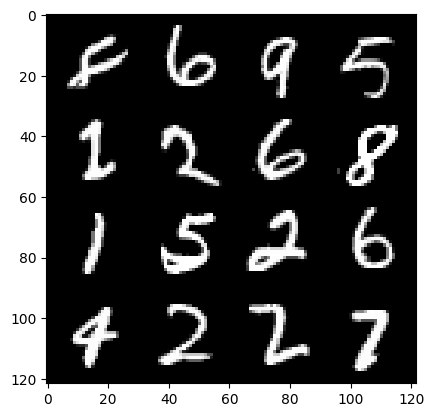

104: step 48900 / Gen loss: 87.58280006408687 / disc_loss:2.7939673630239534e-11


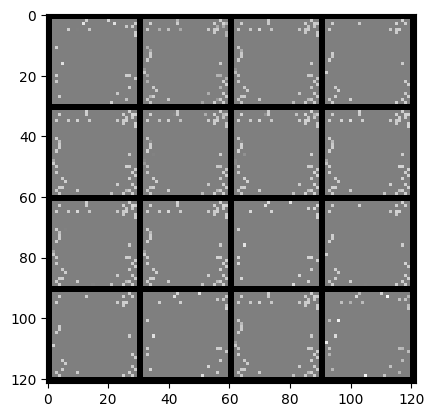

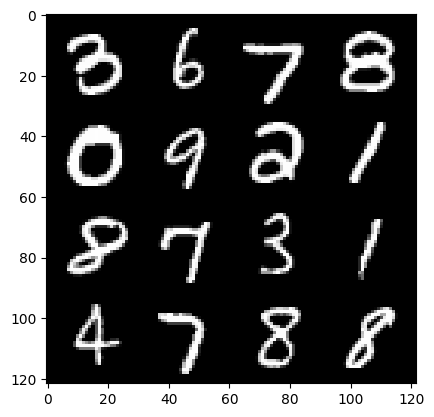

104: step 49200 / Gen loss: 87.64789459228507 / disc_loss:2.1730857946433706e-11


  0%|          | 0/469 [00:00<?, ?it/s]

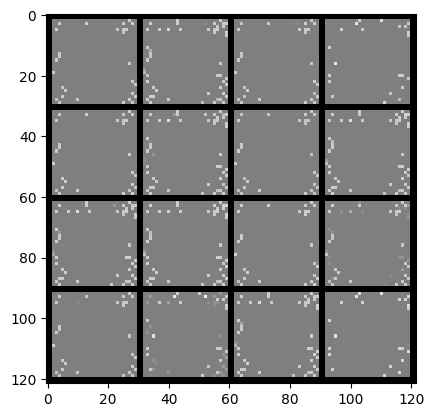

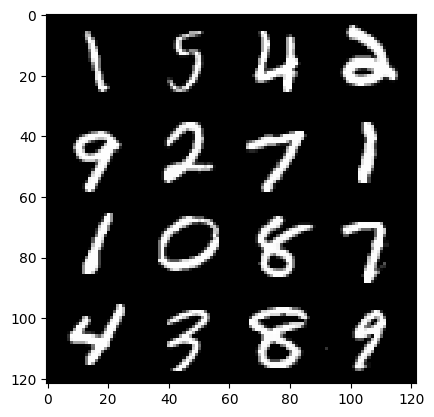

105: step 49500 / Gen loss: 87.72194864908855 / disc_loss:4.811832404749695e-11


  0%|          | 0/469 [00:00<?, ?it/s]

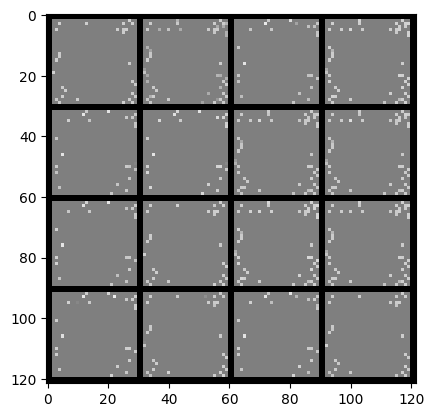

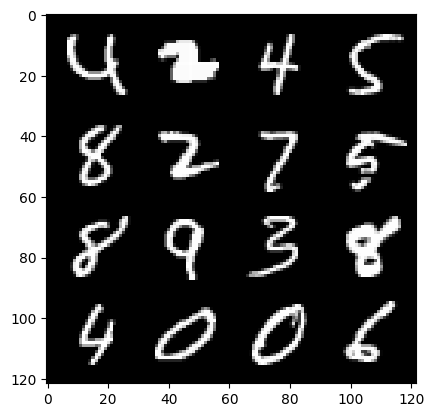

106: step 49800 / Gen loss: 87.7957003529866 / disc_loss:2.1730857483840777e-11


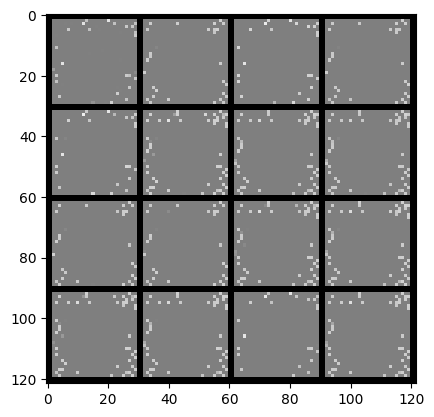

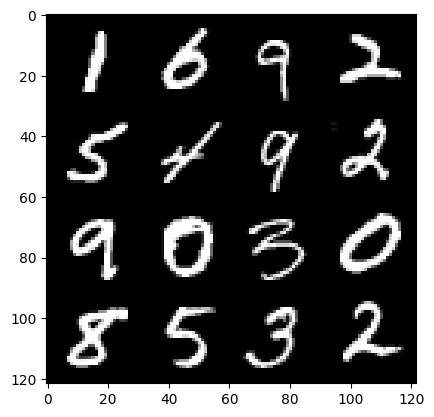

106: step 50100 / Gen loss: 87.85494712829588 / disc_loss:4.346171274723551e-11


  0%|          | 0/469 [00:00<?, ?it/s]

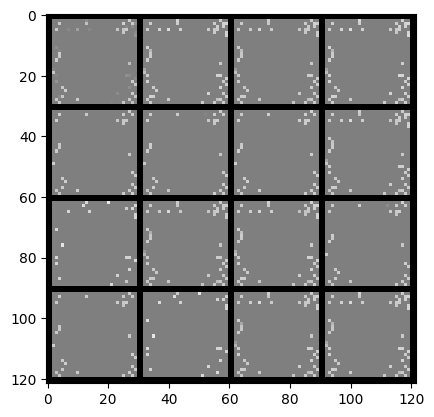

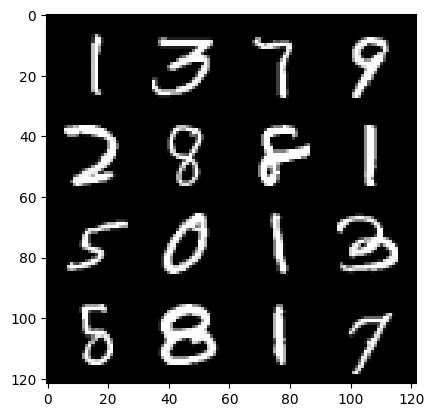

107: step 50400 / Gen loss: 87.92757438659669 / disc_loss:2.793967279757226e-11


  0%|          | 0/469 [00:00<?, ?it/s]

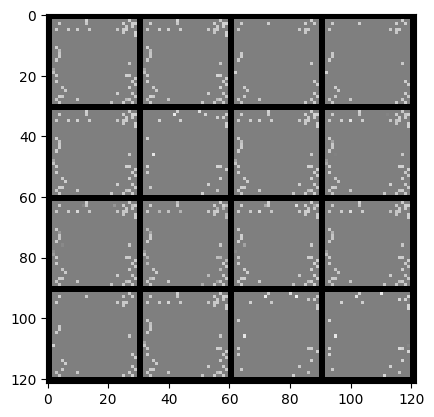

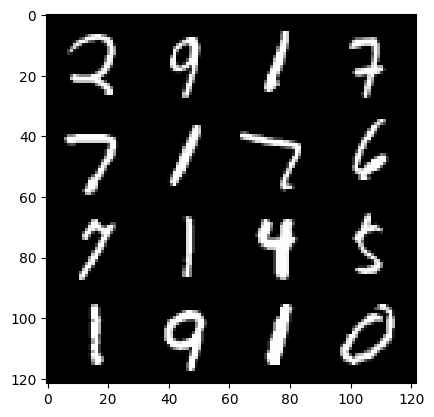

108: step 50700 / Gen loss: 87.99091087341306 / disc_loss:3.5700694900331345e-11


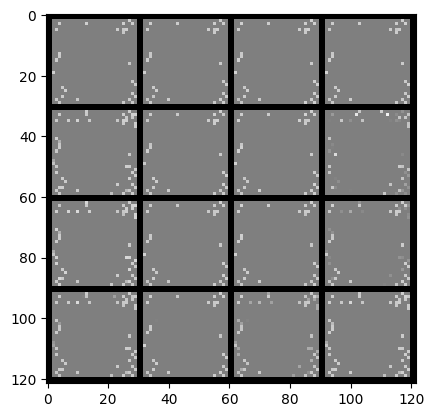

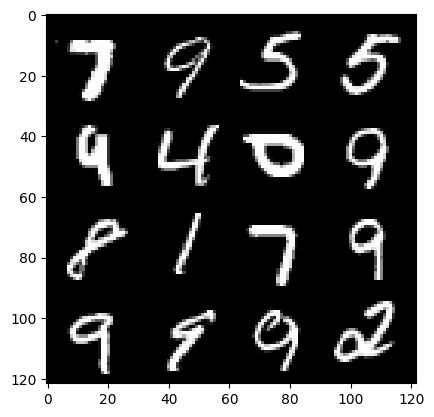

108: step 51000 / Gen loss: 88.06490158081051 / disc_loss:3.7252896878392507e-11


  0%|          | 0/469 [00:00<?, ?it/s]

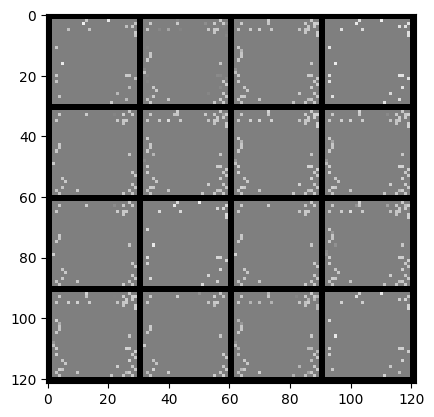

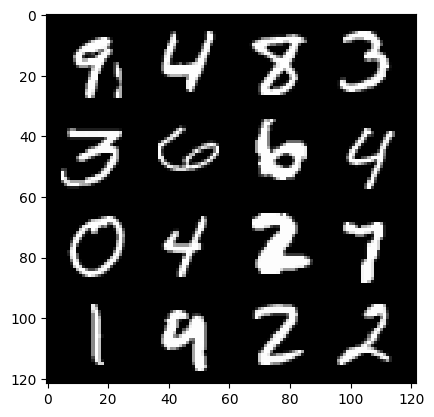

109: step 51300 / Gen loss: 88.13111478169768 / disc_loss:3.4148488851452424e-11


  0%|          | 0/469 [00:00<?, ?it/s]

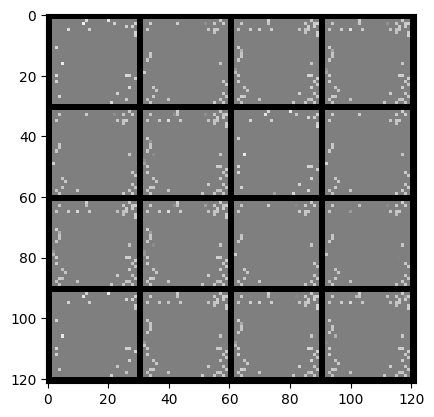

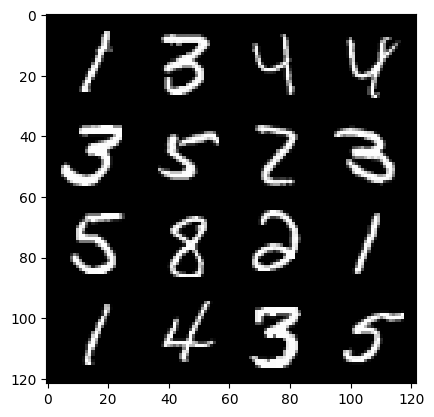

110: step 51600 / Gen loss: 88.19874532063803 / disc_loss:3.259628641079834e-11


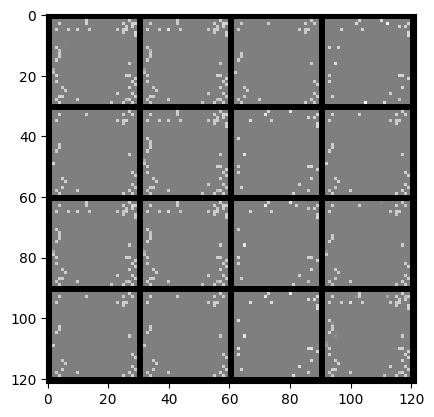

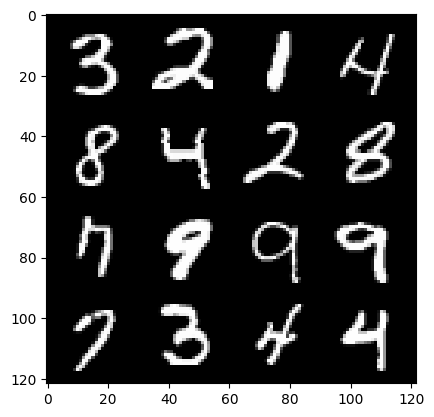

110: step 51900 / Gen loss: 88.26513587951659 / disc_loss:3.2596284837982386e-11


  0%|          | 0/469 [00:00<?, ?it/s]

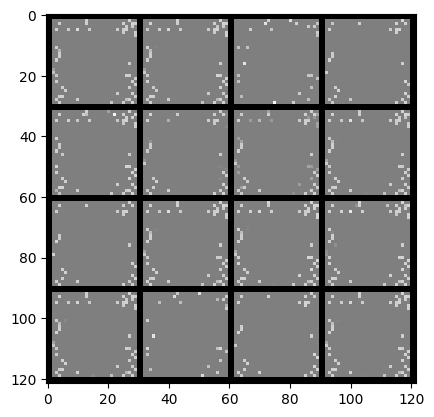

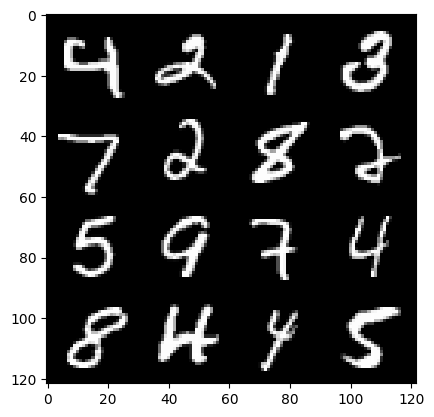

111: step 52200 / Gen loss: 88.33068791707355 / disc_loss:3.2596284930500973e-11


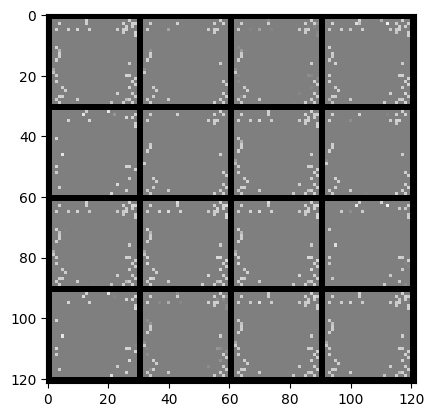

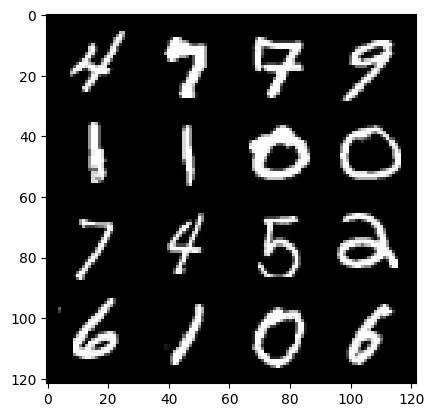

111: step 52500 / Gen loss: 88.39358441670728 / disc_loss:2.638747026439959e-11


  0%|          | 0/469 [00:00<?, ?it/s]

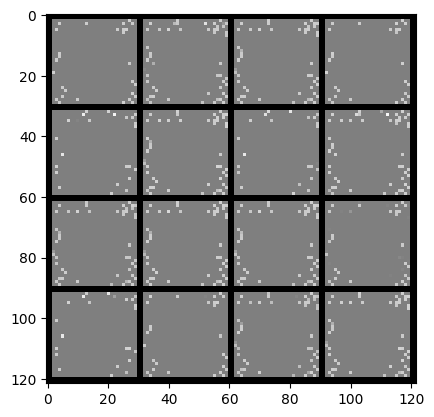

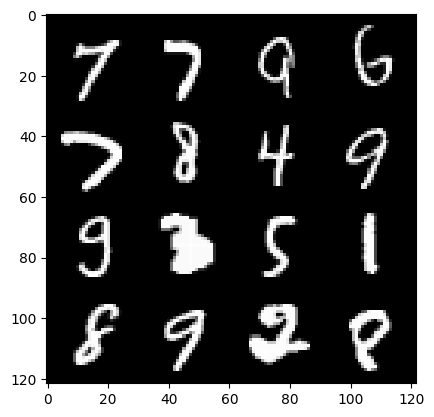

112: step 52800 / Gen loss: 88.46171066284184 / disc_loss:3.725289706342969e-11


  0%|          | 0/469 [00:00<?, ?it/s]

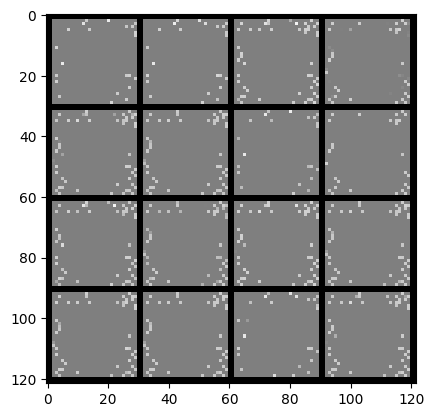

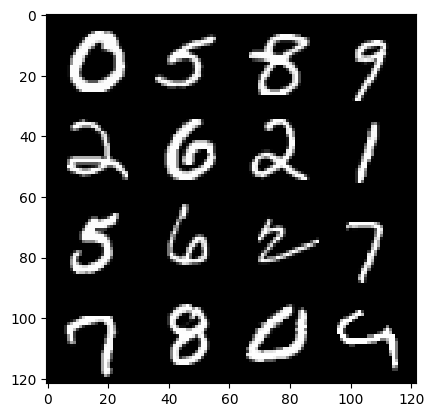

113: step 53100 / Gen loss: 88.51538887023918 / disc_loss:3.5700692587366706e-11


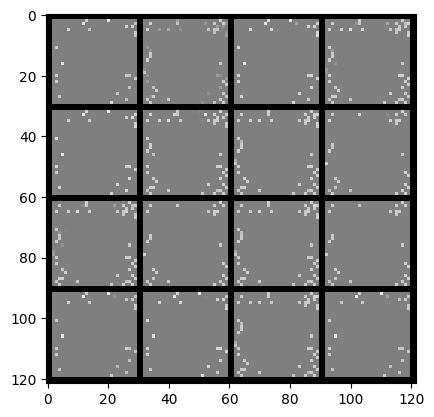

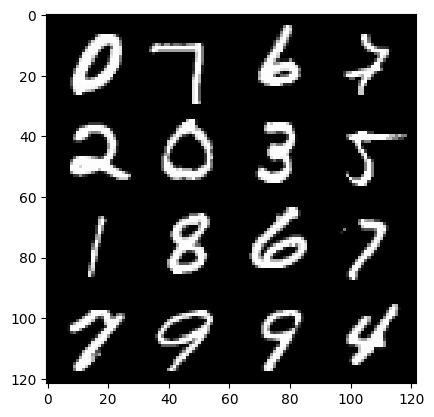

113: step 53400 / Gen loss: 88.57795532226561 / disc_loss:2.483526634344813e-11


  0%|          | 0/469 [00:00<?, ?it/s]

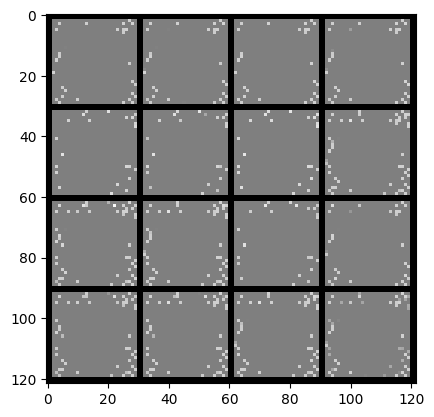

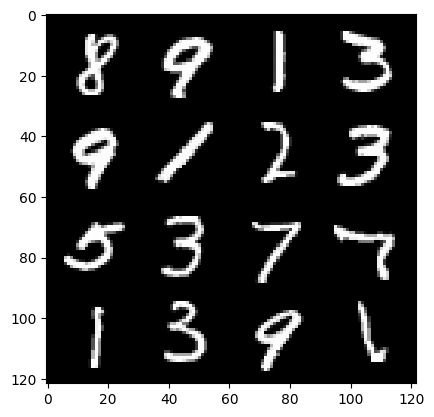

114: step 53700 / Gen loss: 88.63913597106934 / disc_loss:3.10440817496982e-11


  0%|          | 0/469 [00:00<?, ?it/s]

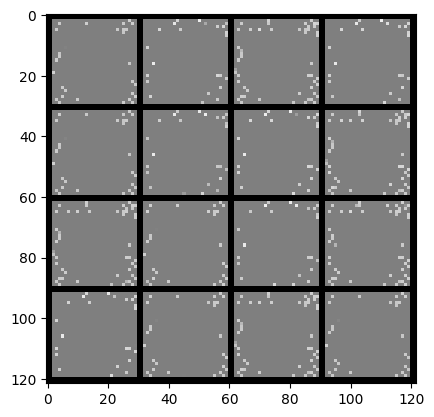

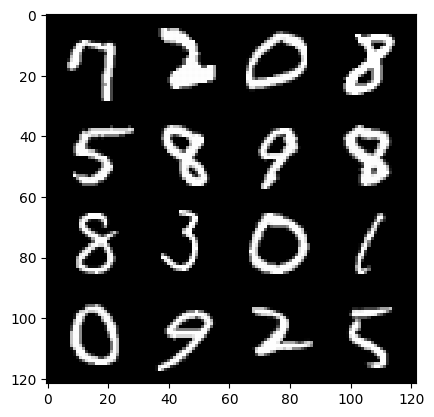

115: step 54000 / Gen loss: 88.69547754923506 / disc_loss:2.6387470171881002e-11


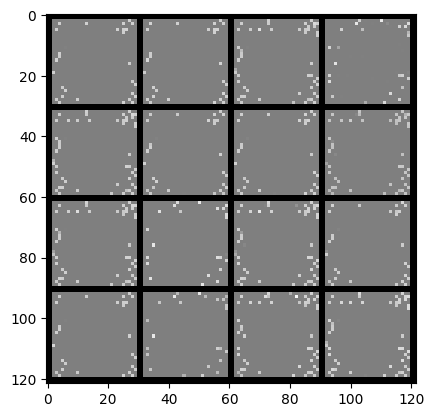

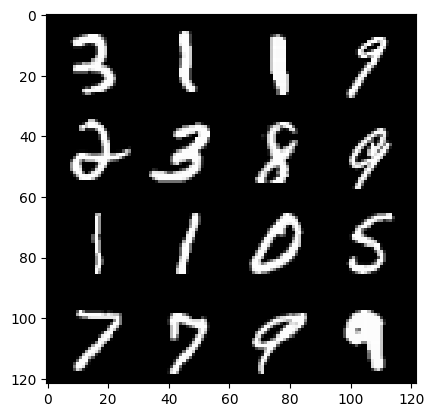

115: step 54300 / Gen loss: 88.75089836120605 / disc_loss:3.4148489314045356e-11


  0%|          | 0/469 [00:00<?, ?it/s]

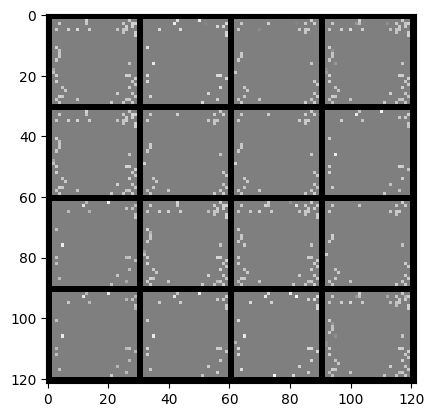

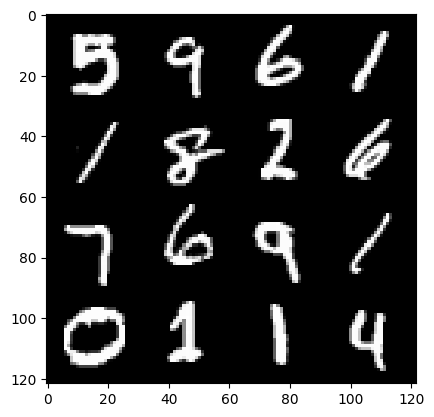

116: step 54600 / Gen loss: 88.81360829671226 / disc_loss:2.9491878661414004e-11


  0%|          | 0/469 [00:00<?, ?it/s]

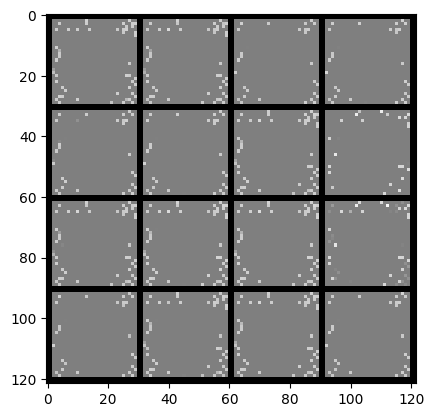

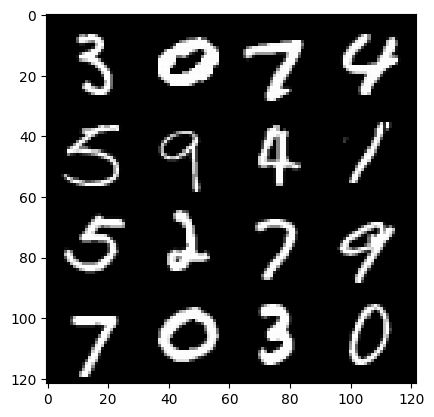

117: step 54900 / Gen loss: 88.86947026570641 / disc_loss:2.328306084968072e-11


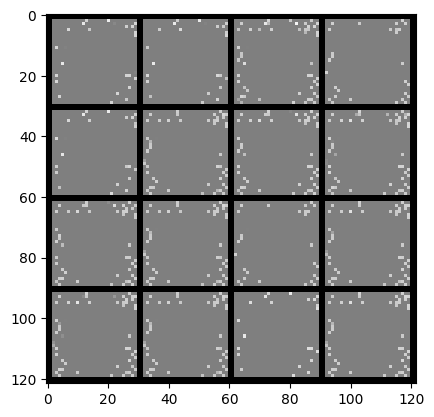

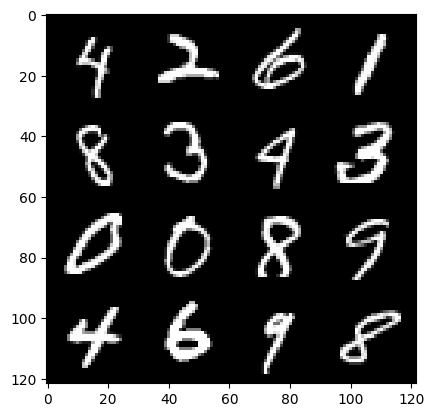

117: step 55200 / Gen loss: 88.92835370381667 / disc_loss:3.2596285855686824e-11


  0%|          | 0/469 [00:00<?, ?it/s]

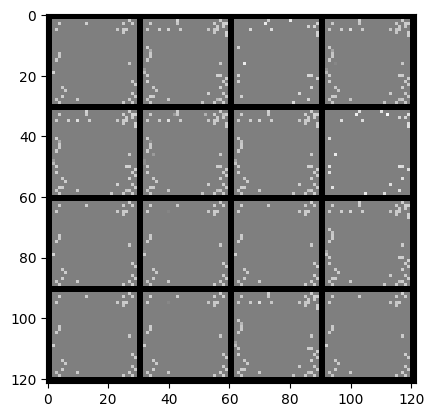

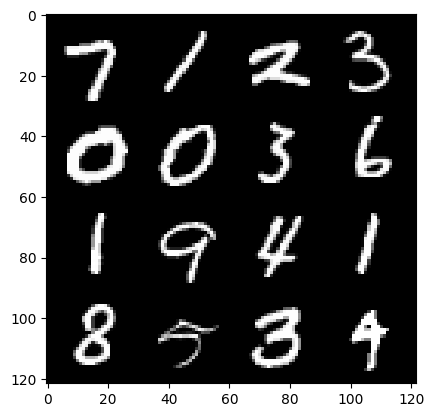

118: step 55500 / Gen loss: 88.9850407663981 / disc_loss:2.1730857761396534e-11


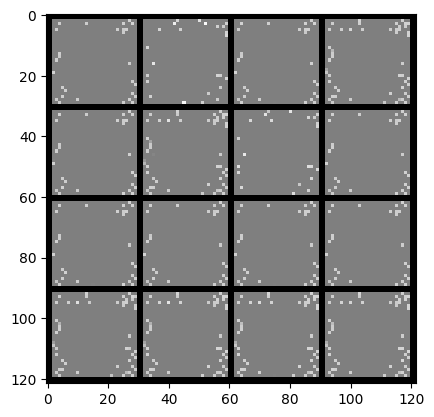

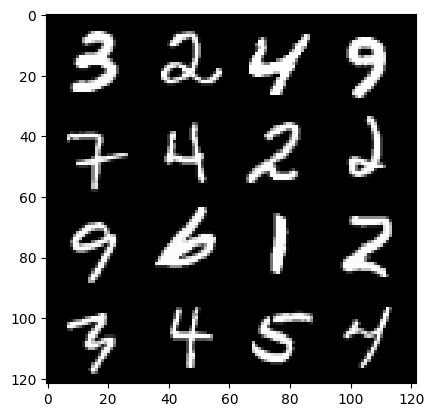

118: step 55800 / Gen loss: 89.04167549133307 / disc_loss:2.94918774586724e-11


  0%|          | 0/469 [00:00<?, ?it/s]

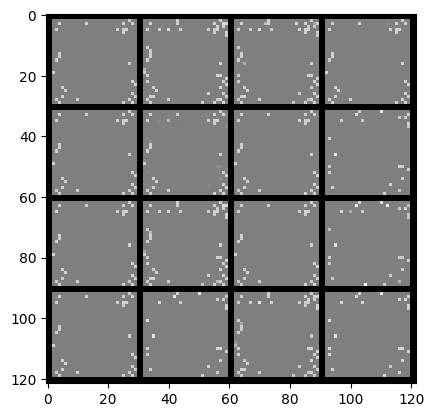

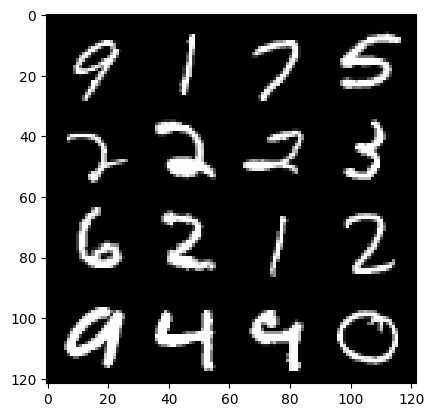

119: step 56100 / Gen loss: 89.09966964721677 / disc_loss:3.880510163201124e-11


  0%|          | 0/469 [00:00<?, ?it/s]

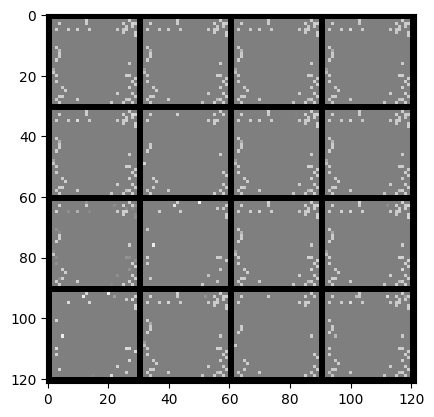

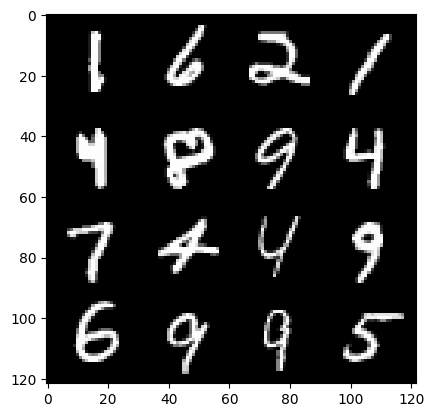

120: step 56400 / Gen loss: 89.15148310343423 / disc_loss:1.3969837416490567e-11


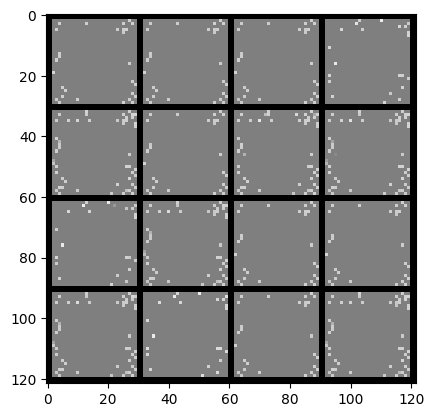

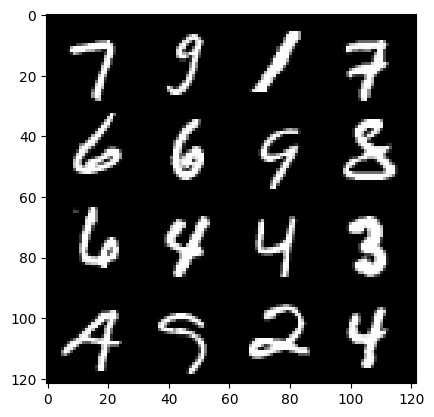

120: step 56700 / Gen loss: 89.19369283040369 / disc_loss:3.414848959160111e-11


  0%|          | 0/469 [00:00<?, ?it/s]

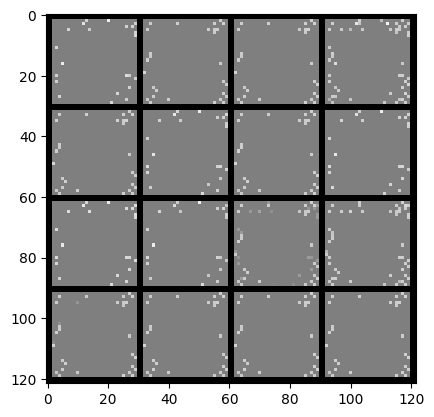

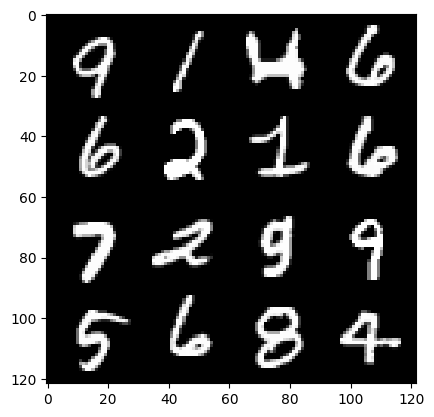

121: step 57000 / Gen loss: 89.26628476460779 / disc_loss:3.466589099110351e-11


  0%|          | 0/469 [00:00<?, ?it/s]

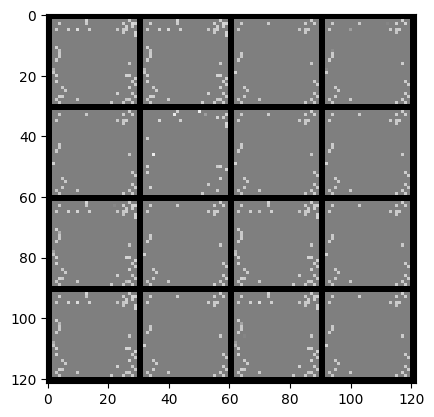

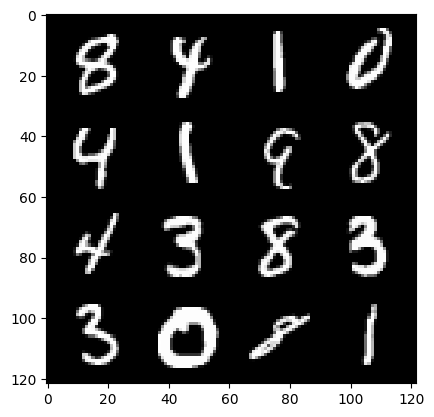

122: step 57300 / Gen loss: 89.30999506632494 / disc_loss:1.3969837601527738e-11


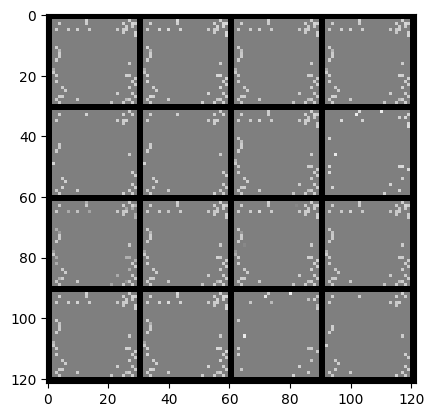

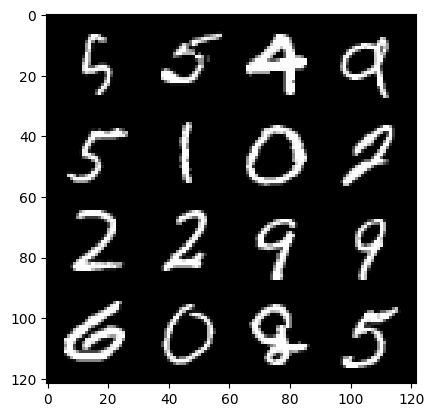

122: step 57600 / Gen loss: 89.35343536376959 / disc_loss:3.25962853930939e-11


  0%|          | 0/469 [00:00<?, ?it/s]

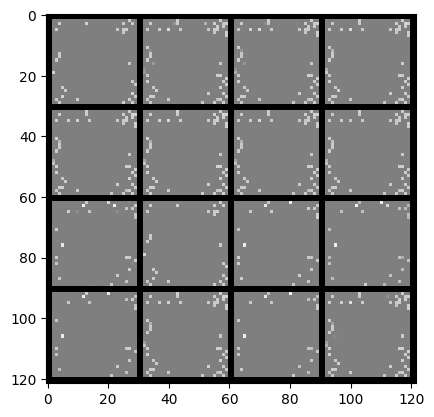

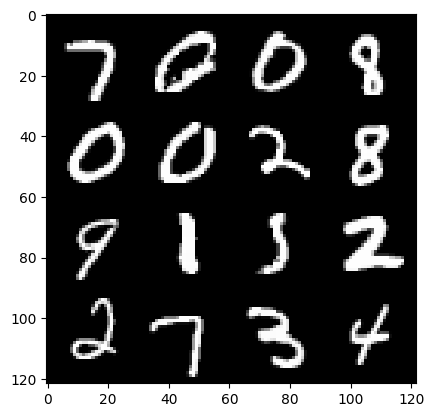

123: step 57900 / Gen loss: 89.41847417195635 / disc_loss:3.1044081379623854e-11


  0%|          | 0/469 [00:00<?, ?it/s]

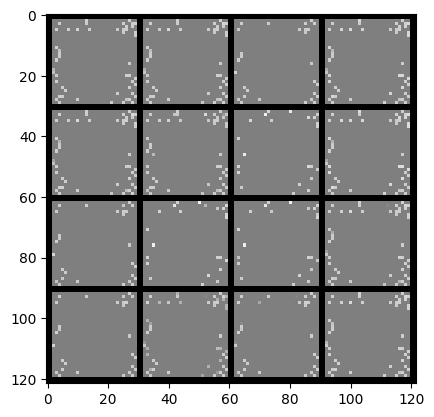

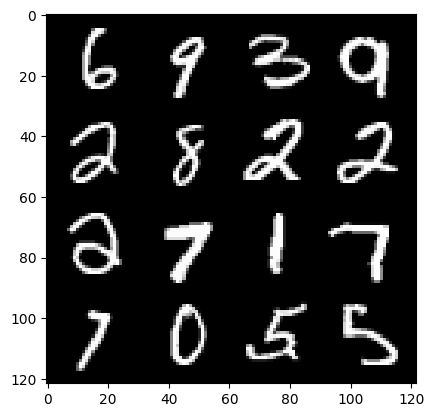

124: step 58200 / Gen loss: 89.46458597819012 / disc_loss:2.1730858223989462e-11


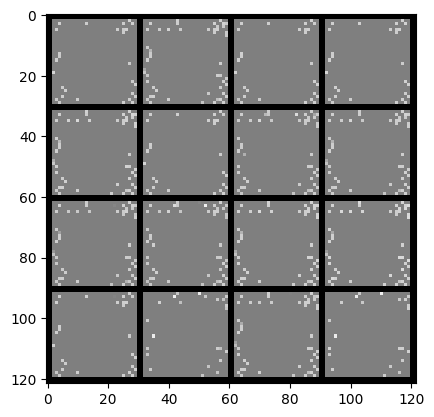

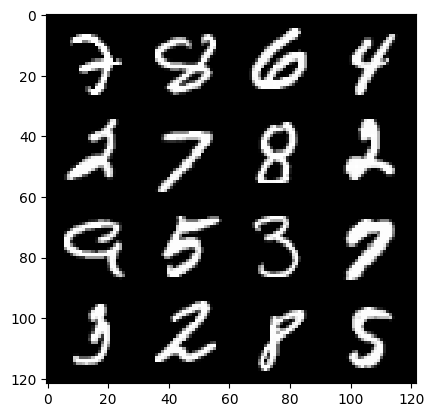

124: step 58500 / Gen loss: 89.51492413838706 / disc_loss:2.4835265048187938e-11


  0%|          | 0/469 [00:00<?, ?it/s]

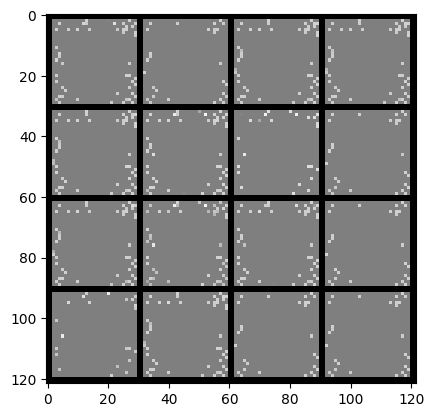

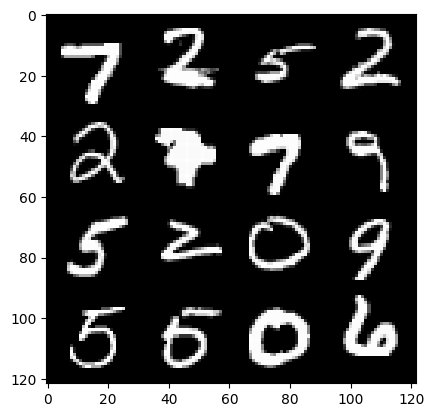

125: step 58800 / Gen loss: 89.56436551411949 / disc_loss:2.483526597337379e-11


  0%|          | 0/469 [00:00<?, ?it/s]

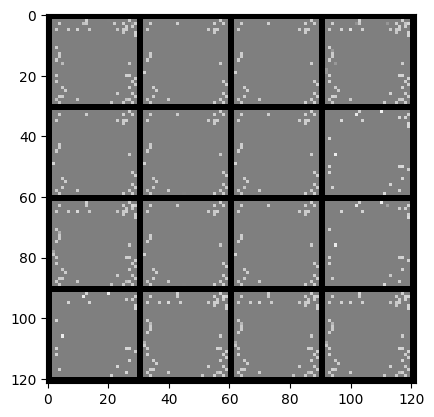

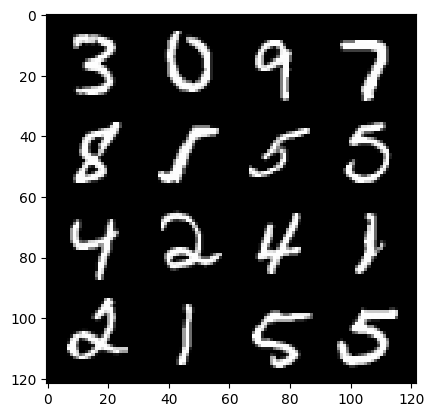

126: step 59100 / Gen loss: 89.62226954142254 / disc_loss:2.9491877366153816e-11


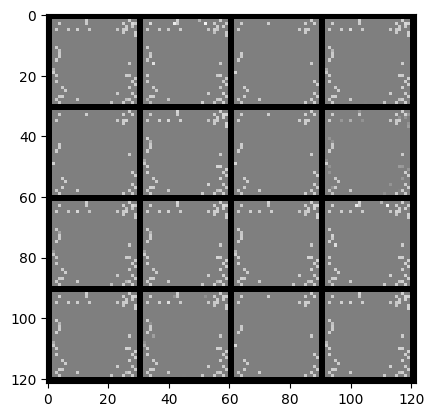

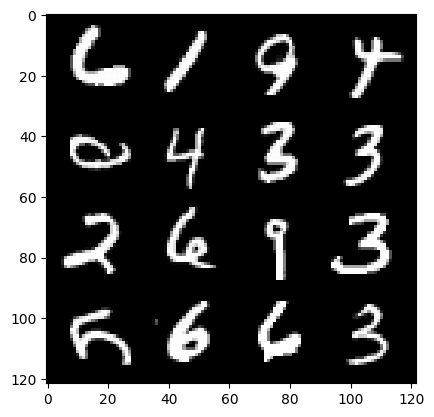

126: step 59400 / Gen loss: 89.65933471679692 / disc_loss:2.0178653932963658e-11


  0%|          | 0/469 [00:00<?, ?it/s]

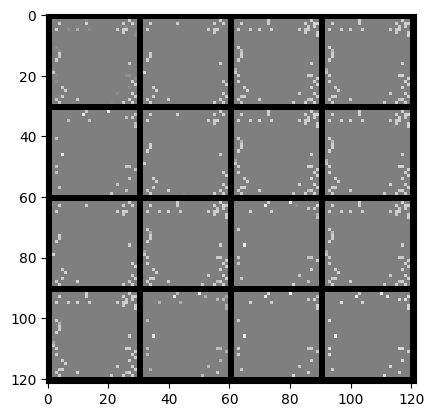

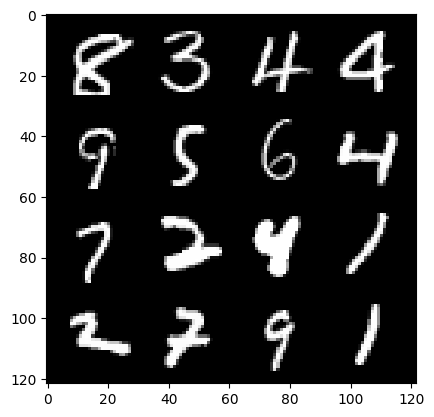

127: step 59700 / Gen loss: 89.7159078216553 / disc_loss:4.190950864124687e-11


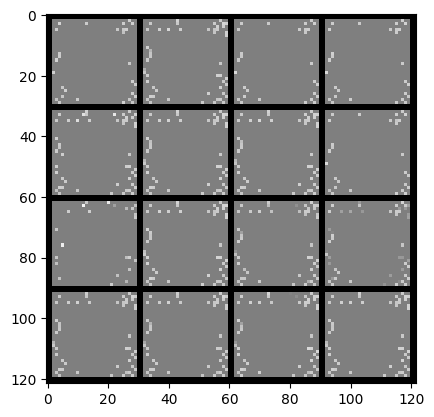

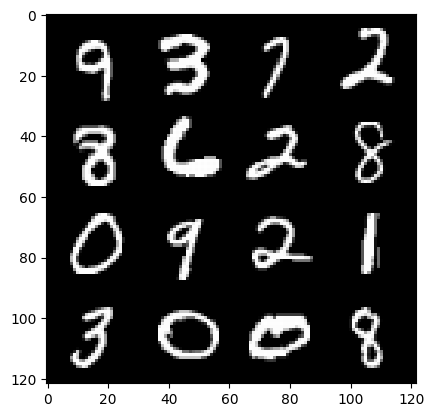

127: step 60000 / Gen loss: 89.76858136494953 / disc_loss:1.0865429389550484e-11


  0%|          | 0/469 [00:00<?, ?it/s]

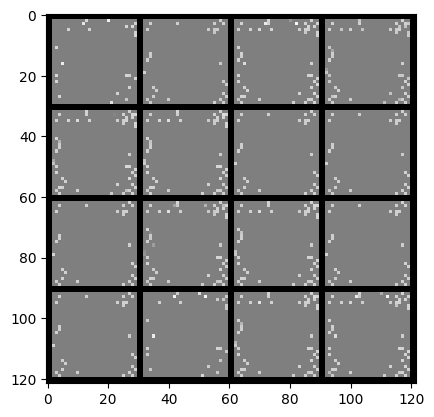

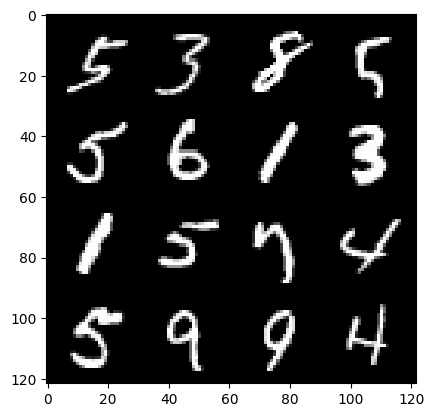

128: step 60300 / Gen loss: 89.81519566853841 / disc_loss:2.6387469709288077e-11


  0%|          | 0/469 [00:00<?, ?it/s]

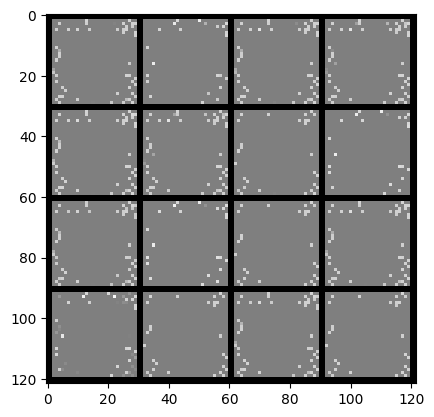

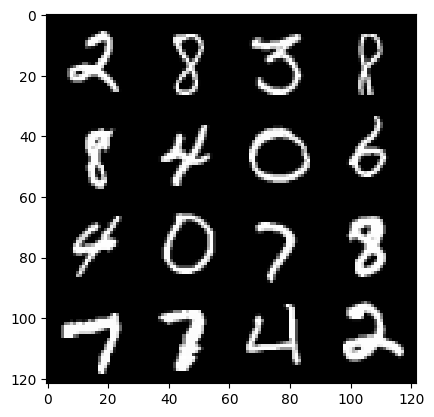

129: step 60600 / Gen loss: 89.86085561116543 / disc_loss:2.6387470079362415e-11


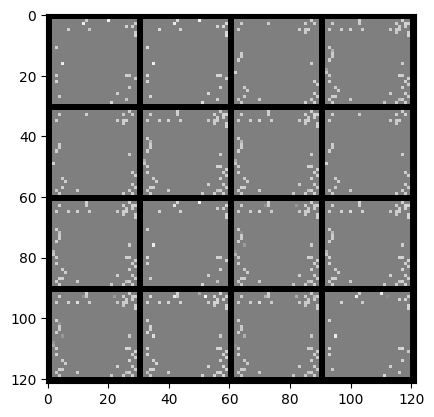

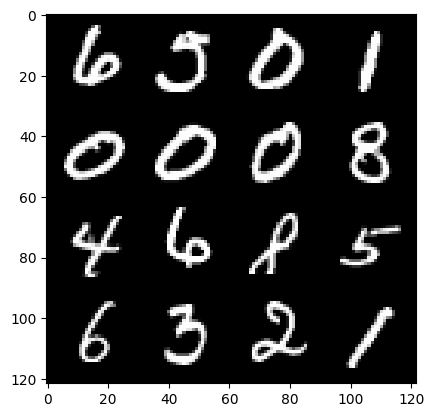

129: step 60900 / Gen loss: 89.91311869303388 / disc_loss:2.017865402548225e-11


  0%|          | 0/469 [00:00<?, ?it/s]

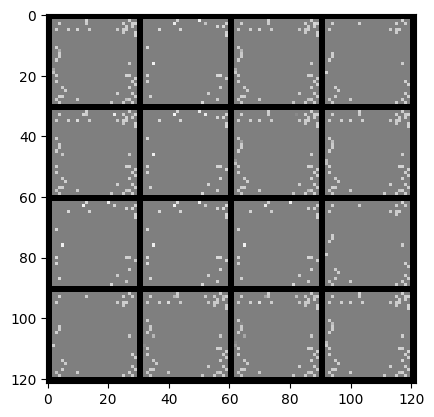

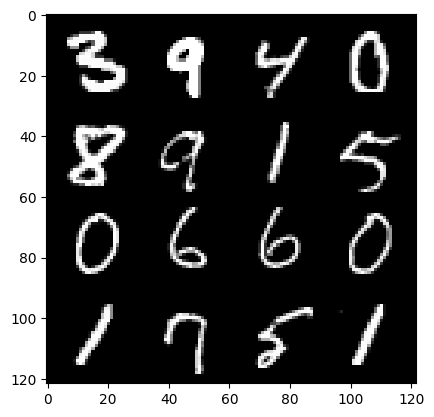

130: step 61200 / Gen loss: 89.94964897155754 / disc_loss:1.3969837601527738e-11


  0%|          | 0/469 [00:00<?, ?it/s]

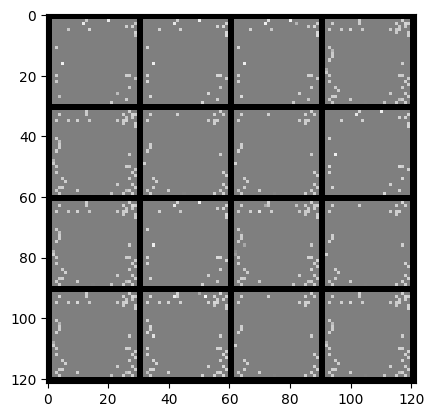

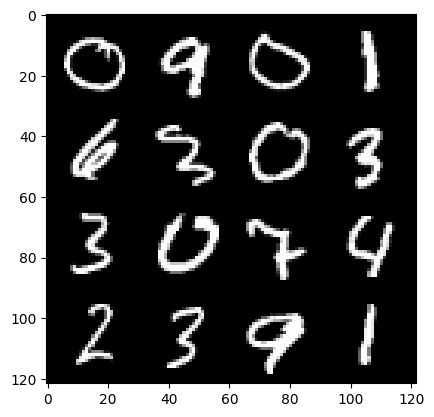

131: step 61500 / Gen loss: 90.00042465209967 / disc_loss:3.25962853930939e-11


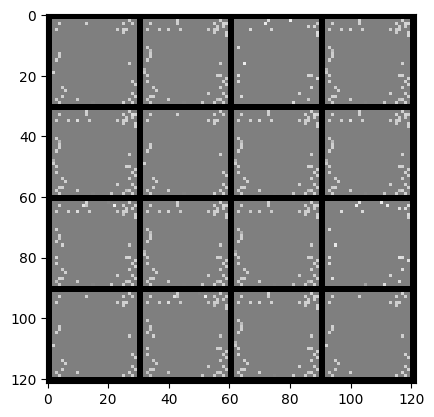

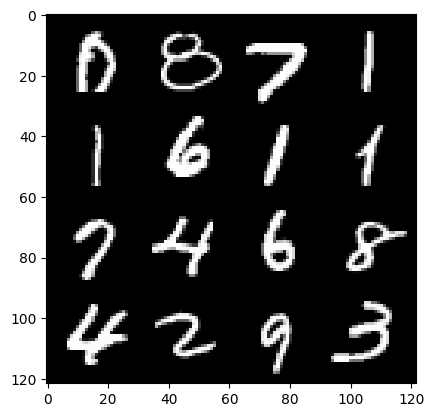

131: step 61800 / Gen loss: 90.04755249023435 / disc_loss:1.552204161499778e-11


  0%|          | 0/469 [00:00<?, ?it/s]

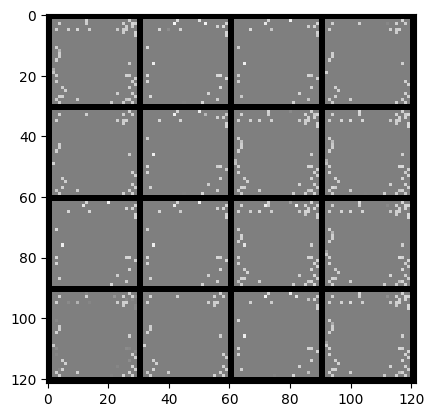

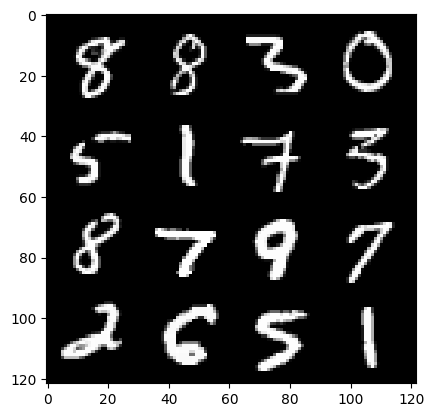

132: step 62100 / Gen loss: 90.09425209045402 / disc_loss:2.1730857483840777e-11


  0%|          | 0/469 [00:00<?, ?it/s]

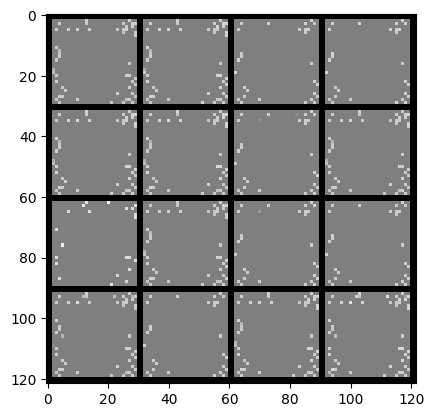

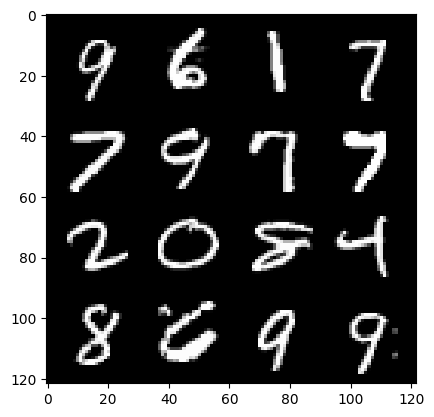

133: step 62400 / Gen loss: 90.13293886820479 / disc_loss:1.7074245813504994e-11


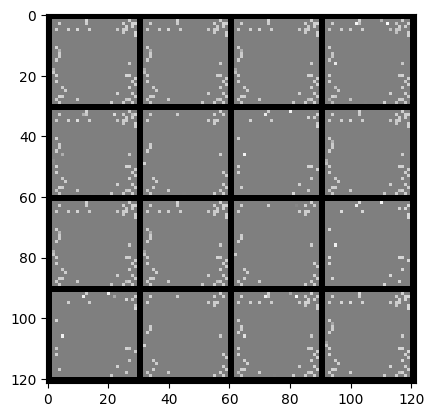

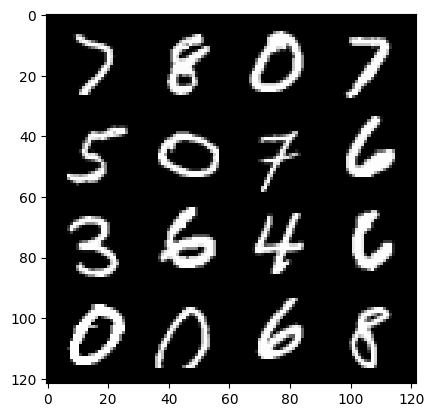

133: step 62700 / Gen loss: 90.18201047261554 / disc_loss:2.328306251501526e-11


  0%|          | 0/469 [00:00<?, ?it/s]

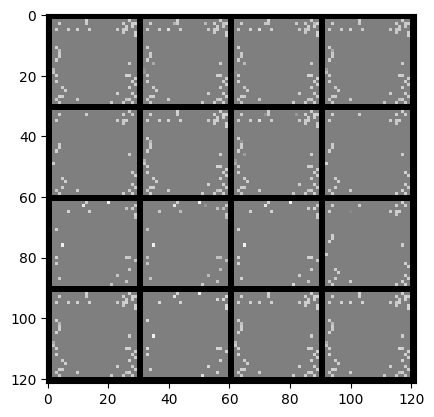

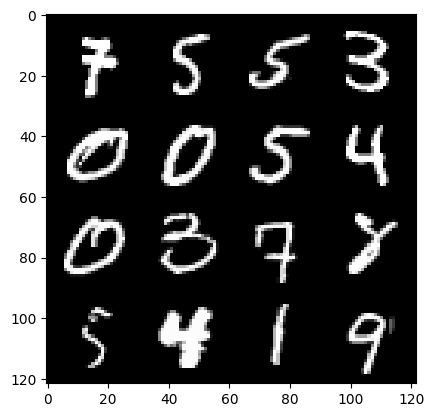

134: step 63000 / Gen loss: 90.22872220357263 / disc_loss:2.638746896913939e-11


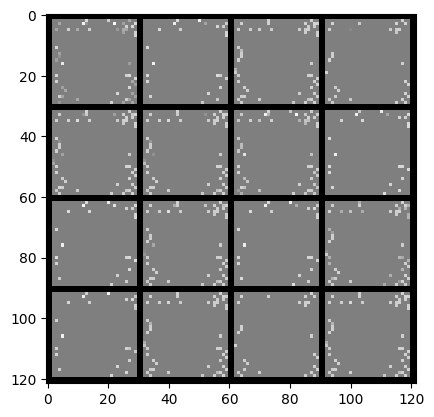

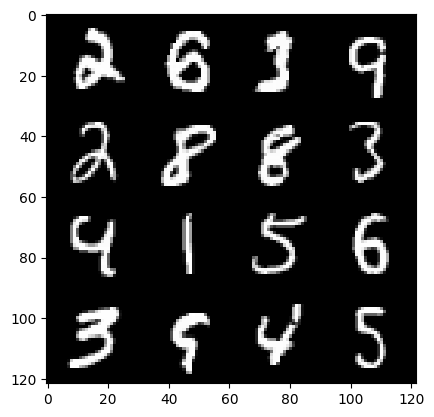

134: step 63300 / Gen loss: 90.27085894266767 / disc_loss:1.552204161499778e-11


  0%|          | 0/469 [00:00<?, ?it/s]

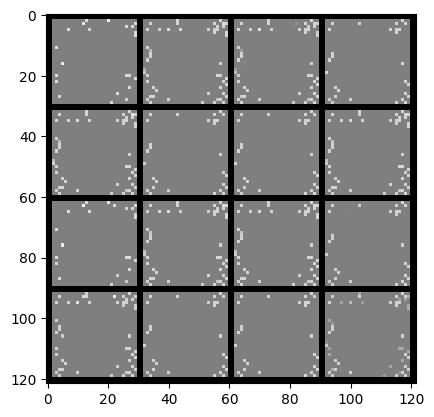

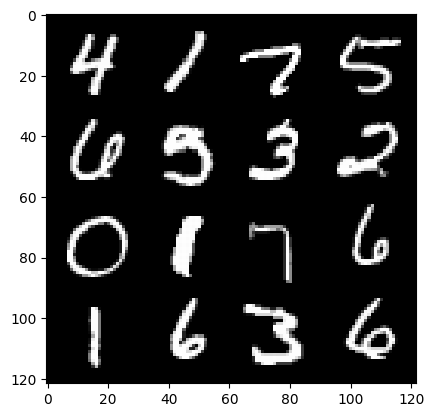

135: step 63600 / Gen loss: 90.31107032775876 / disc_loss:2.1730857298803605e-11


  0%|          | 0/469 [00:00<?, ?it/s]

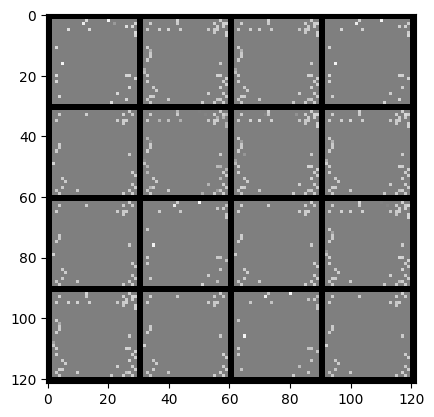

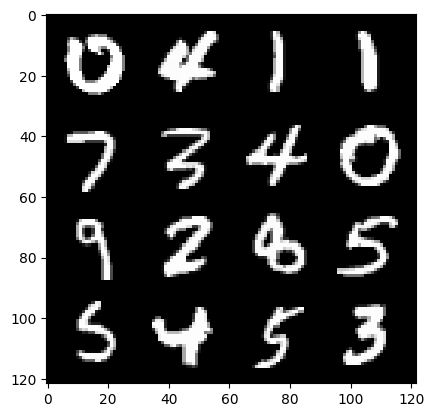

136: step 63900 / Gen loss: 90.3561710103353 / disc_loss:2.0178654210519418e-11


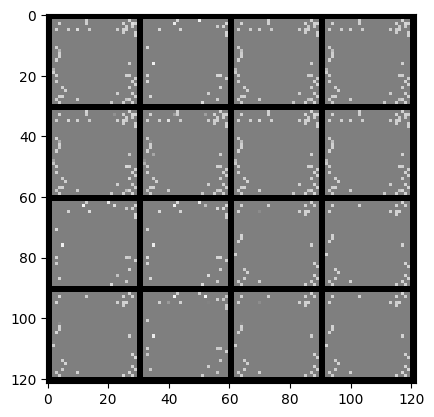

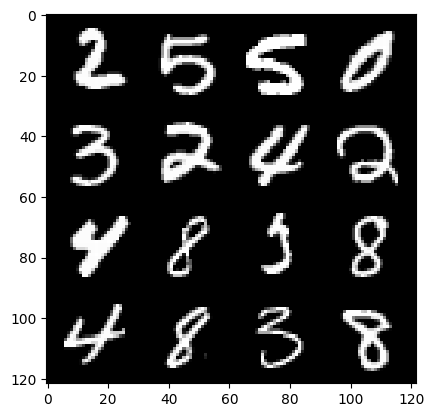

136: step 64200 / Gen loss: 90.39856892903651 / disc_loss:1.862644908682635e-11


  0%|          | 0/469 [00:00<?, ?it/s]

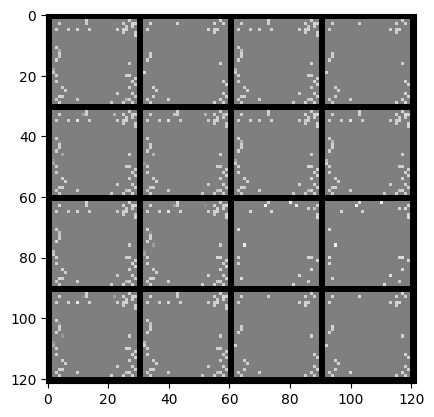

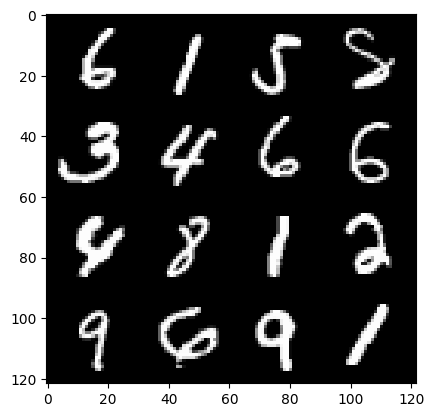

137: step 64500 / Gen loss: 90.43375195821127 / disc_loss:1.2417633403020526e-11


  0%|          | 0/469 [00:00<?, ?it/s]

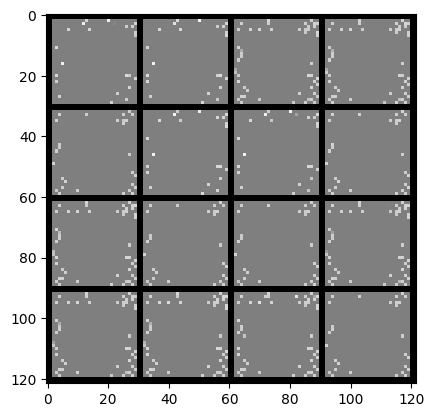

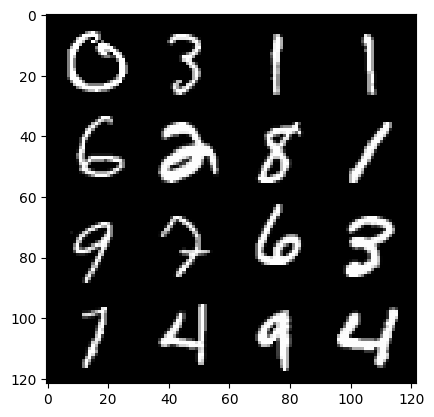

138: step 64800 / Gen loss: 90.4746373748779 / disc_loss:3.5700693790108325e-11


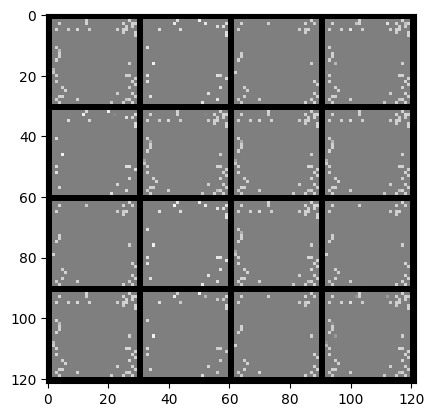

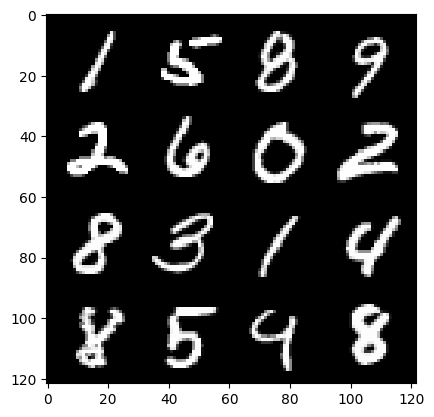

138: step 65100 / Gen loss: 90.52107961018875 / disc_loss:1.552204161499778e-11


  0%|          | 0/469 [00:00<?, ?it/s]

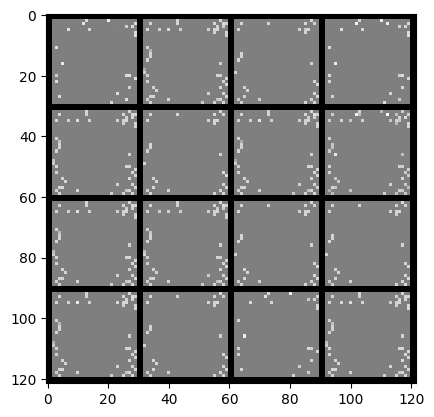

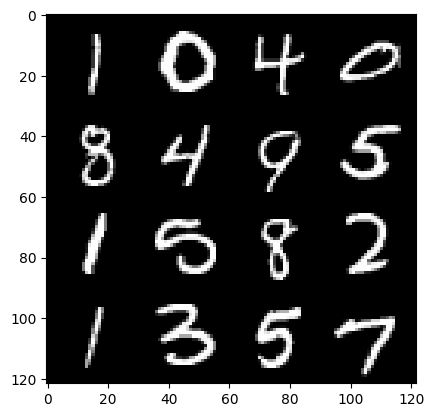

139: step 65400 / Gen loss: 90.56598421732592 / disc_loss:1.8626448901789182e-11


  0%|          | 0/469 [00:00<?, ?it/s]

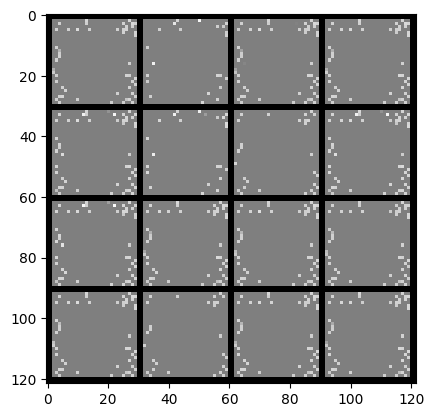

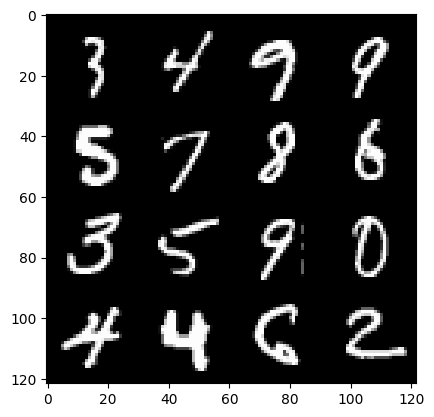

140: step 65700 / Gen loss: 90.60950846354176 / disc_loss:2.1730858409026634e-11


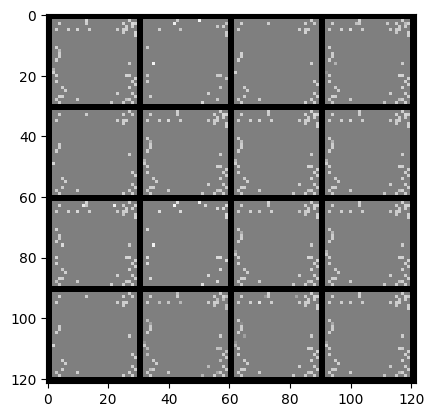

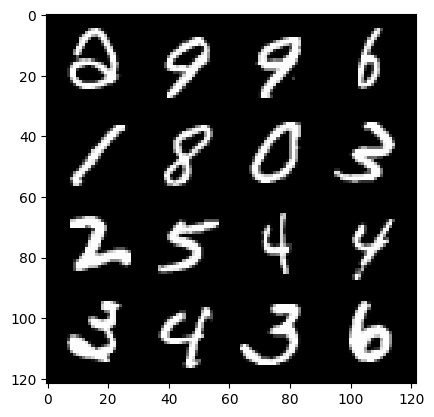

140: step 66000 / Gen loss: 90.64557080586746 / disc_loss:1.552204180003495e-11


  0%|          | 0/469 [00:00<?, ?it/s]

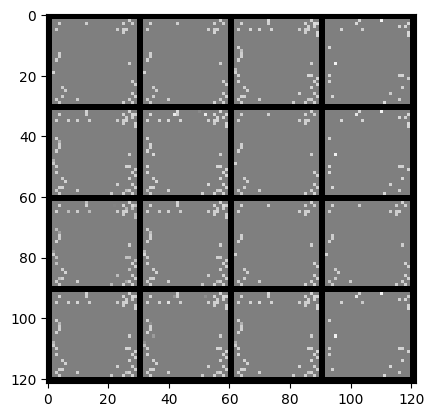

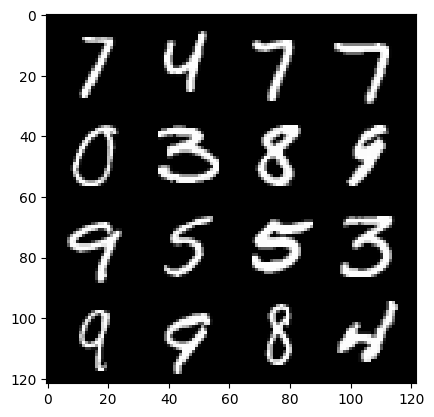

141: step 66300 / Gen loss: 90.68690411885588 / disc_loss:2.0178652915259223e-11


  0%|          | 0/469 [00:00<?, ?it/s]

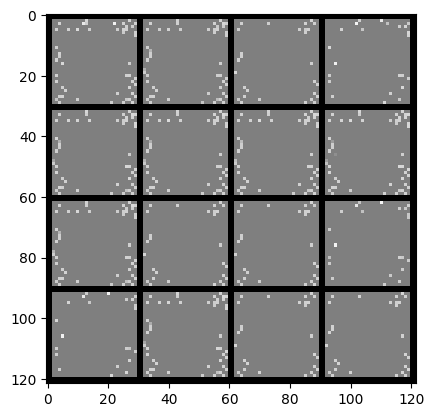

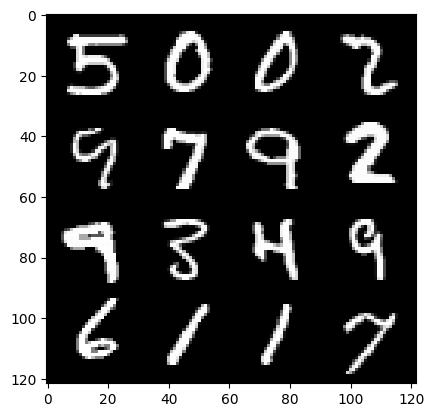

142: step 66600 / Gen loss: 90.73138417561847 / disc_loss:2.4835265695818036e-11


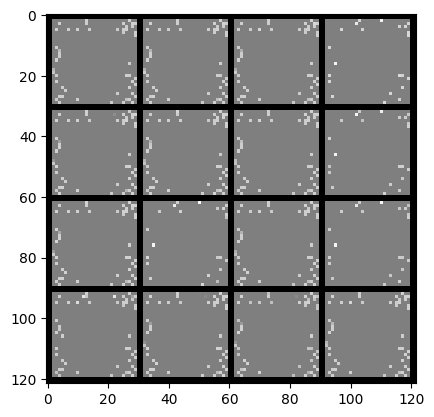

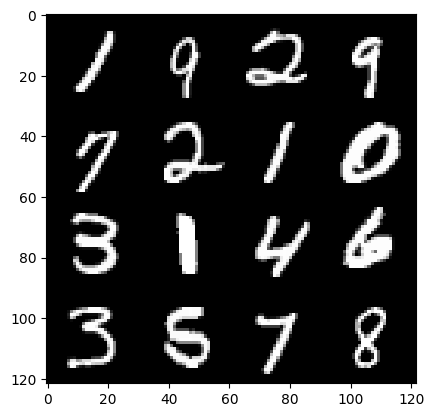

142: step 66900 / Gen loss: 90.77930386861159 / disc_loss:2.7939673907795294e-11


  0%|          | 0/469 [00:00<?, ?it/s]

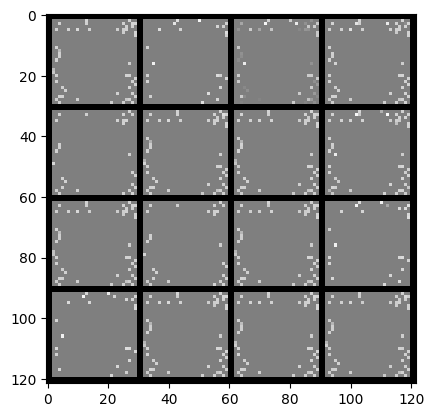

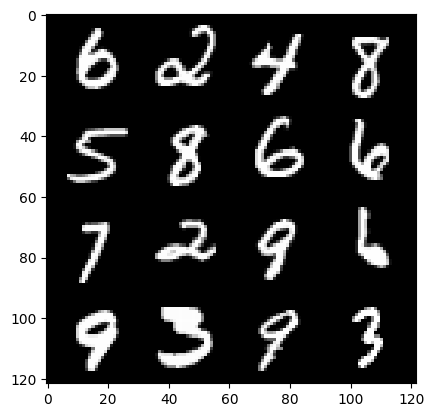

143: step 67200 / Gen loss: 90.80970133463546 / disc_loss:6.208816794028849e-12


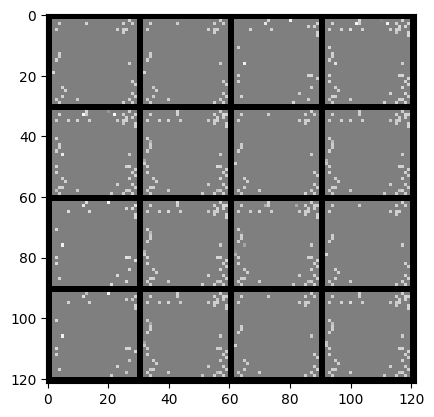

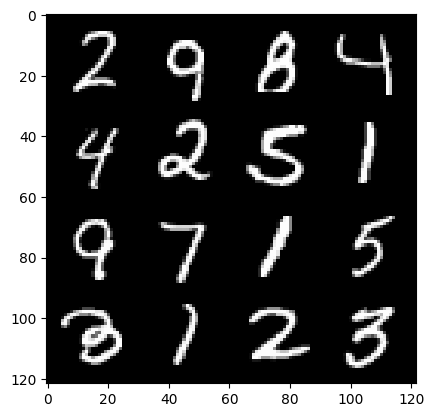

143: step 67500 / Gen loss: 90.83745834350582 / disc_loss:2.6387469709288074e-11


  0%|          | 0/469 [00:00<?, ?it/s]

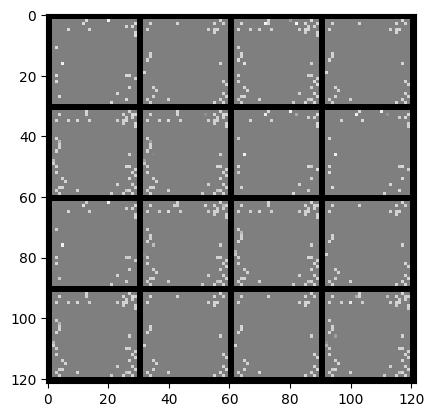

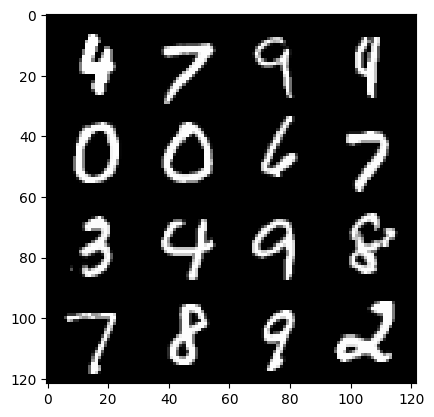

144: step 67800 / Gen loss: 90.88710871378585 / disc_loss:2.0178653100296395e-11


  0%|          | 0/469 [00:00<?, ?it/s]

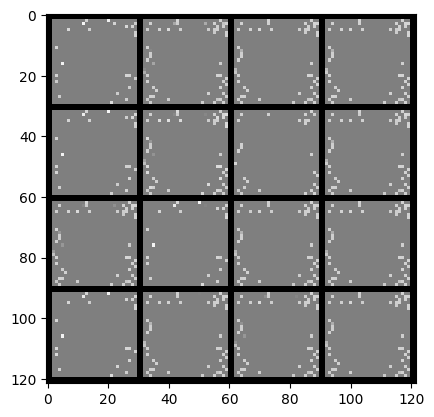

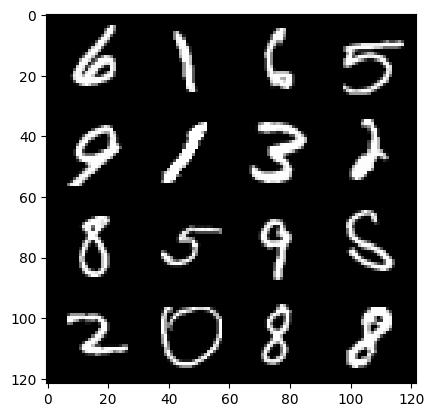

145: step 68100 / Gen loss: 90.92283569335942 / disc_loss:1.8626450012012204e-11


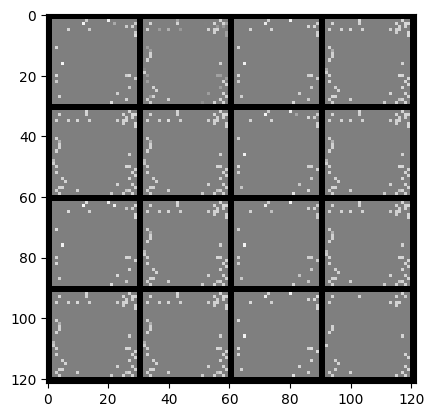

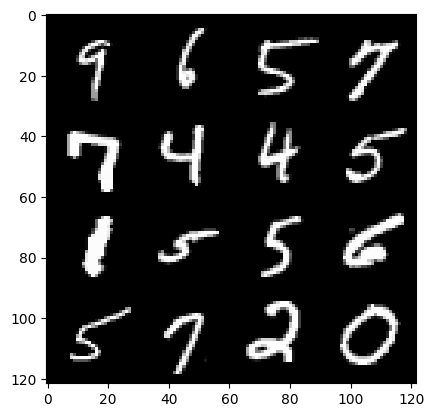

145: step 68400 / Gen loss: 90.96600435892742 / disc_loss:2.0178653100296395e-11


  0%|          | 0/469 [00:00<?, ?it/s]

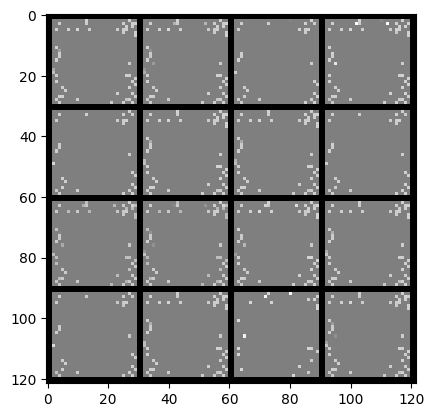

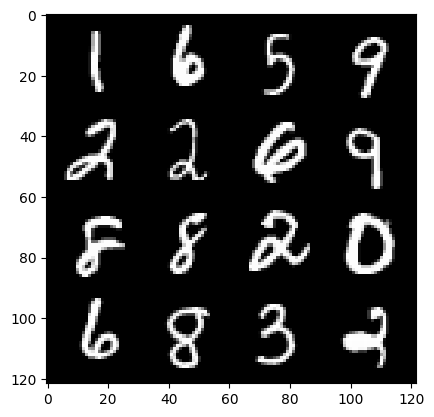

146: step 68700 / Gen loss: 91.00389951070152 / disc_loss:1.8626450012012207e-11


  0%|          | 0/469 [00:00<?, ?it/s]

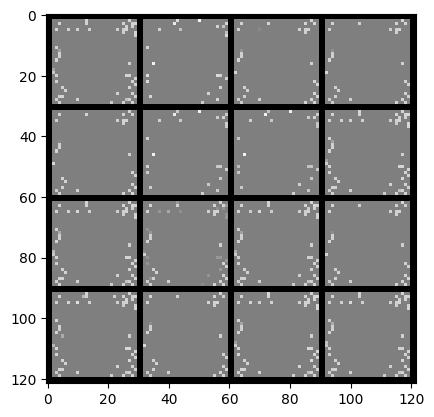

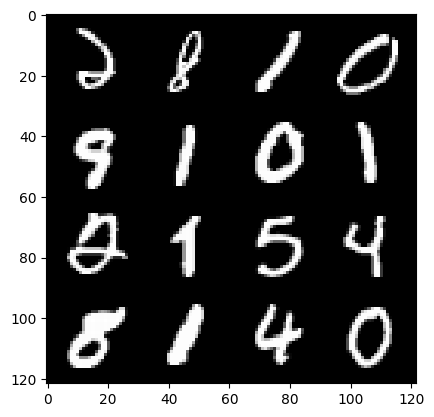

147: step 69000 / Gen loss: 91.03841400146489 / disc_loss:1.8626448901789182e-11


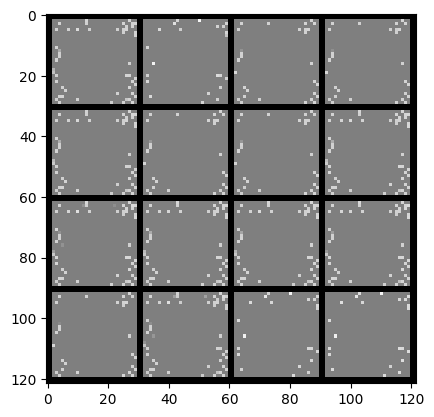

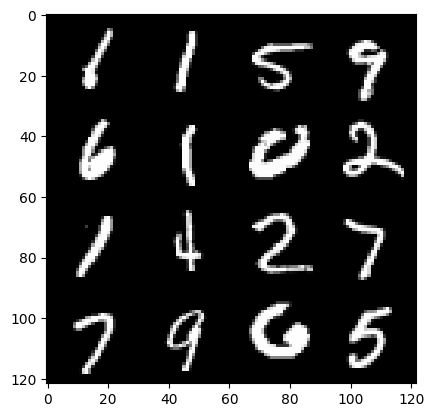

147: step 69300 / Gen loss: 91.07310424804692 / disc_loss:2.1730857483840777e-11


  0%|          | 0/469 [00:00<?, ?it/s]

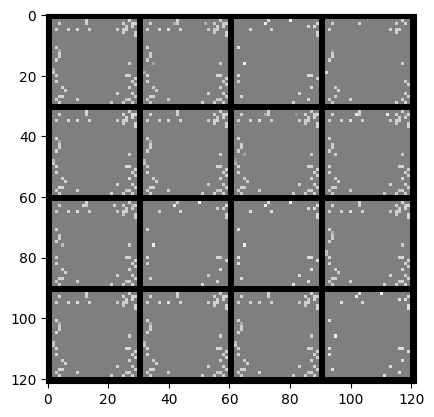

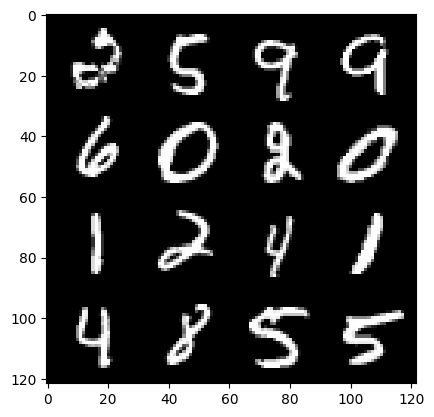

148: step 69600 / Gen loss: 91.11220685323076 / disc_loss:2.0178653100296395e-11


  0%|          | 0/469 [00:00<?, ?it/s]

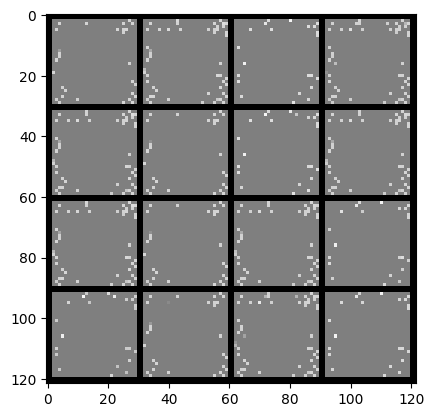

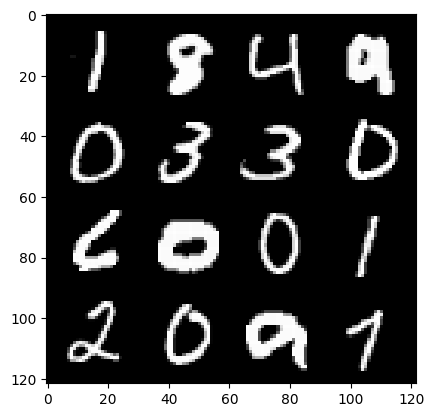

149: step 69900 / Gen loss: 91.14880762736007 / disc_loss:1.7074245813504994e-11


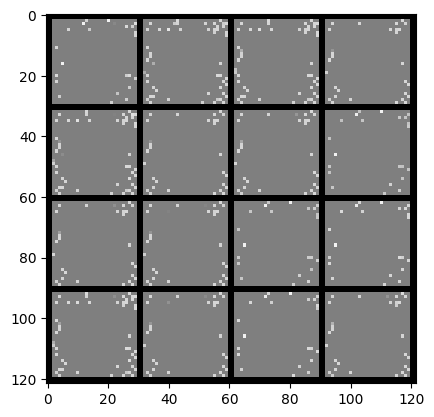

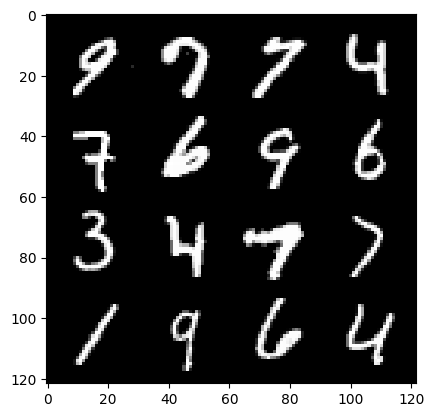

149: step 70200 / Gen loss: 91.18998687744134 / disc_loss:2.3283061497310822e-11


  0%|          | 0/469 [00:00<?, ?it/s]

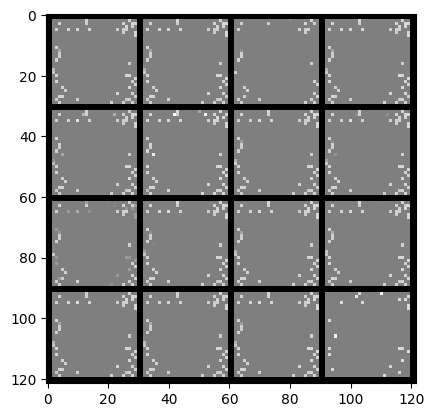

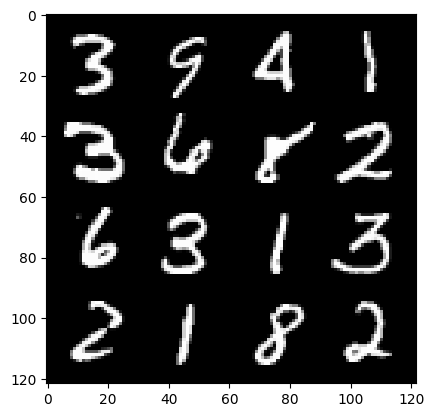

150: step 70500 / Gen loss: 91.22075220743822 / disc_loss:1.3969837601527738e-11


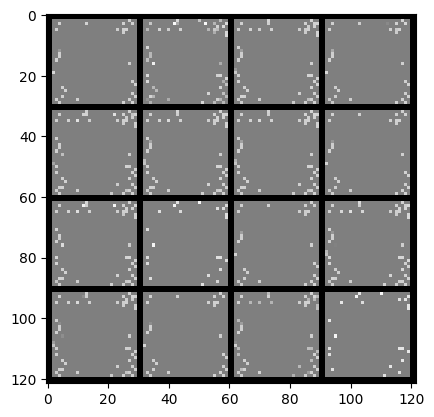

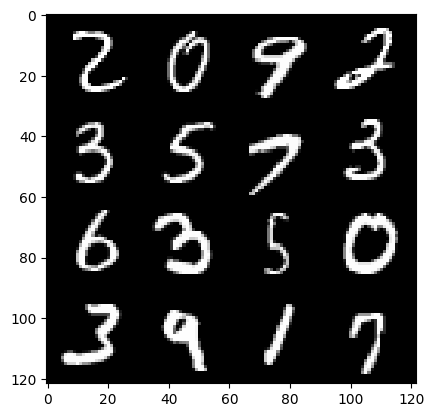

150: step 70800 / Gen loss: 91.25476244608551 / disc_loss:2.1730857761396534e-11


  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):            #real images, _ is for the labels, that we don't need here
    #discriminator
    disc_optimizer.zero_grad()

    cur_bs=len(real)
    real = real.view(cur_bs, -1)
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_function, gen, disc, cur_bs, real, z_dim)
    disc_loss.backward(retain_graph=True)       #calculate the gradients and goes backward and recalculate the parameters
    disc_optimizer.step()

    #generator

    gen_optimizer.zero_grad()
    gen_loss = calc_gen_loss(loss_function, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph=True)
    gen_optimizer.step()

    #average per step
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if current_step % info_step == 0 and current_step > 0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {current_step} / Gen loss: {mean_gen_loss} / disc_loss:{mean_disc_loss}")
      mean_gen_loss, mean_disc_loss = 0,0

    current_step+=1
